In [2]:
import numpy as np
from scipy.signal import hilbert
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import emd
from scipy.ndimage import gaussian_filter1d
from scipy.fft import fft, fftfreq

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

# Классификация функциональных состояний (раздел отчета 7)
## Содержание jupyter notebook (ссылки): <a id="contents"></a>
1. [Выделение пульсовой компоненты из участков сигнала до и после физической нагрузки](#pulse)
2. [Определение моментов сердечных сокращений в выделенной пульсовой компоненте](#beats)
3. [Вычисление последовательности RR-интервалов](#rr)
4. [(Бонус) Выделение дыхательной компоненты и вычисление частоты дыхания](#breath)
5. [Удаление выбросов из последовательности RR-интервалов](#nn)
6. [Вычисление параметров вариабельности сердечного ритма](#param)
7. [Вычисление параметров медленных колебаний гемодинамики](#mkg)
8. [Подготовка большего объема данных первого испытуемого для обучения](#more)
9. [Обучение и проверка моделей машинного обучения на полученных данных](#ml1)
10. [Подготовка данных второго испытуемого](#data2)
11. [Проверка моделей на данных второго испытуемого](#ml2)
12. [Обучение и проверка моделей на всех данных](#ml_all)

In [4]:
df_real = pd.read_excel('data/MAN_Head_DC_A.xlsx')
df_real

,Time,DC 1 A,DC 2 A,DC 3 A,DC 4 A,DC 5 A,DC 6 A,DC 7 A,DC 8 A,AUX 1
0,0.00,512.010066,727.514651,548.288913,641.929874,561.419827,705.661374,334.872388,664.059505,586
1,0.02,509.742405,726.103780,536.380851,647.891744,575.736564,686.338782,338.153866,657.174807,586
2,0.04,518.727670,729.606646,554.156957,647.664255,570.288968,689.959267,337.706392,648.689084,585
3,0.06,516.136407,731.155755,575.357476,650.314145,561.163056,718.371473,341.894654,661.942497,586
4,0.08,525.460648,772.878354,575.839541,673.196826,570.142495,708.106713,344.856067,684.899361,586
...,...,...,...,...,...,...,...,...,...,...
75525,1510.50,314.981379,444.993885,340.068702,429.934591,601.156884,735.020323,365.166488,752.106275,586
75526,1510.52,313.436815,449.707586,353.484207,430.535891,607.983384,726.233599,373.468737,745.486950,586
75527,1510.54,312.672235,450.879010,351.101582,421.970434,597.862778,735.460110,373.840412,757.401723,585
75528,1510.56,306.342228,443.541195,348.566809,414.426634,583.856681,740.662952,352.718346,740.061317,586


In [5]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 2 A'].values

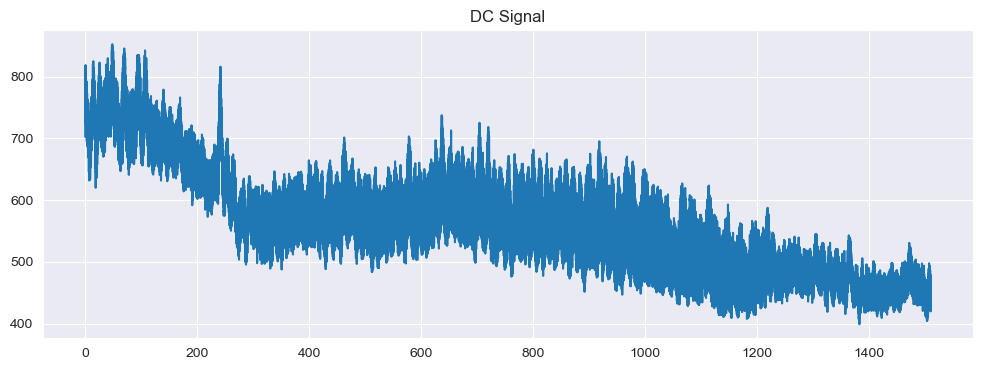

In [6]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_real, dc_real)
plt.title("DC Signal")
plt.show()

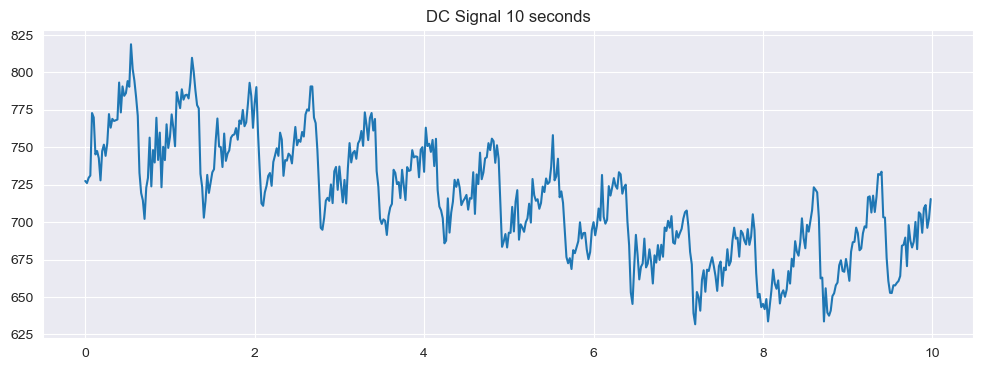

In [7]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_real[:500], dc_real[:500])
plt.title("DC Signal 10 seconds")
plt.show()

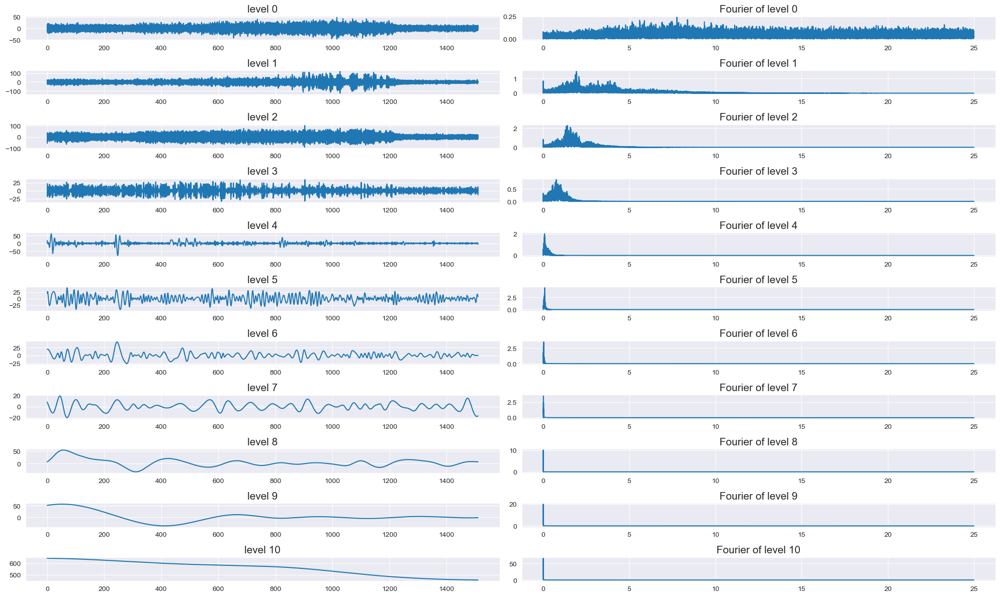

In [8]:
imf = emd.sift.sift(dc_real)
levels = imf.shape[1]
figure, axis = plt.subplots(levels, 2, figsize=(20, 12))
#plt.subplots_adjust(hspace=1.0)
for i in range(levels):
    axis[i][0].set_title('level '+str(i), fontsize=15)
    axis[i][0].plot(time_real, imf[:, i])

for i in range(levels):
    N = len(imf[:, i])
    spacing = 1 / 50
    fourierTransform = fft(imf[:, i] - np.average(imf[:, i]))
    frequencies = fftfreq(N, spacing)[: N // 2]
    axis[i][1].set_title('Fourier of level '+str(i), fontsize=15)
    axis[i][1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))

plt.tight_layout()
plt.show()

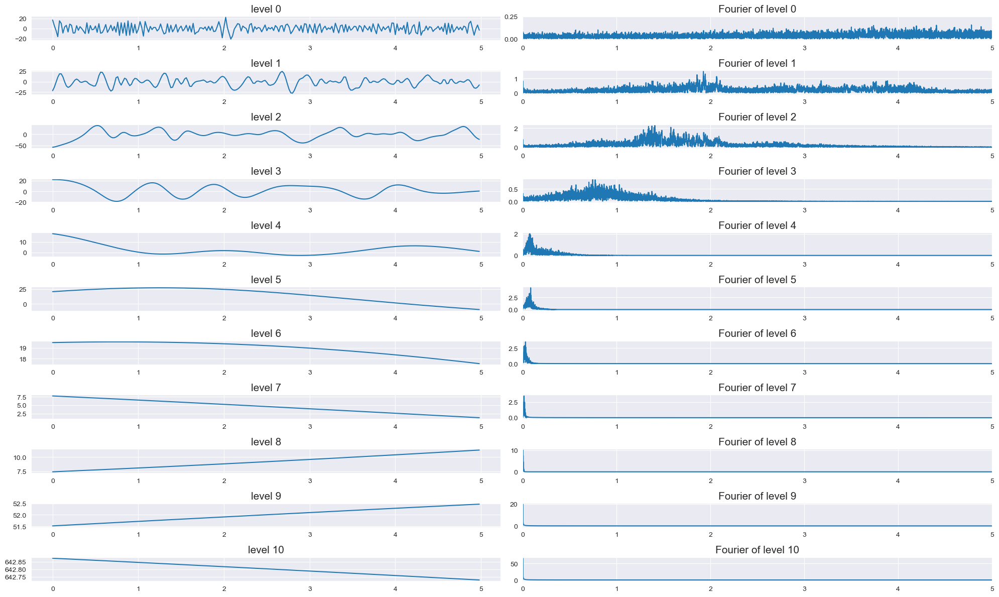

In [9]:
figure, axis = plt.subplots(levels, 2, figsize=(20, 12))
#plt.subplots_adjust(hspace=1.0)
for i in range(levels):
    axis[i][0].set_title('level '+str(i), fontsize=15)
    axis[i][0].plot(time_real[:250], imf[:, i][:250])

for i in range(levels):
    N = len(imf[:, i])
    spacing = 1 / 50
    fourierTransform = fft(imf[:, i] - np.average(imf[:, i]))
    frequencies = fftfreq(N, spacing)[: N // 2]
    axis[i][1].set_title('Fourier of level '+str(i), fontsize=15)
    axis[i][1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))
    axis[i][1].set_xlim([0, 5])

plt.tight_layout()
plt.show()

In [10]:
pulse_12 = imf[:, 1] + imf[:, 2]
pulse_123 = imf[:, 1] + imf[:, 2] + imf[:, 3]

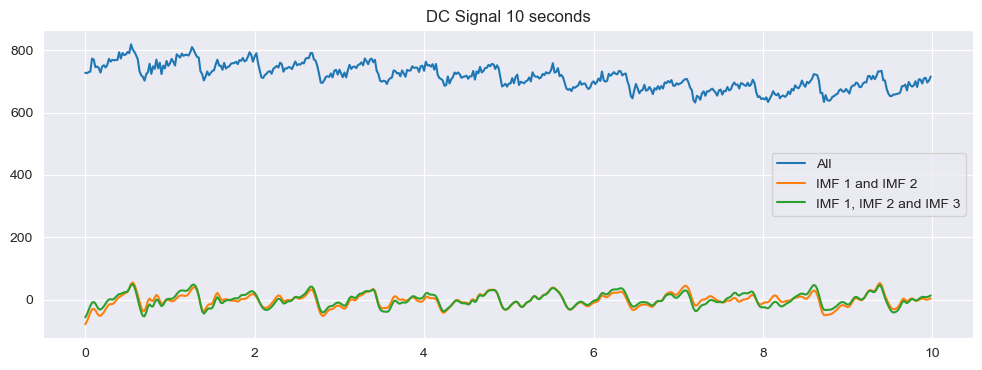

In [11]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_real[:500], dc_real[:500])
plt.plot(time_real[:500], pulse_12[:500])
plt.plot(time_real[:500], pulse_123[:500])
plt.legend(["All", "IMF 1 and IMF 2", "IMF 1, IMF 2 and IMF 3"])
plt.title("DC Signal 10 seconds")
plt.show()

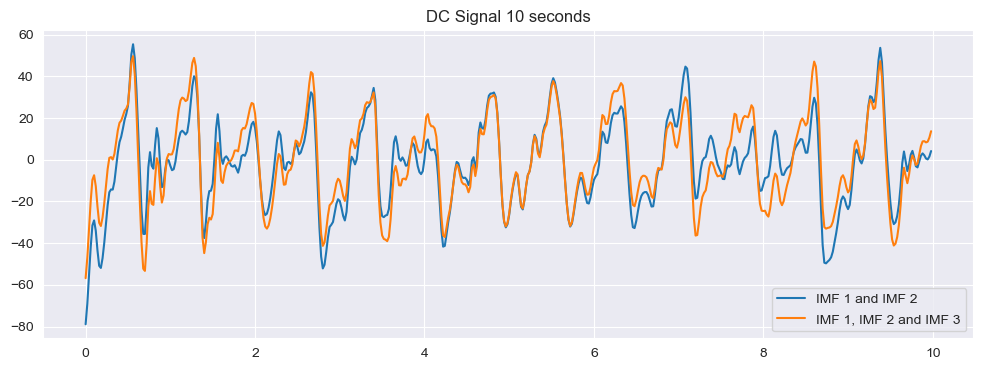

In [12]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_real[:500], pulse_12[:500])
plt.plot(time_real[:500], pulse_123[:500])
plt.legend(["IMF 1 and IMF 2", "IMF 1, IMF 2 and IMF 3"])
plt.title("DC Signal 10 seconds")
plt.show()

In [13]:
pulse_2 = imf[:, 2]
pulse_23 = imf[:, 2] + imf[:, 3]

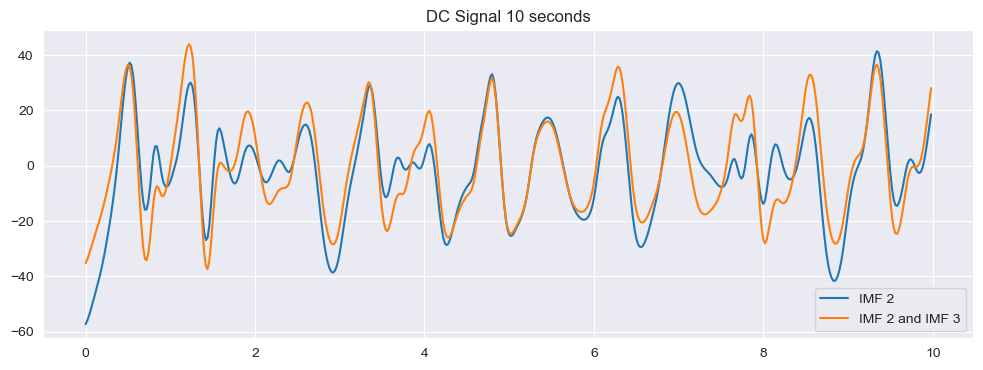

In [14]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_real[:500], pulse_2[:500])
plt.plot(time_real[:500], pulse_23[:500])
plt.legend(["IMF 2", "IMF 2 and IMF 3"])
plt.title("DC Signal 10 seconds")
plt.show()

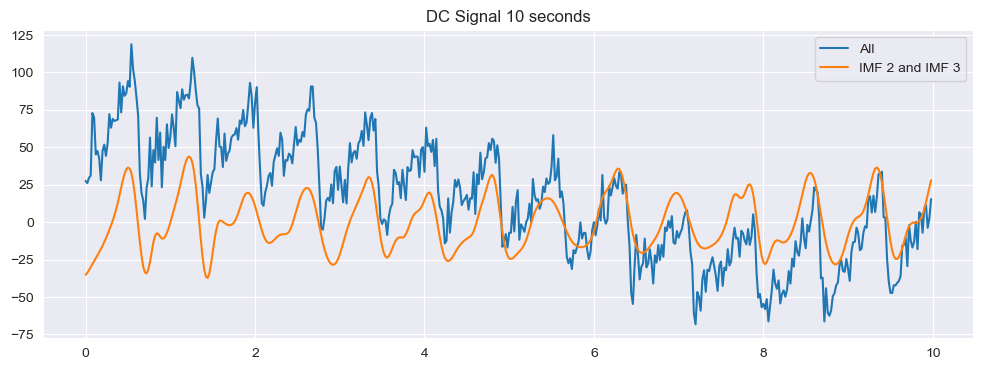

In [15]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_real[:500], (dc_real - 700)[:500])
plt.plot(time_real[:500], pulse_23[:500])
plt.legend(["All", "IMF 2 and IMF 3"])
plt.title("DC Signal 10 seconds")
plt.show()

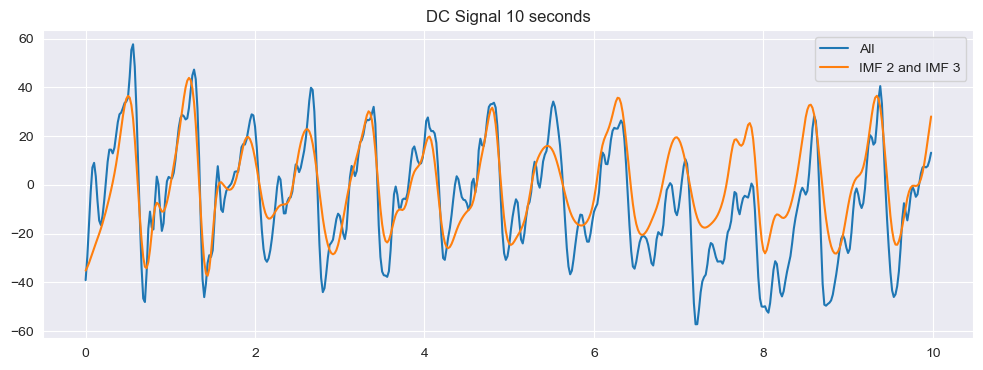

In [16]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_real[:500], (dc_real - imf[:, 0] - imf[:, 10] - imf[:, 9] - imf[:, 8] \
                           - imf[:, 7] - imf[:, 6] - imf[:, 5])[:500])
plt.plot(time_real[:500], pulse_23[:500])
plt.legend(["All", "IMF 2 and IMF 3"])
plt.title("DC Signal 10 seconds")
plt.show()

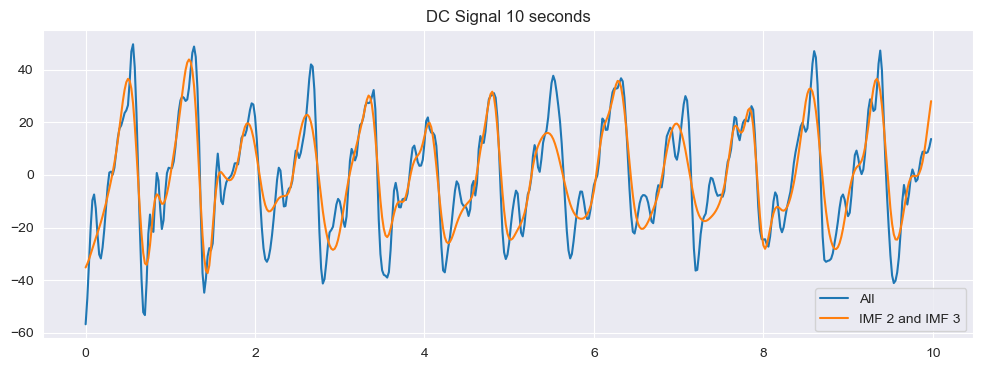

In [17]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_real[:500], (dc_real - imf[:, 0] - imf[:, 10] - imf[:, 9] - imf[:, 8] \
                           - imf[:, 7] - imf[:, 6] - imf[:, 5] - imf[:, 4])[:500])
plt.plot(time_real[:500], pulse_23[:500])
plt.legend(["All", "IMF 2 and IMF 3"])
plt.title("DC Signal 10 seconds")
plt.show()

In [18]:
new_dc = dc_real - imf[:, 0] - imf[:, 10] - imf[:, 9] - imf[:, 8] \
                           - imf[:, 7] - imf[:, 6] - imf[:, 5]

### Выделение пульсовой компоненты из участков сигнала до и после физической нагрузки <a id="pulse"></a>
[Вернуться к содержанию](#contents)

In [19]:
dc_base = dc_real[:15000]
dc_walk_1 = dc_real[15000:30000]
dc_walk_2 = dc_real[30000:45000]
dc_walk_3 = dc_real[45000:60000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_walk_1 = time_real[15000:30000]
time_walk_2 = time_real[30000:45000]
time_walk_3 = time_real[45000:60000]
time_rest = time_real[60000:75000]

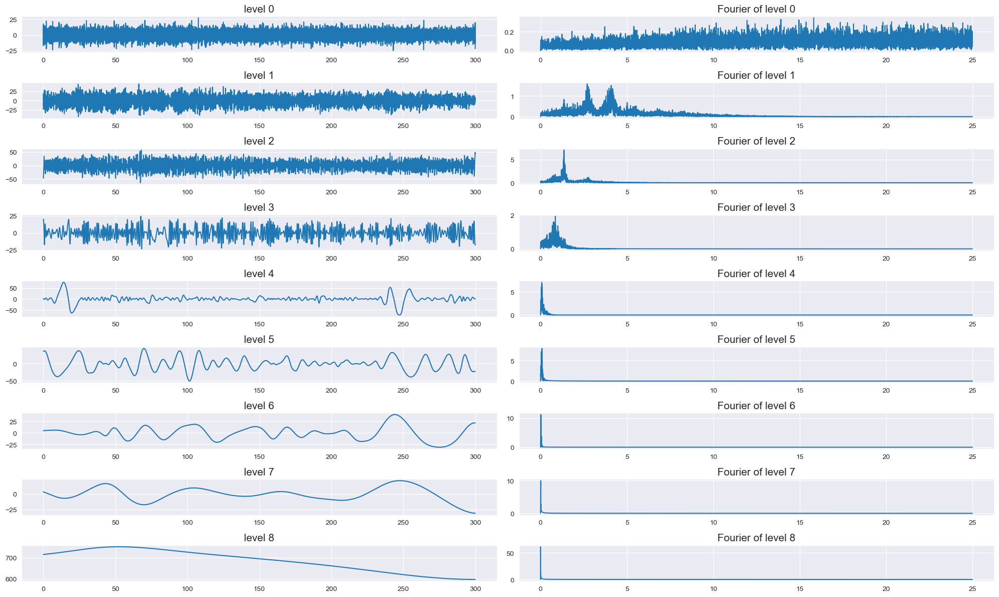

In [20]:
imf_base = emd.sift.sift(dc_base)
levels = imf_base.shape[1]
figure, axis = plt.subplots(levels, 2, figsize=(20, 12))
#plt.subplots_adjust(hspace=1.0)
for i in range(levels):
    axis[i][0].set_title('level '+str(i), fontsize=15)
    axis[i][0].plot(time_base, imf_base[:, i])

for i in range(levels):
    N = len(imf_base[:, i])
    spacing = 1 / 50
    fourierTransform = fft(imf_base[:, i] - np.average(imf_base[:, i]))
    frequencies = fftfreq(N, spacing)[: N // 2]
    axis[i][1].set_title('Fourier of level '+str(i), fontsize=15)
    axis[i][1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))

plt.tight_layout()
plt.show()

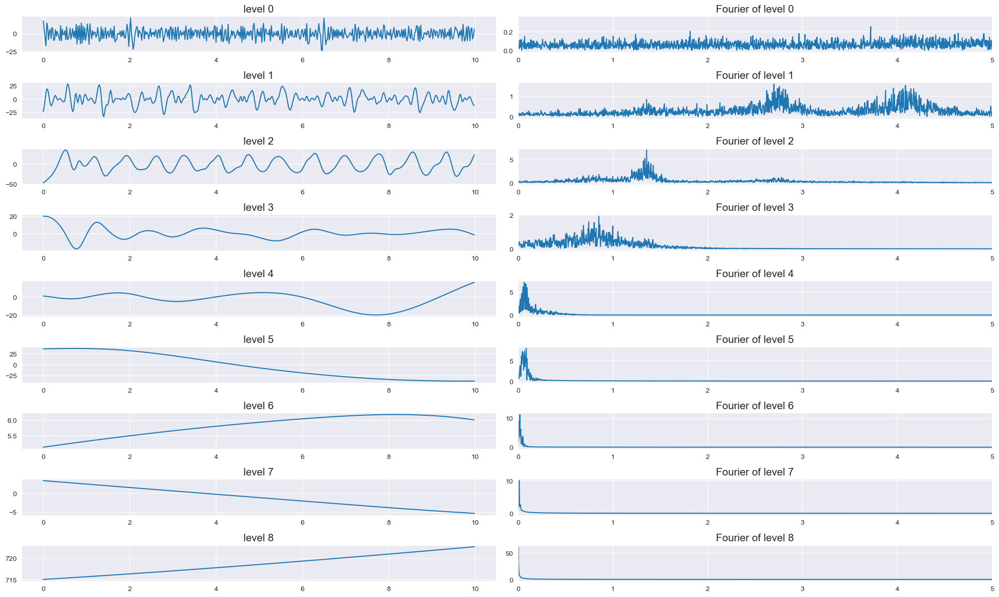

In [21]:
figure, axis = plt.subplots(levels, 2, figsize=(20, 12))
#plt.subplots_adjust(hspace=1.0)
for i in range(levels):
    axis[i][0].set_title('level '+str(i), fontsize=15)
    axis[i][0].plot(time_real[:500], imf_base[:, i][:500])

for i in range(levels):
    N = len(imf_base[:, i])
    spacing = 1 / 50
    fourierTransform = fft(imf_base[:, i] - np.average(imf_base[:, i]))
    frequencies = fftfreq(N, spacing)[: N // 2]
    axis[i][1].set_title('Fourier of level '+str(i), fontsize=15)
    axis[i][1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))
    axis[i][1].set_xlim([0, 5])

plt.tight_layout()
plt.show()

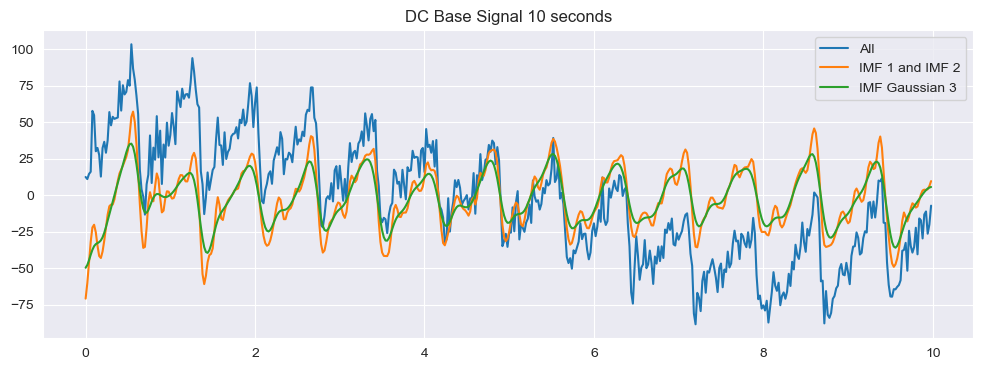

In [22]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[:500], dc_base[:500] - imf_base[:, 8][:500])
plt.plot(time_base[:500], imf_base[:, 1][:500] + imf_base[:, 2][:500])
plt.plot(time_base[:500], gaussian_filter1d(imf_base[:, 1][:500] + imf_base[:, 2][:500], 3))
plt.legend(["All", "IMF 1 and IMF 2", "IMF Gaussian 3"])
plt.title("DC Base Signal 10 seconds")
plt.show()

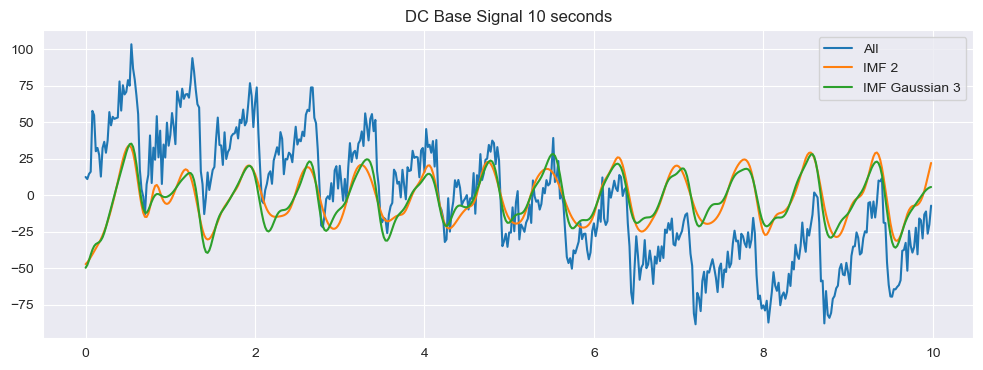

In [23]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[:500], dc_base[:500] - imf_base[:, 8][:500])
plt.plot(time_base[:500], imf_base[:, 2][:500])
plt.plot(time_base[:500], gaussian_filter1d(imf_base[:, 1][:500] + imf_base[:, 2][:500], 3))
plt.legend(["All", "IMF 2", "IMF Gaussian 3"])
plt.title("DC Base Signal 10 seconds")
plt.show()

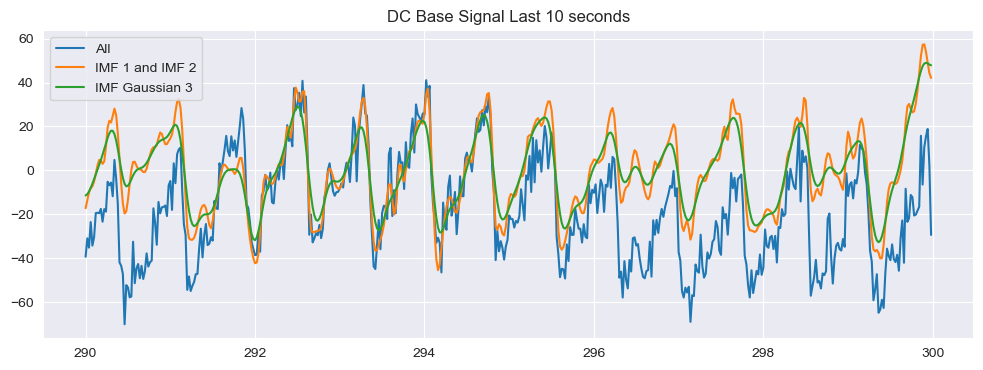

In [24]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[-500:], dc_base[-500:] - imf_base[:, 8][-500:])
plt.plot(time_base[-500:], imf_base[:, 1][-500:] + imf_base[:, 2][-500:])
plt.plot(time_base[-500:], gaussian_filter1d(imf_base[:, 1][-500:] + imf_base[:, 2][-500:], 3))
plt.legend(["All", "IMF 1 and IMF 2", "IMF Gaussian 3"])
plt.title("DC Base Signal Last 10 seconds")
plt.show()

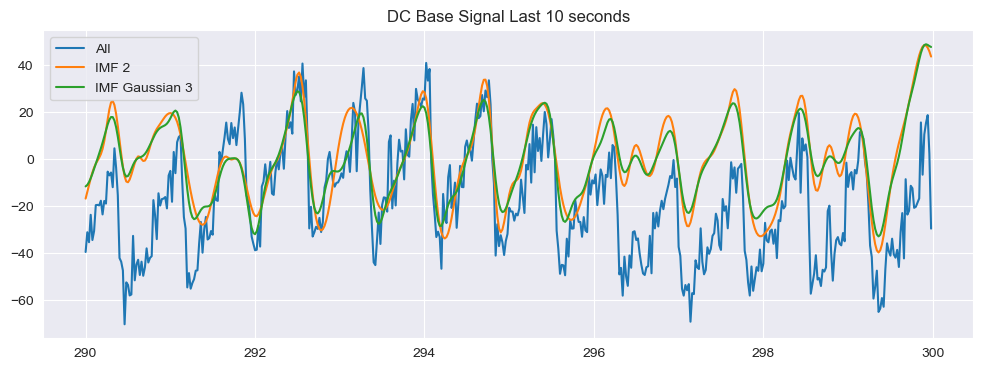

In [25]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[-500:], dc_base[-500:] - imf_base[:, 8][-500:])
plt.plot(time_base[-500:], imf_base[:, 2][-500:])
plt.plot(time_base[-500:], gaussian_filter1d(imf_base[:, 1][-500:] + imf_base[:, 2][-500:], 3))
plt.legend(["All", "IMF 2", "IMF Gaussian 3"])
plt.title("DC Base Signal Last 10 seconds")
plt.show()

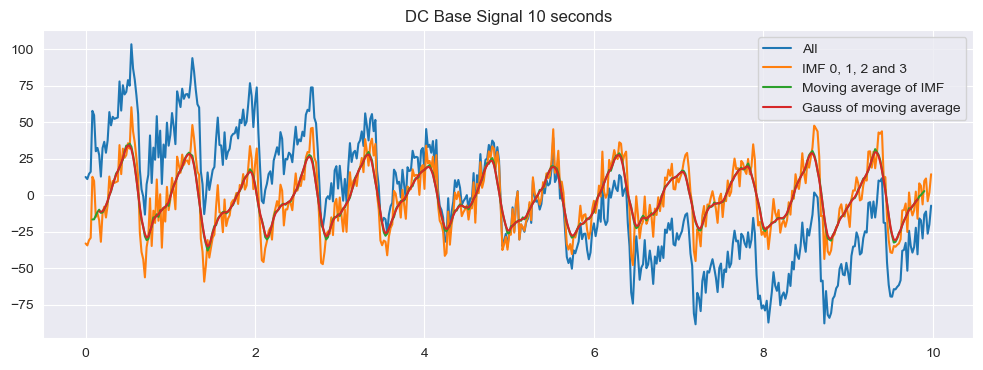

In [26]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[:500], dc_base[:500] - imf_base[:, 8][:500])
segment = imf_base[:, 0][:500] + imf_base[:, 1][:500] + imf_base[:, 2][:500] + imf_base[:, 3][:500]
plt.plot(time_base[:500], segment)
segment_trend = pd.Series(segment).rolling(9, center=True).mean().to_numpy()
plt.plot(time_base[:500], segment_trend)
plt.plot(time_base[:500], gaussian_filter1d(segment_trend, 1))
plt.legend(["All", "IMF 0, 1, 2 and 3", "Moving average of IMF", "Gauss of moving average"])
plt.title("DC Base Signal 10 seconds")
plt.show()

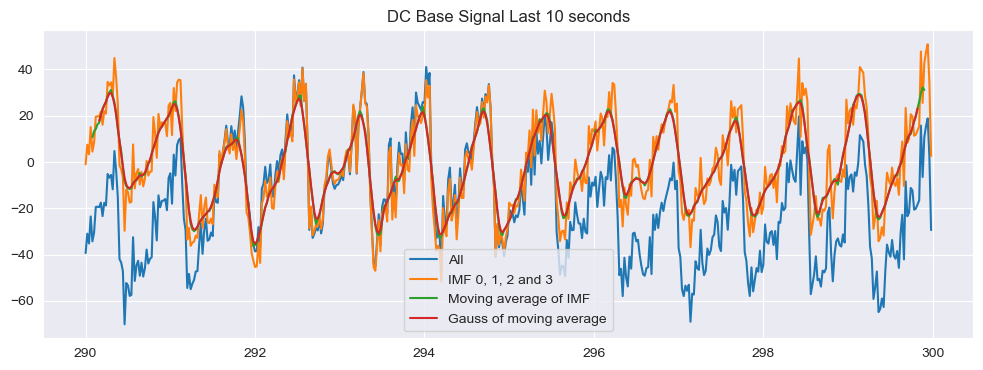

In [27]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[-500:], dc_base[-500:] - imf_base[:, 8][-500:])
segment = imf_base[:, 0][-500:] + imf_base[:, 1][-500:] + imf_base[:, 2][-500:] + imf_base[:, 3][-500:]
plt.plot(time_base[-500:], segment)
segment_trend = pd.Series(segment).rolling(9, center=True).mean().to_numpy()
plt.plot(time_base[-500:], segment_trend)
plt.plot(time_base[-500:], gaussian_filter1d(segment_trend, 1))
plt.legend(["All", "IMF 0, 1, 2 and 3", "Moving average of IMF", "Gauss of moving average"])
plt.title("DC Base Signal Last 10 seconds")
plt.show()

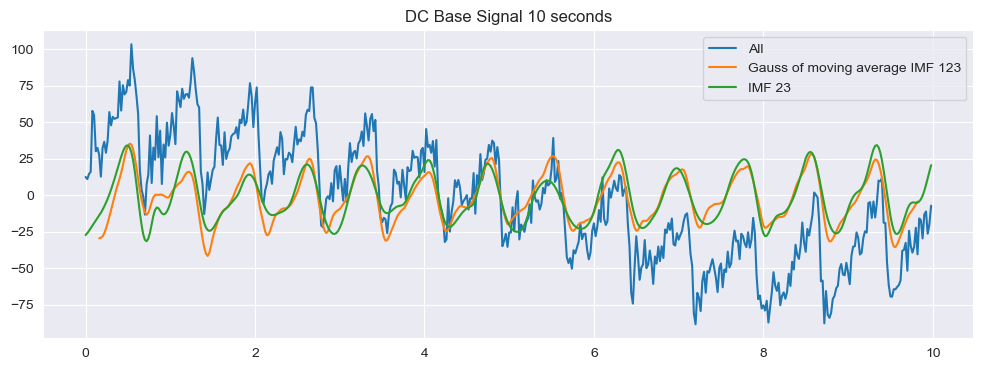

In [28]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[:500], dc_base[:500] - imf_base[:, 8][:500])
segment = imf_base[:, 0][:500] + imf_base[:, 1][:500] + imf_base[:, 2][:500]
segment_trend = pd.Series(segment).rolling(9, center=True).mean().to_numpy()
plt.plot(time_base[:500], gaussian_filter1d(segment_trend, 1))
plt.plot(time_base[:500], imf_base[:, 2][:500] + imf_base[:, 3][:500])
plt.legend(["All", "Gauss of moving average IMF 123", "IMF 23"])
plt.title("DC Base Signal 10 seconds")
plt.show()

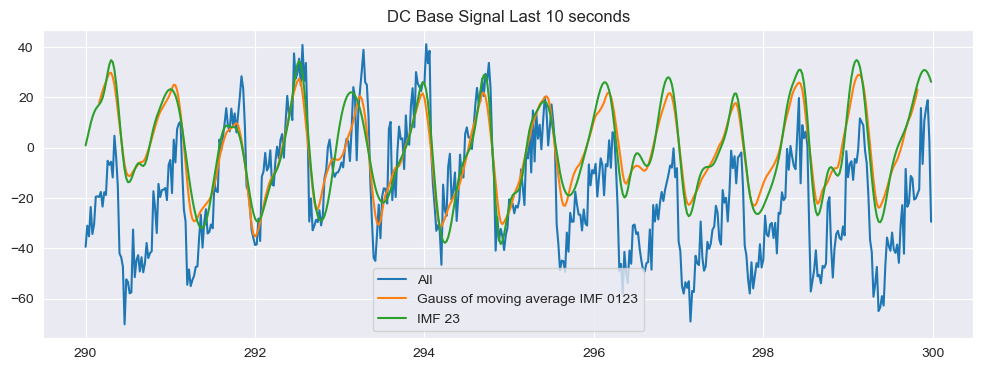

In [29]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[-500:], dc_base[-500:] - imf_base[:, 8][-500:])
segment = imf_base[:, 0][-500:] + imf_base[:, 1][-500:] + imf_base[:, 2][-500:] + imf_base[:, 3][-500:]
segment_trend = pd.Series(segment).rolling(9, center=True).mean().to_numpy()
plt.plot(time_base[-500:], gaussian_filter1d(segment_trend, 1))
plt.plot(time_base[-500:], imf_base[:, 2][-500:] + imf_base[:, 3][-500:])
plt.legend(["All", "Gauss of moving average IMF 0123", "IMF 23"])
plt.title("DC Base Signal Last 10 seconds")
plt.show()

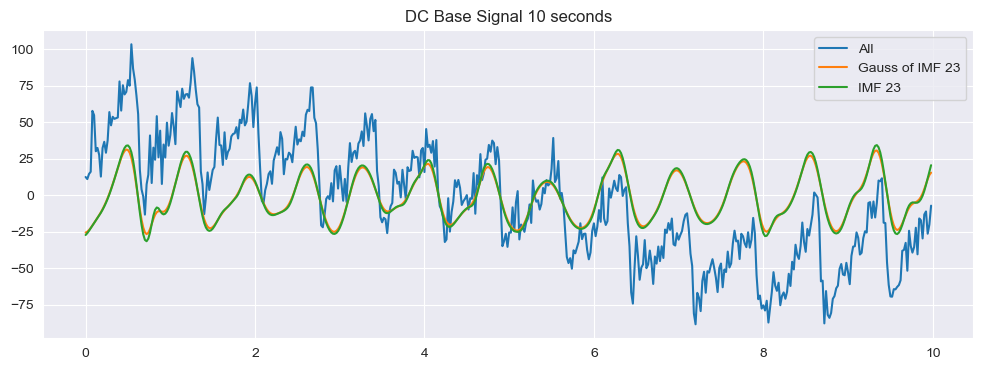

In [30]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[:500], dc_base[:500] - imf_base[:, 8][:500])
segment = imf_base[:, 2][:500] + imf_base[:, 3][:500]
plt.plot(time_base[:500], gaussian_filter1d(segment, 2))
plt.plot(time_base[:500], imf_base[:, 2][:500] + imf_base[:, 3][:500])
plt.legend(["All", "Gauss of IMF 23", "IMF 23"])
plt.title("DC Base Signal 10 seconds")
plt.show()

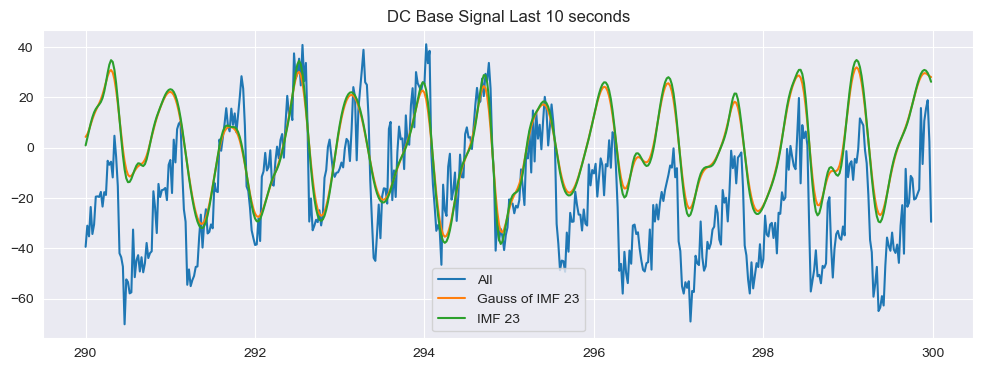

In [31]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[-500:], dc_base[-500:] - imf_base[:, 8][-500:])
segment = imf_base[:, 2][-500:] + imf_base[:, 3][-500:]
plt.plot(time_base[-500:], gaussian_filter1d(segment, 2))
plt.plot(time_base[-500:], imf_base[:, 2][-500:] + imf_base[:, 3][-500:])
plt.legend(["All", "Gauss of IMF 23", "IMF 23"])
plt.title("DC Base Signal Last 10 seconds")
plt.show()

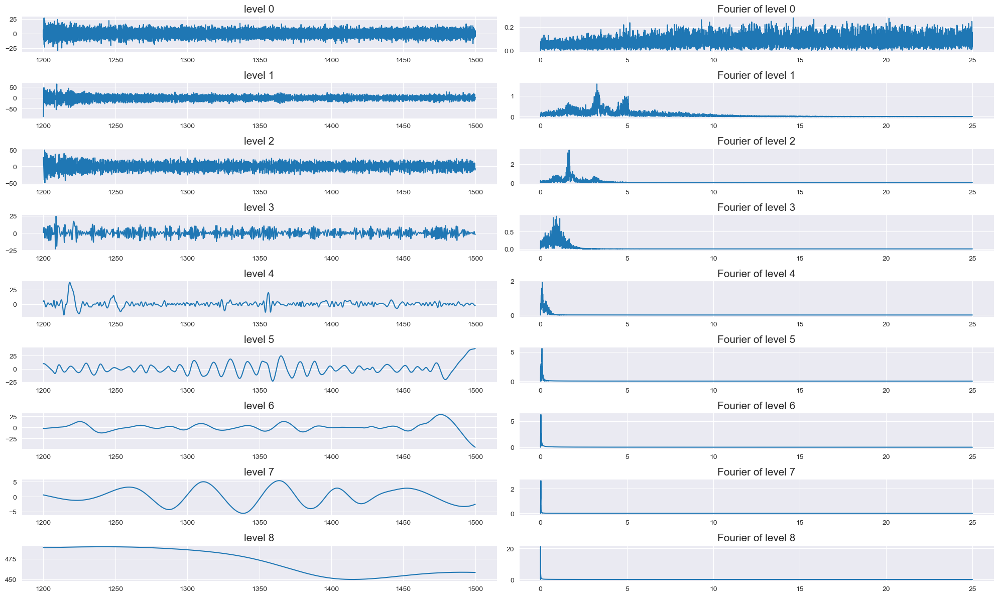

In [32]:
imf_rest = emd.sift.sift(dc_rest)
levels = imf_rest.shape[1]
figure, axis = plt.subplots(levels, 2, figsize=(20, 12))
#plt.subplots_adjust(hspace=1.0)
for i in range(levels):
    axis[i][0].set_title('level '+str(i), fontsize=15)
    axis[i][0].plot(time_rest, imf_rest[:, i])

for i in range(levels):
    N = len(imf_rest[:, i])
    spacing = 1 / 50
    fourierTransform = fft(imf_rest[:, i] - np.average(imf_rest[:, i]))
    frequencies = fftfreq(N, spacing)[: N // 2]
    axis[i][1].set_title('Fourier of level '+str(i), fontsize=15)
    axis[i][1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))

plt.tight_layout()
plt.show()

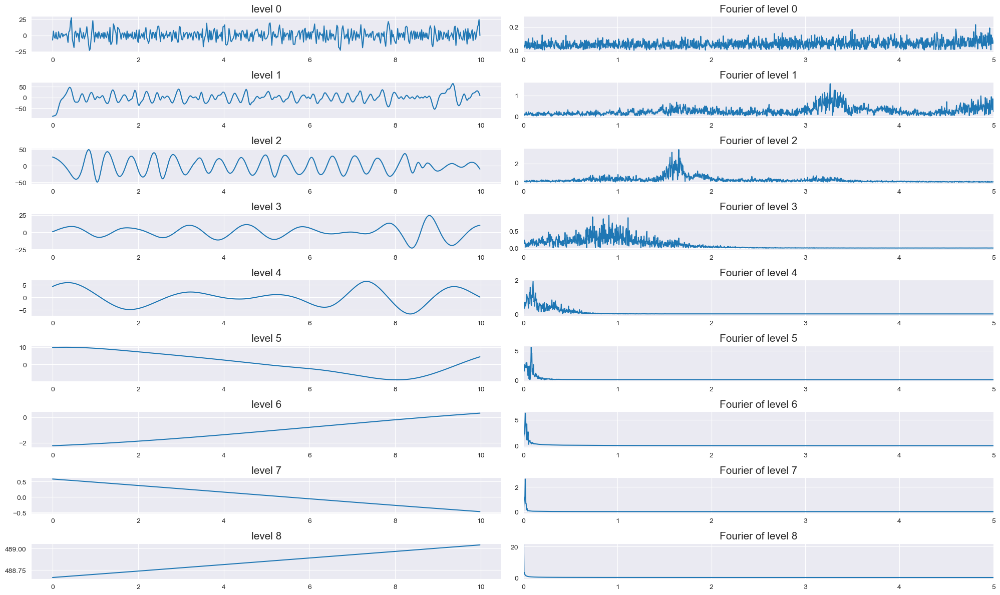

In [33]:
figure, axis = plt.subplots(levels, 2, figsize=(20, 12))
#plt.subplots_adjust(hspace=1.0)
for i in range(levels):
    axis[i][0].set_title('level '+str(i), fontsize=15)
    axis[i][0].plot(time_real[:500], imf_rest[:, i][:500])

for i in range(levels):
    N = len(imf_rest[:, i])
    spacing = 1 / 50
    fourierTransform = fft(imf_rest[:, i] - np.average(imf_rest[:, i]))
    frequencies = fftfreq(N, spacing)[: N // 2]
    axis[i][1].set_title('Fourier of level '+str(i), fontsize=15)
    axis[i][1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))
    axis[i][1].set_xlim([0, 5])

plt.tight_layout()
plt.show()

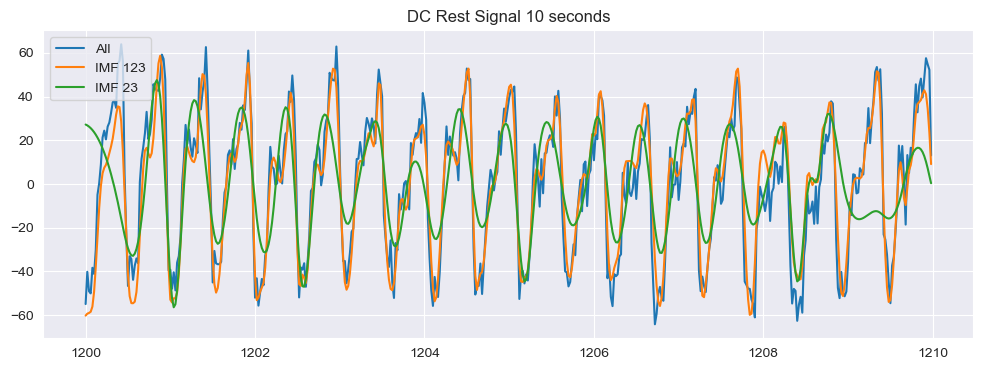

In [34]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_rest[:500], dc_rest[:500] - imf_rest[:, 8][:500])
plt.plot(time_rest[:500], imf_rest[:, 1][:500] + imf_rest[:, 2][:500] + imf_rest[:, 3][:500])
plt.plot(time_rest[:500], imf_rest[:, 2][:500] + imf_rest[:, 3][:500])
plt.legend(["All", "IMF 123", "IMF 23"])
plt.title("DC Rest Signal 10 seconds")
plt.show()

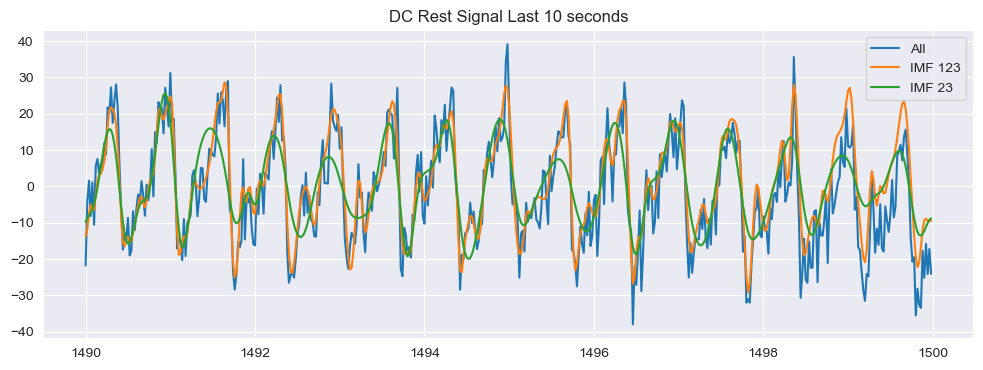

In [35]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_rest[-500:], dc_rest[-500:] - imf_rest[:, 8][-500:])
plt.plot(time_rest[-500:], imf_rest[:, 1][-500:] + imf_rest[:, 2][-500:] + imf_rest[:, 3][-500:])
plt.plot(time_rest[-500:], imf_rest[:, 2][-500:] + imf_rest[:, 3][-500:])
plt.legend(["All", "IMF 123", "IMF 23"])
plt.title("DC Rest Signal Last 10 seconds")
plt.show()

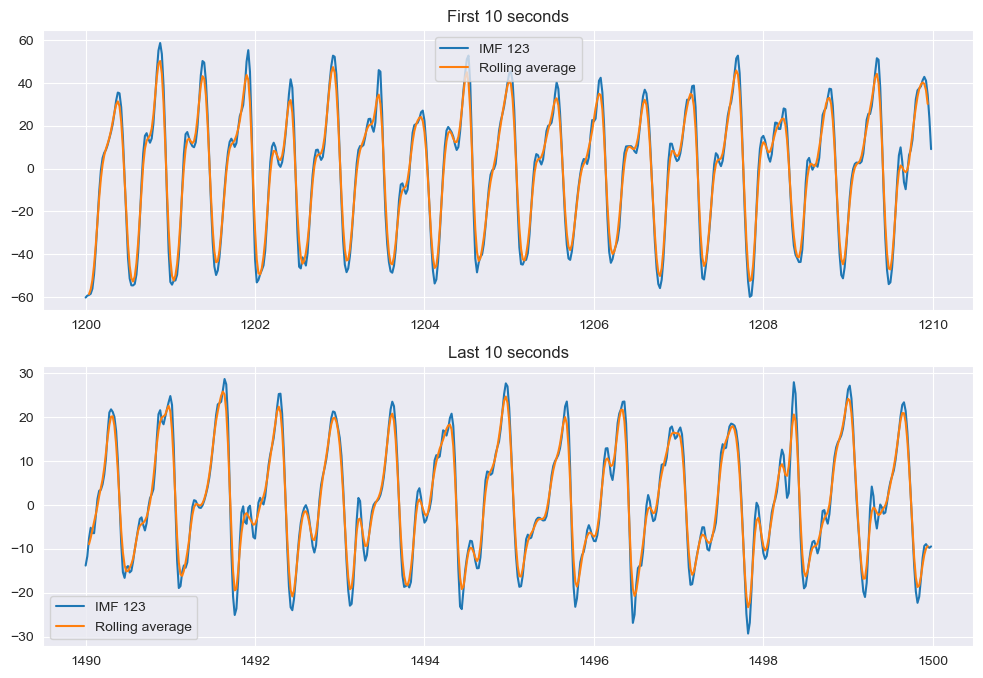

In [36]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

segment = imf_rest[:, 1][:500] + imf_rest[:, 2][:500] + imf_rest[:, 3][:500]
axis[0].plot(time_rest[:500], segment)
segment_trend = pd.Series(segment).rolling(5, center=True).mean().to_numpy()
axis[0].plot(time_rest[:500], segment_trend)
axis[0].set_title("First 10 seconds")
axis[0].legend(["IMF 123", "Rolling average"])

segment = imf_rest[:, 1][-500:] + imf_rest[:, 2][-500:] + imf_rest[:, 3][-500:]
axis[1].plot(time_rest[-500:], segment)
segment_trend = pd.Series(segment).rolling(5, center=True).mean().to_numpy()
axis[1].plot(time_rest[-500:], segment_trend)
axis[1].set_title("Last 10 seconds")
axis[1].legend(["IMF 123", "Rolling average"])

plt.show()

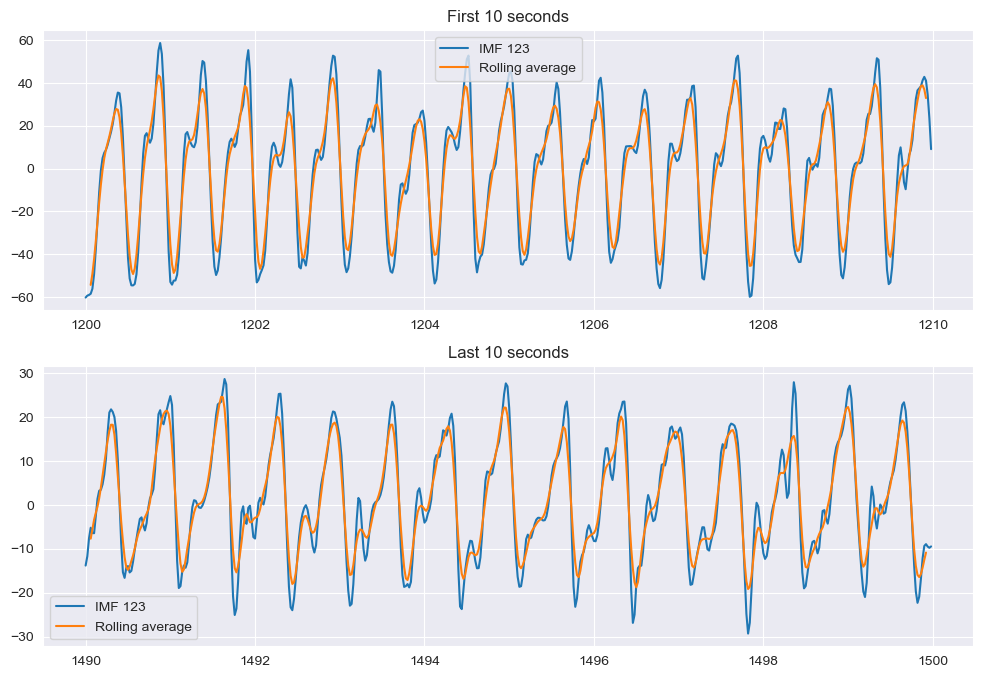

In [37]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

segment = imf_rest[:, 1][:500] + imf_rest[:, 2][:500] + imf_rest[:, 3][:500]
axis[0].plot(time_rest[:500], segment)
segment_trend = pd.Series(segment).rolling(7, center=True).mean().to_numpy()
axis[0].plot(time_rest[:500], segment_trend)
axis[0].set_title("First 10 seconds")
axis[0].legend(["IMF 123", "Rolling average"])

segment = imf_rest[:, 1][-500:] + imf_rest[:, 2][-500:] + imf_rest[:, 3][-500:]
axis[1].plot(time_rest[-500:], segment)
segment_trend = pd.Series(segment).rolling(7, center=True).mean().to_numpy()
axis[1].plot(time_rest[-500:], segment_trend)
axis[1].set_title("Last 10 seconds")
axis[1].legend(["IMF 123", "Rolling average"])

plt.show()

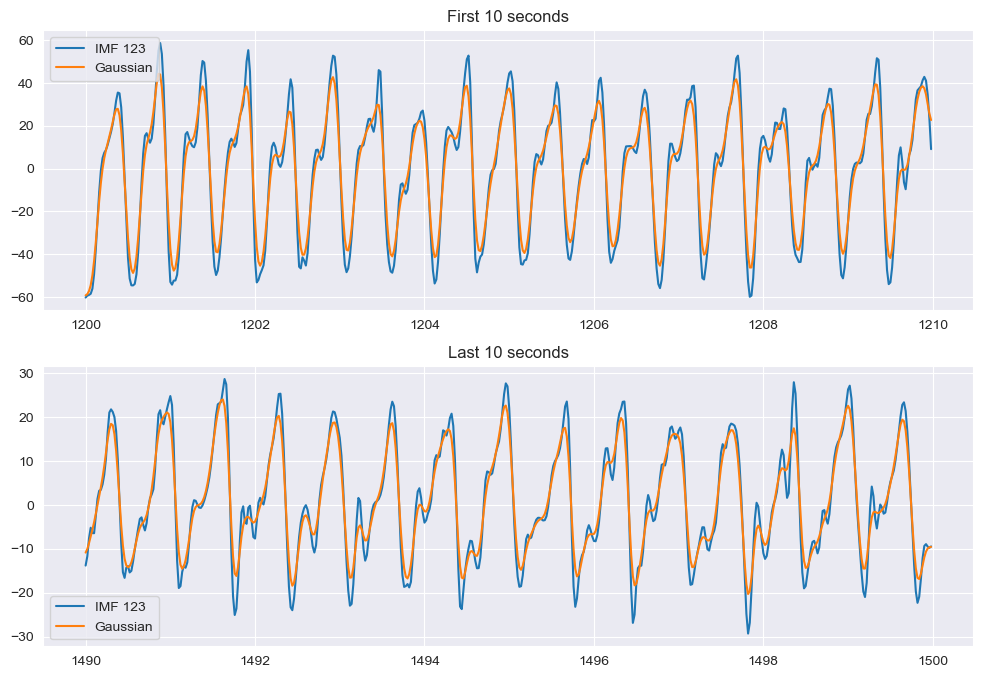

In [38]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

segment = imf_rest[:, 1][:500] + imf_rest[:, 2][:500] + imf_rest[:, 3][:500]
axis[0].plot(time_rest[:500], segment)
segment_trend = gaussian_filter1d(segment, 2)
axis[0].plot(time_rest[:500], segment_trend)
axis[0].set_title("First 10 seconds")
axis[0].legend(["IMF 123", "Gaussian"])

segment = imf_rest[:, 1][-500:] + imf_rest[:, 2][-500:] + imf_rest[:, 3][-500:]
axis[1].plot(time_rest[-500:], segment)
segment_trend = gaussian_filter1d(segment, 2)
axis[1].plot(time_rest[-500:], segment_trend)
axis[1].set_title("Last 10 seconds")
axis[1].legend(["IMF 123", "Gaussian"])

plt.show()

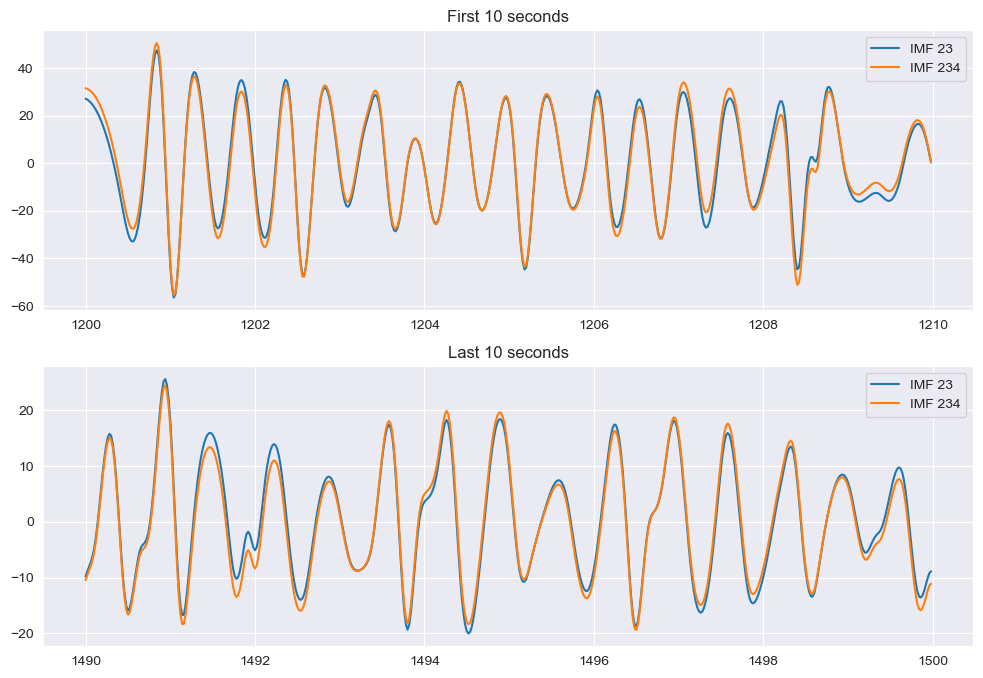

In [39]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_rest[:500], imf_rest[:, 2][:500] + imf_rest[:, 3][:500])
axis[0].plot(time_rest[:500], imf_rest[:, 2][:500] + imf_rest[:, 3][:500] + imf_rest[:, 4][:500])
axis[0].set_title("First 10 seconds")
axis[0].legend(["IMF 23", "IMF 234"])

axis[1].plot(time_rest[-500:], imf_rest[:, 2][-500:] + imf_rest[:, 3][-500:])
axis[1].plot(time_rest[-500:], imf_rest[:, 2][-500:] + imf_rest[:, 3][-500:] + imf_rest[:, 4][-500:])
axis[1].set_title("Last 10 seconds")
axis[1].legend(["IMF 23", "IMF 234"])

plt.show()

### Определение моментов сердечных сокращений в выделенной пульсовой компоненте <a id="beats"></a>
[Вернуться к содержанию](#contents)

In [40]:
pulse_base = imf_base[:, 2] + imf_base[:, 3]

imf_pulse_rest = imf_rest[:, 1] + imf_rest[:, 2] + imf_rest[:, 3]
pulse_rest = pd.Series(imf_pulse_rest).rolling(5, center=True).mean().to_numpy()

In [41]:
dy = np.diff(pulse_base)
ddy = np.diff(gaussian_filter1d(dy, 10))
pairs = []
zeros = []
first = -1
second = -1
for i in range(len(ddy) - 1):
    if ddy[i] <= 0 and ddy[i + 1] >= 0:
        first = i
    elif ddy[i] >= 0 and ddy[i + 1] <= 0 and first != -1:
        pairs.append((first, i))
        zeros.append(i)
        first = -1

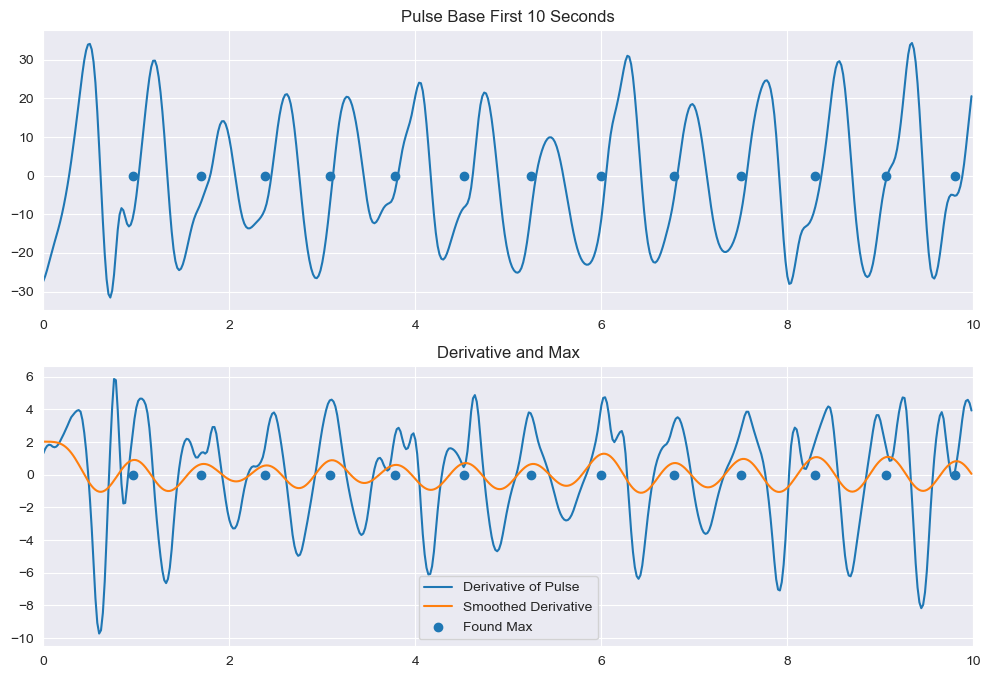

In [42]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base[:500], pulse_base[:500])
axis[0].set_title("Pulse Base First 10 Seconds")
axis[0].set_xlim([0, 10])

axis[1].plot(time_base[:500], dy[:500])
axis[1].plot(time_base[:500], gaussian_filter1d(dy, 10)[:500])
axis[1].scatter(time_base[zeros[:13]], np.zeros(len(zeros[:13])))
axis[0].scatter(time_base[zeros[:13]], np.zeros(len(zeros[:13])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Max"])
axis[1].set_title("Derivative and Max")
axis[1].set_xlim([0, 10])

plt.show()

In [43]:
dy = np.gradient(pulse_base)
ddy = np.gradient(gaussian_filter1d(dy, 10))
pairs = []
zeros = []
first = -1
second = -1
for i in range(len(ddy) - 1):
    if ddy[i] <= 0 and ddy[i + 1] >= 0:
        first = i
    elif ddy[i] >= 0 and ddy[i + 1] <= 0 and first != -1:
        pairs.append((first, i))
        zeros.append(i)
        first = -1

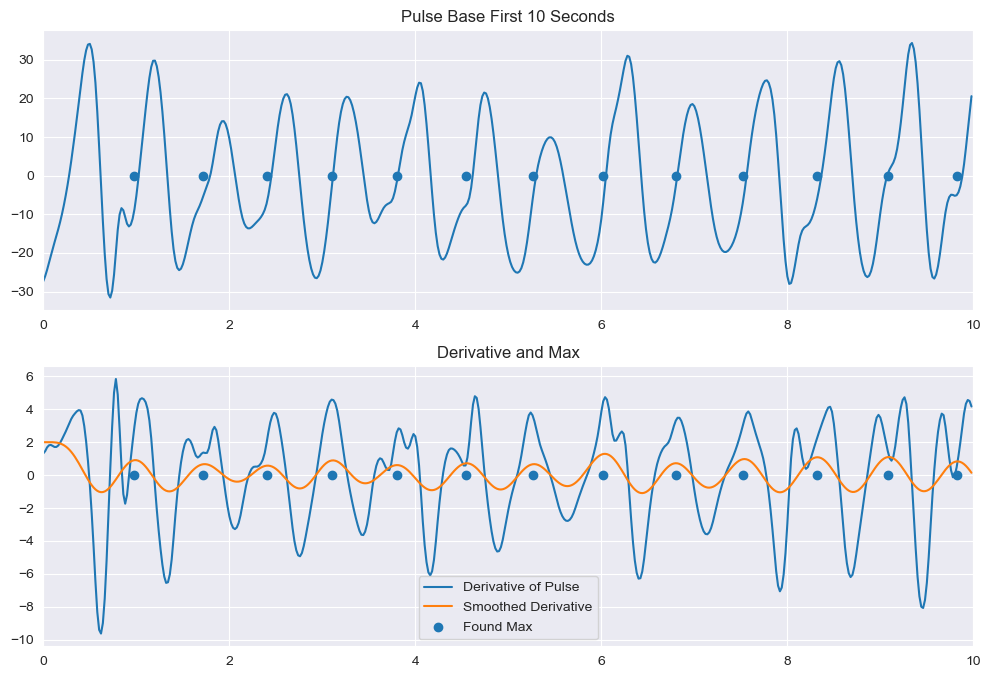

In [44]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base[:500], pulse_base[:500])
axis[0].set_title("Pulse Base First 10 Seconds")
axis[0].set_xlim([0, 10])

axis[1].plot(time_base[:500], dy[:500])
axis[1].plot(time_base[:500], gaussian_filter1d(dy, 10)[:500])
axis[1].scatter(time_base[zeros[:13]], np.zeros(len(zeros[:13])))
axis[0].scatter(time_base[zeros[:13]], np.zeros(len(zeros[:13])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Max"])
axis[1].set_title("Derivative and Max")
axis[1].set_xlim([0, 10])

plt.show()

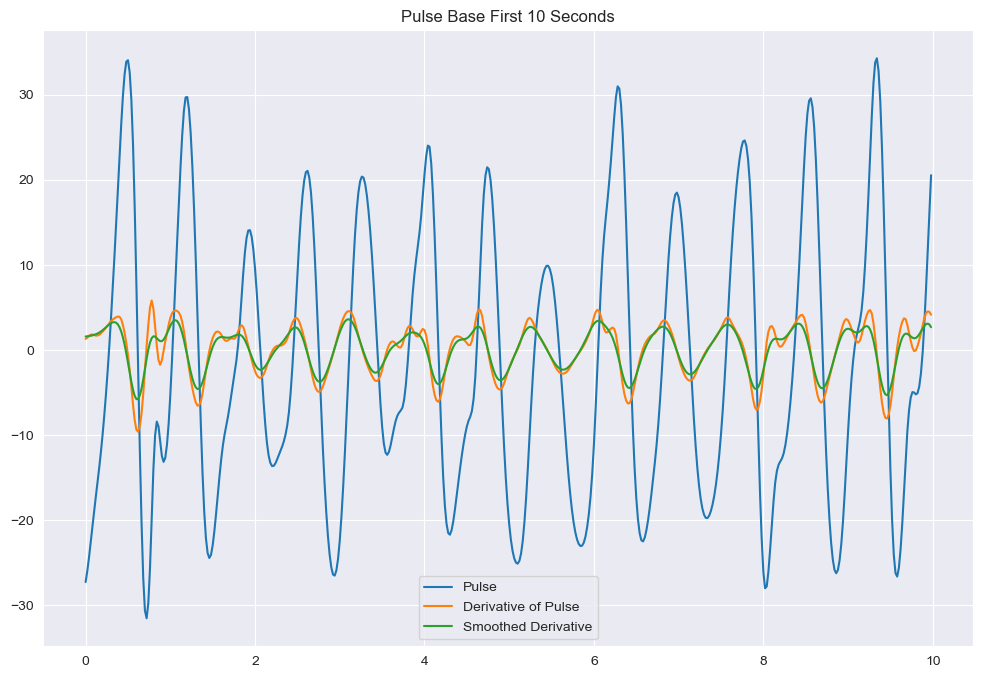

In [45]:
dy = np.gradient(pulse_base)
smoothed_dy = gaussian_filter1d(dy, 3.5)

figure, axis = plt.subplots(1, 1, figsize=(12, 8))

plt.plot(time_base[:500], pulse_base[:500])
plt.plot(time_base[:500], dy[:500])
plt.plot(time_base[:500], smoothed_dy[:500])
plt.legend(["Pulse", "Derivative of Pulse", "Smoothed Derivative"])
plt.title("Pulse Base First 10 Seconds")

plt.show()

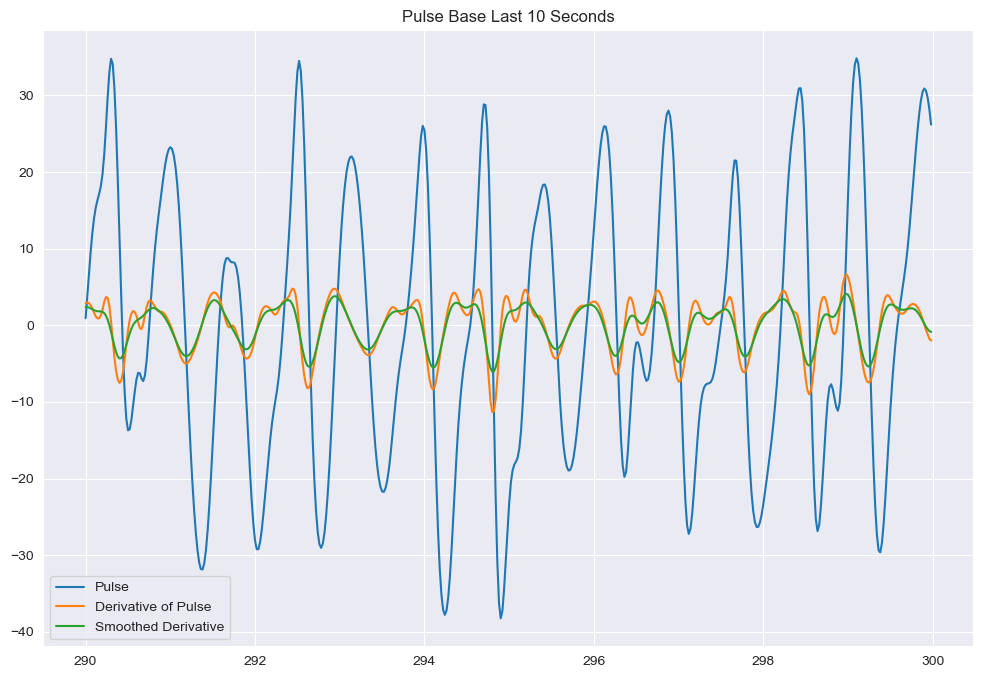

In [46]:
dy = np.gradient(pulse_base)
smoothed_dy = gaussian_filter1d(dy, 3.5)

figure, axis = plt.subplots(1, 1, figsize=(12, 8))

plt.plot(time_base[-500:], pulse_base[-500:])
plt.plot(time_base[-500:], dy[-500:])
plt.plot(time_base[-500:], smoothed_dy[-500:])
plt.legend(["Pulse", "Derivative of Pulse", "Smoothed Derivative"])
plt.title("Pulse Base Last 10 Seconds")

plt.show()

In [47]:
dy = np.gradient(pulse_base)
smoothed_dy = gaussian_filter1d(dy, 4)
minimums_base = []
for i in range(len(smoothed_dy) - 1):
    if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
        minimums_base.append(i)

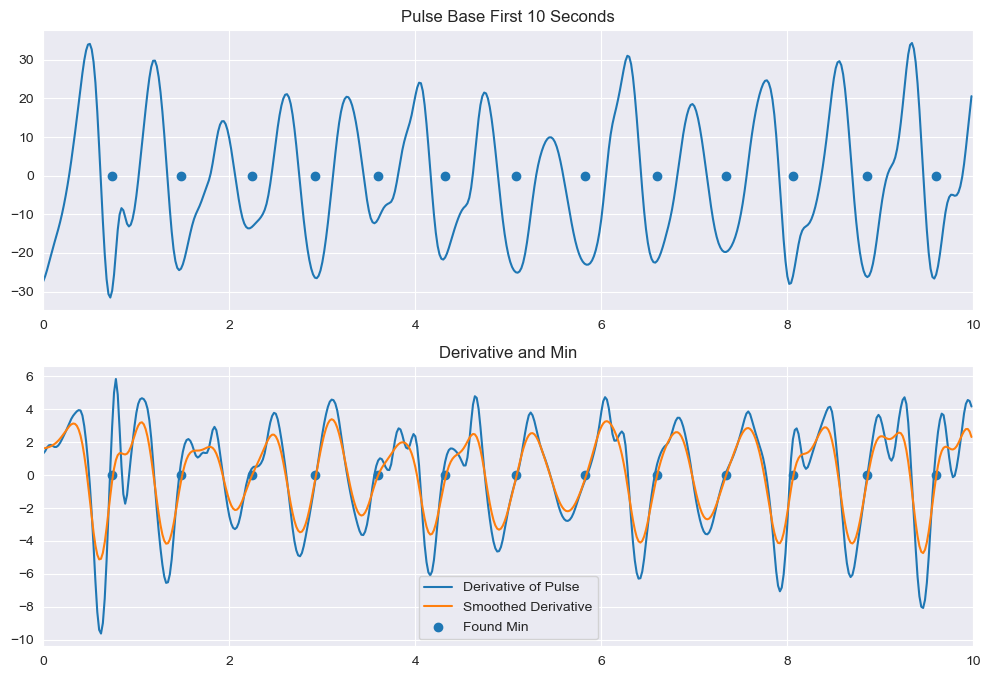

In [48]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base[:500], pulse_base[:500])
axis[0].set_title("Pulse Base First 10 Seconds")
axis[0].set_xlim([0, 10])

axis[1].plot(time_base[:500], dy[:500])
axis[1].plot(time_base[:500], smoothed_dy[:500])
axis[1].scatter(time_base[minimums_base[:13]], np.zeros(len(minimums_base[:13])))
axis[0].scatter(time_base[minimums_base[:13]], np.zeros(len(minimums_base[:13])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([0, 10])

plt.show()

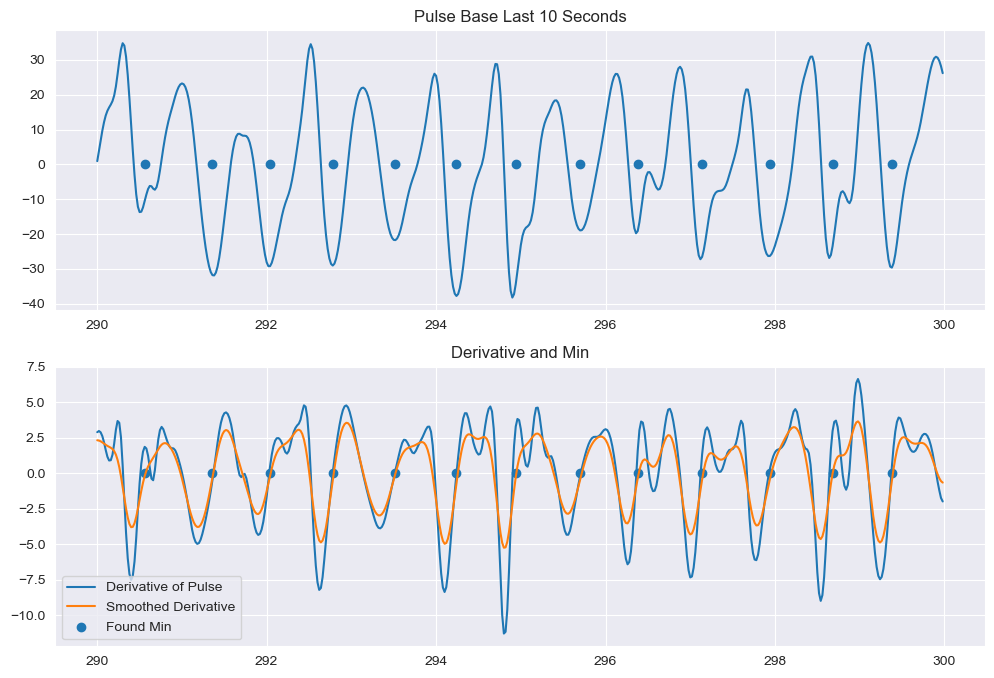

In [49]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base[-500:], pulse_base[-500:])
axis[0].set_title("Pulse Base Last 10 Seconds")

axis[1].plot(time_base[-500:], dy[-500:])
axis[1].plot(time_base[-500:], smoothed_dy[-500:])
axis[1].scatter(time_base[minimums_base[-13:]], np.zeros(len(minimums_base[-13:])))
axis[0].scatter(time_base[minimums_base[-13:]], np.zeros(len(minimums_base[-13:])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")

plt.show()

In [50]:
dy = np.gradient(pulse_rest)
smoothed_dy = gaussian_filter1d(dy, 4)
minimums_rest = []
for i in range(len(smoothed_dy) - 1):
    if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
        minimums_rest.append(i)

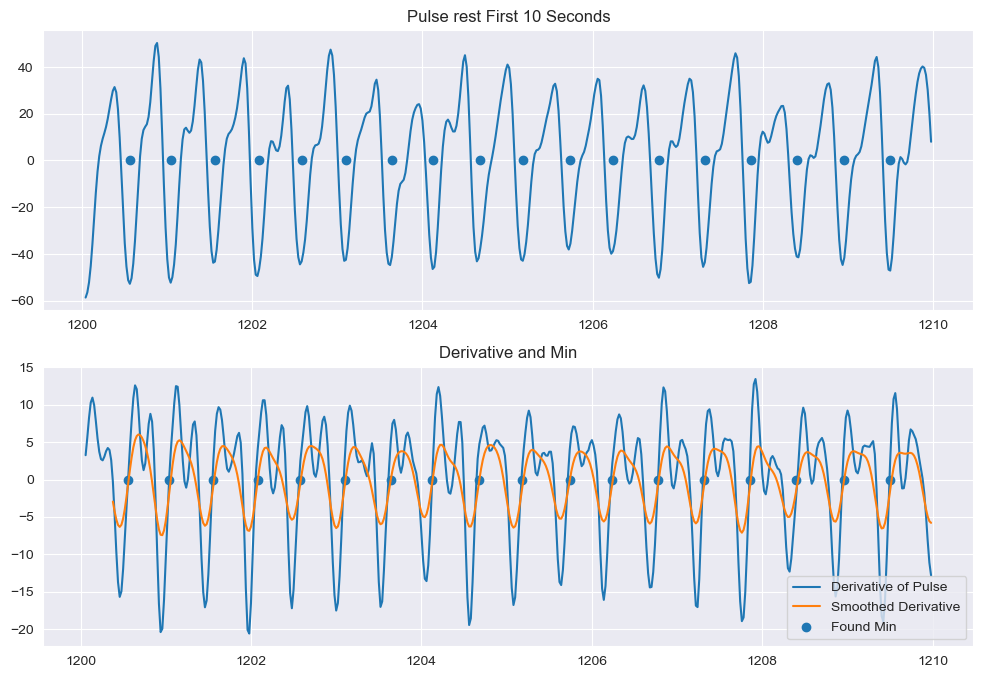

In [51]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_rest[:500], pulse_rest[:500])
axis[0].set_title("Pulse rest First 10 Seconds")

axis[1].plot(time_rest[:500], dy[:500])
axis[1].plot(time_rest[:500], smoothed_dy[:500])
axis[1].scatter(time_rest[minimums_rest[:18]], np.zeros(len(minimums_rest[:18])))
axis[0].scatter(time_rest[minimums_rest[:18]], np.zeros(len(minimums_rest[:18])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")

plt.show()

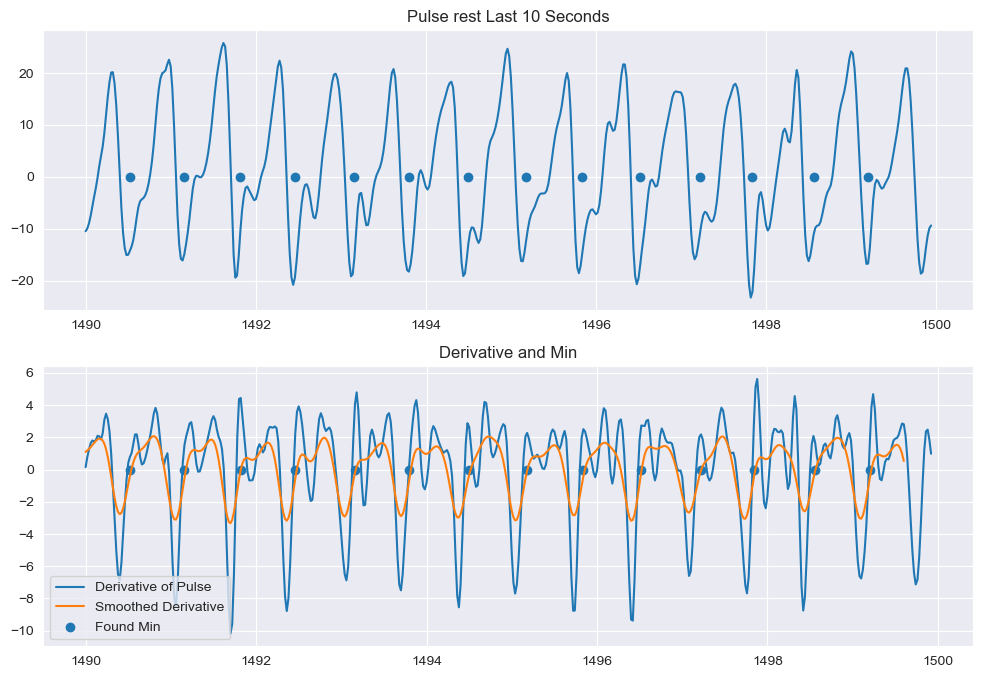

In [52]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_rest[-500:], pulse_rest[-500:])
axis[0].set_title("Pulse rest Last 10 Seconds")

axis[1].plot(time_rest[-500:], dy[-500:])
axis[1].plot(time_rest[-500:], smoothed_dy[-500:])
axis[1].scatter(time_rest[minimums_rest[-14:]], np.zeros(len(minimums_rest[-14:])))
axis[0].scatter(time_rest[minimums_rest[-14:]], np.zeros(len(minimums_rest[-14:])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")

plt.show()

### Вычисление последовательности RR-интервалов <a id="rr"></a>
[Вернуться к содержанию](#contents)

In [53]:
rr_base = []
rr_base_times = []
for i in range(1, len(minimums_base)):
    rr_base.append(time_base[minimums_base[i]] - time_base[minimums_base[i-1]])
    rr_base_times.append(time_base[minimums_base[i]])

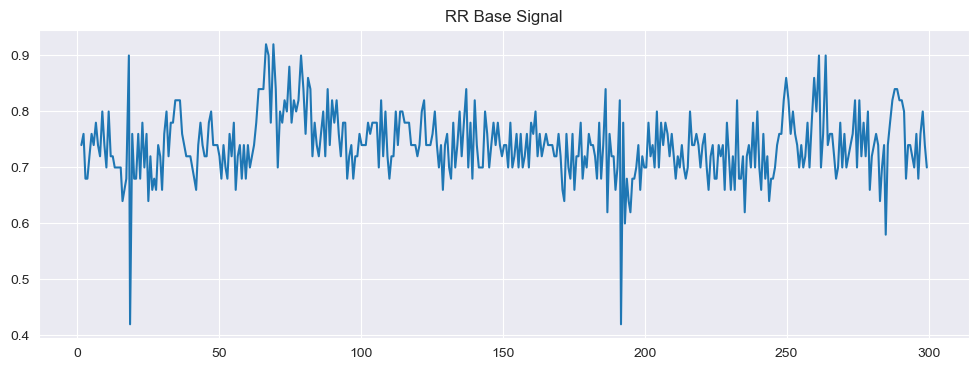

In [54]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(rr_base_times, rr_base)
plt.title("RR Base Signal")
plt.show()

In [55]:
rr_rest = []
rr_rest_times = []
for i in range(1, len(minimums_rest)):
    rr_rest.append(time_rest[minimums_rest[i]] - time_rest[minimums_rest[i-1]])
    rr_rest_times.append(time_rest[minimums_rest[i]])

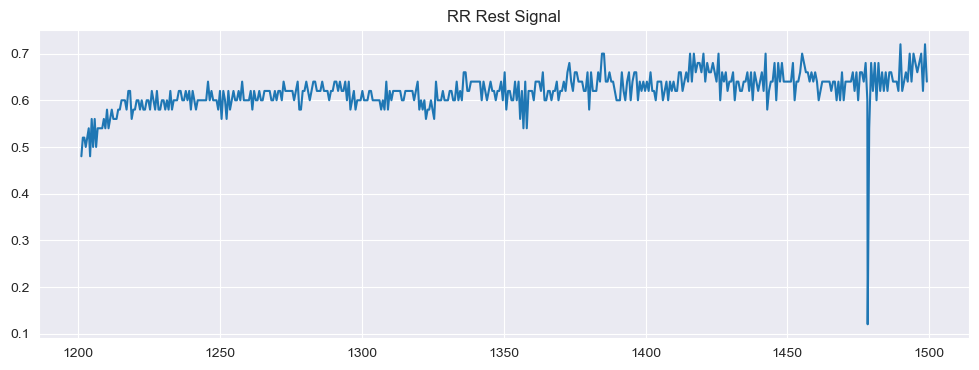

In [56]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(rr_rest_times, rr_rest)
plt.title("RR Rest Signal")
plt.show()

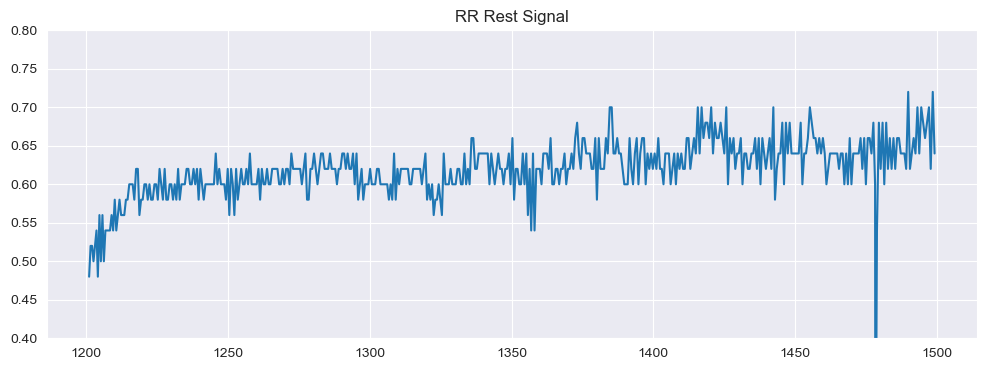

In [57]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(rr_rest_times, rr_rest)
plt.title("RR Rest Signal")
plt.ylim([0.4, 0.8])
plt.show()

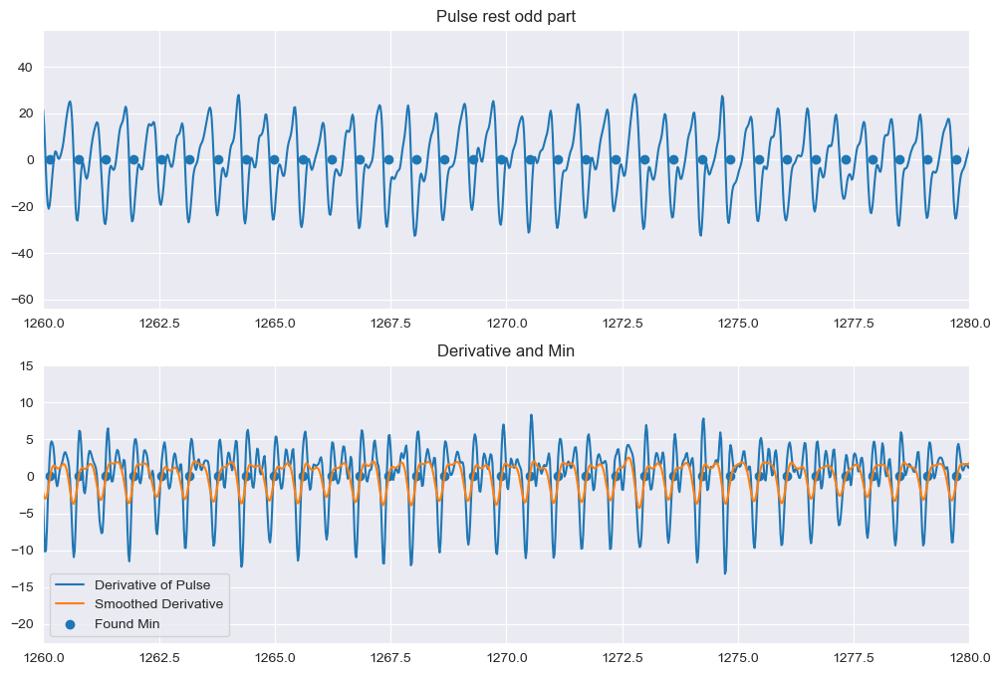

In [58]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_rest, pulse_rest)
axis[0].set_title("Pulse rest odd part")
axis[0].set_xlim([1260, 1280])

axis[1].plot(time_rest, dy)
axis[1].plot(time_rest, smoothed_dy)
axis[1].scatter(time_rest[minimums_rest], np.zeros(len(minimums_rest)))
axis[0].scatter(time_rest[minimums_rest], np.zeros(len(minimums_rest)))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([1260, 1280])

plt.show()

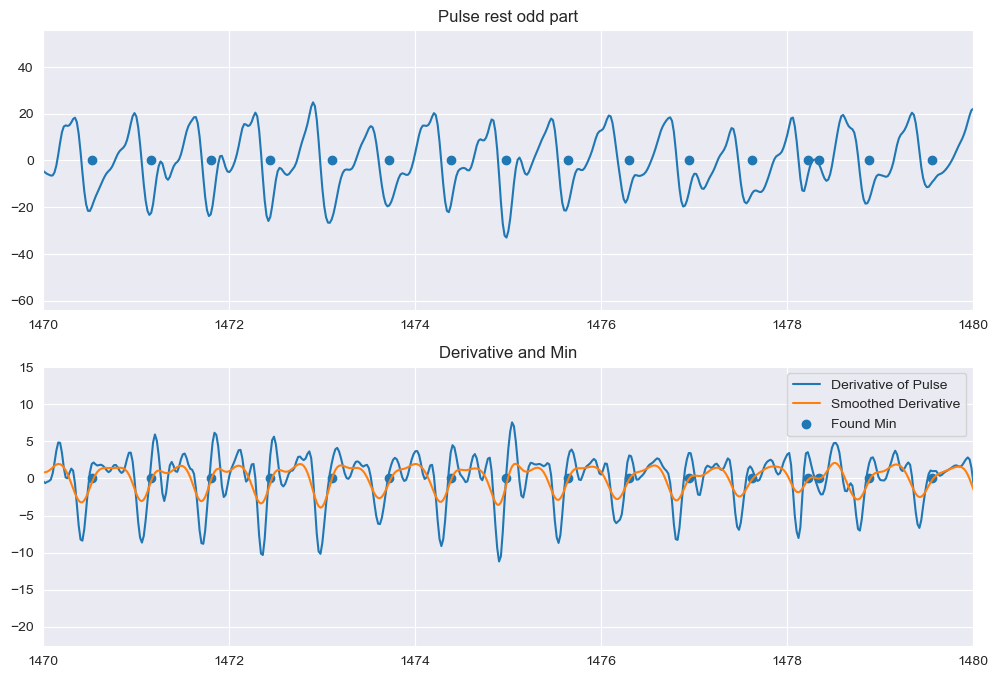

In [59]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_rest, pulse_rest)
axis[0].set_title("Pulse rest odd part")
axis[0].set_xlim([1470, 1480])

axis[1].plot(time_rest, dy)
axis[1].plot(time_rest, smoothed_dy)
axis[1].scatter(time_rest[minimums_rest], np.zeros(len(minimums_rest)))
axis[0].scatter(time_rest[minimums_rest], np.zeros(len(minimums_rest)))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([1470, 1480])

plt.show()

In [60]:
dy = np.gradient(pulse_rest)
smoothed_dy = gaussian_filter1d(dy, 4.1)
minimums_rest = []
for i in range(len(smoothed_dy) - 1):
    if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
        minimums_rest.append(i)

rr_rest = []
rr_rest_times = []
for i in range(1, len(minimums_rest)):
    rr_rest.append(time_rest[minimums_rest[i]] - time_rest[minimums_rest[i-1]])
    rr_rest_times.append(time_rest[minimums_rest[i]])

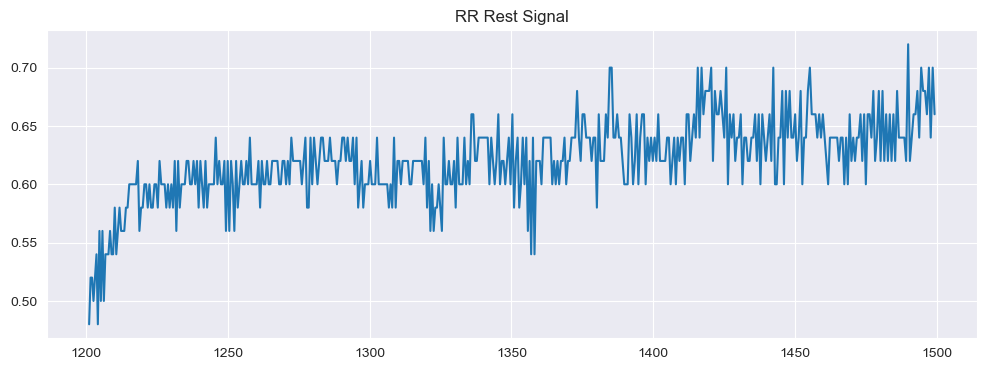

In [61]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(rr_rest_times, rr_rest)
plt.title("RR Rest Signal")
plt.show()

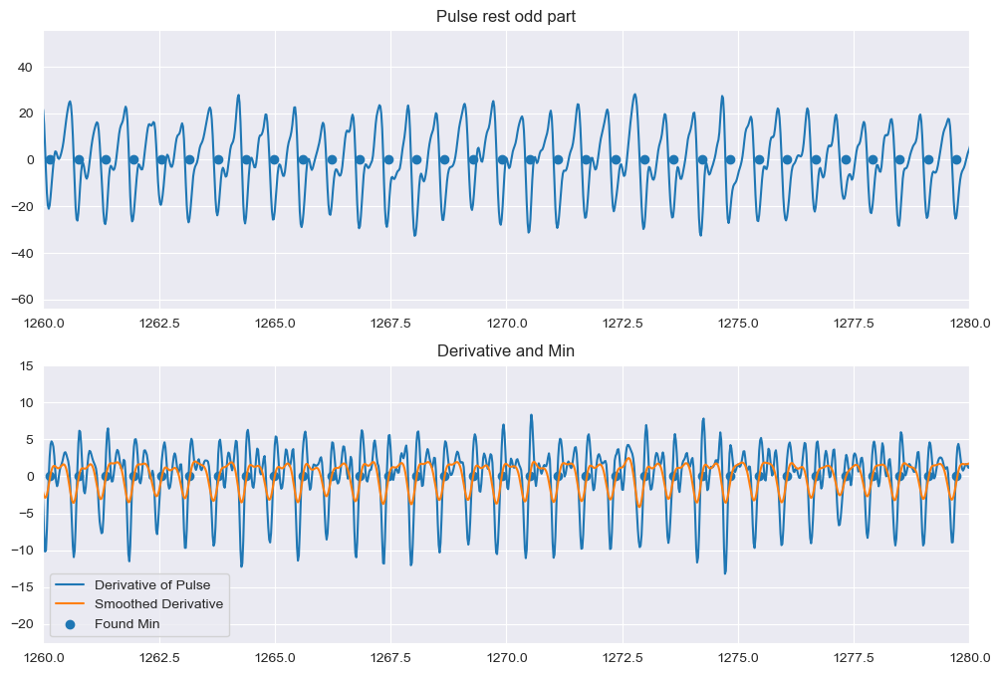

In [62]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_rest, pulse_rest)
axis[0].set_title("Pulse rest odd part")
axis[0].set_xlim([1260, 1280])

axis[1].plot(time_rest, dy)
axis[1].plot(time_rest, smoothed_dy)
axis[1].scatter(time_rest[minimums_rest], np.zeros(len(minimums_rest)))
axis[0].scatter(time_rest[minimums_rest], np.zeros(len(minimums_rest)))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([1260, 1280])

plt.show()

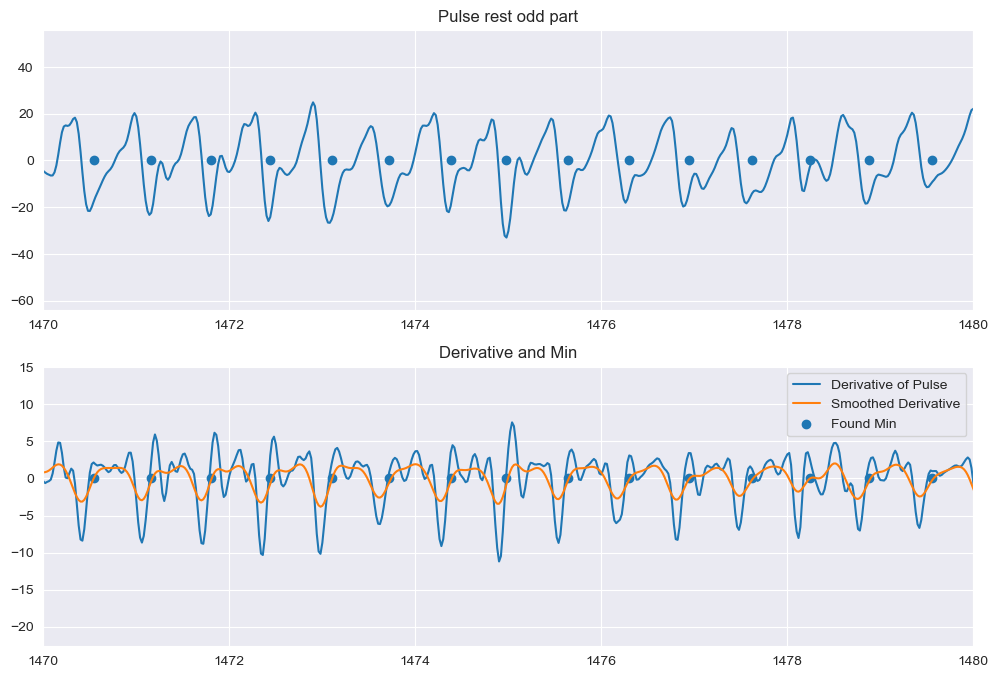

In [63]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_rest, pulse_rest)
axis[0].set_title("Pulse rest odd part")
axis[0].set_xlim([1470, 1480])

axis[1].plot(time_rest, dy)
axis[1].plot(time_rest, smoothed_dy)
axis[1].scatter(time_rest[minimums_rest], np.zeros(len(minimums_rest)))
axis[0].scatter(time_rest[minimums_rest], np.zeros(len(minimums_rest)))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([1470, 1480])

plt.show()

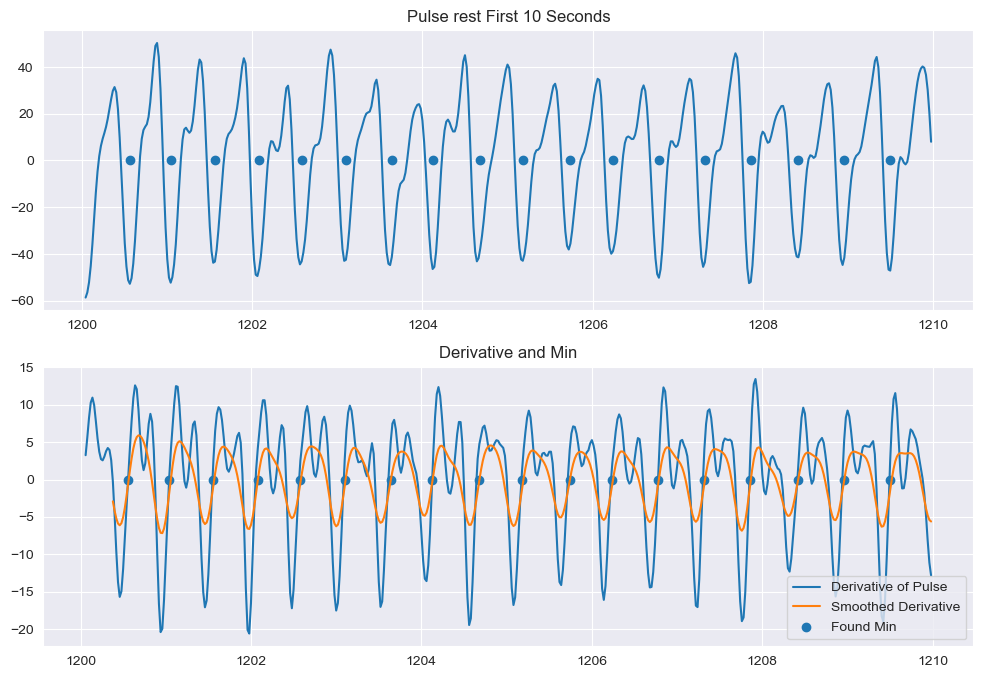

In [64]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_rest[:500], pulse_rest[:500])
axis[0].set_title("Pulse rest First 10 Seconds")

axis[1].plot(time_rest[:500], dy[:500])
axis[1].plot(time_rest[:500], smoothed_dy[:500])
axis[1].scatter(time_rest[minimums_rest[:18]], np.zeros(len(minimums_rest[:18])))
axis[0].scatter(time_rest[minimums_rest[:18]], np.zeros(len(minimums_rest[:18])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")

plt.show()

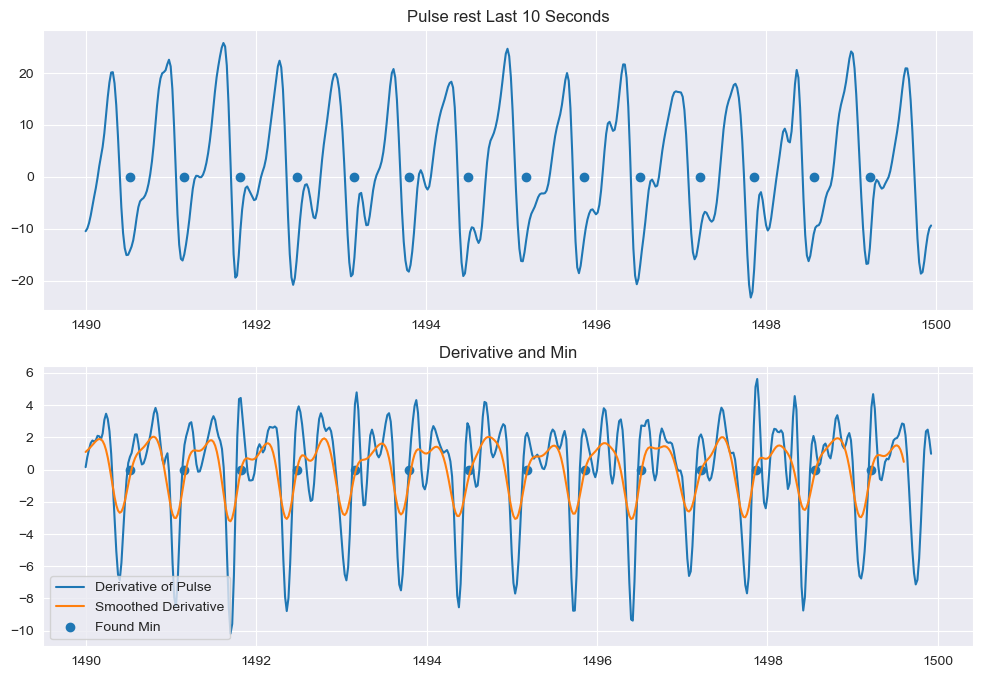

In [65]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_rest[-500:], pulse_rest[-500:])
axis[0].set_title("Pulse rest Last 10 Seconds")

axis[1].plot(time_rest[-500:], dy[-500:])
axis[1].plot(time_rest[-500:], smoothed_dy[-500:])
axis[1].scatter(time_rest[minimums_rest[-14:]], np.zeros(len(minimums_rest[-14:])))
axis[0].scatter(time_rest[minimums_rest[-14:]], np.zeros(len(minimums_rest[-14:])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")

plt.show()

In [66]:
dy = np.gradient(pulse_base)
smoothed_dy = gaussian_filter1d(dy, 4)
minimums_base = []
for i in range(len(smoothed_dy) - 1):
    if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
        minimums_base.append(i)

rr_base = []
rr_base_times = []
for i in range(1, len(minimums_base)):
    rr_base.append(time_base[minimums_base[i]] - time_base[minimums_base[i-1]])
    rr_base_times.append(time_base[minimums_base[i]])

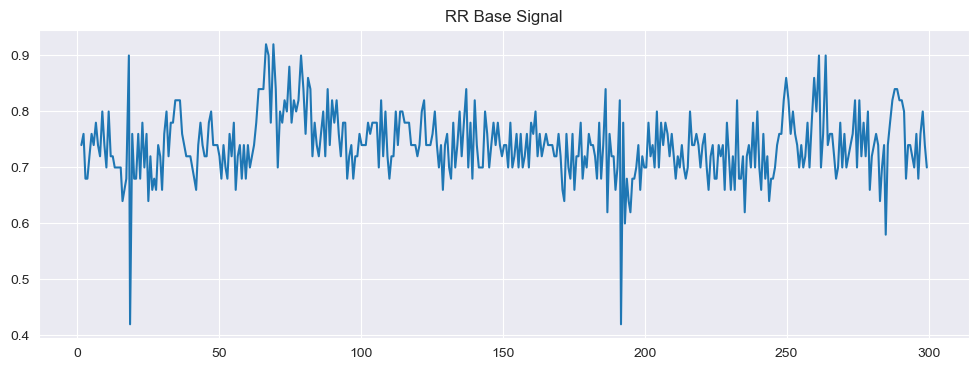

In [67]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(rr_base_times, rr_base)
plt.title("RR Base Signal")
plt.show()

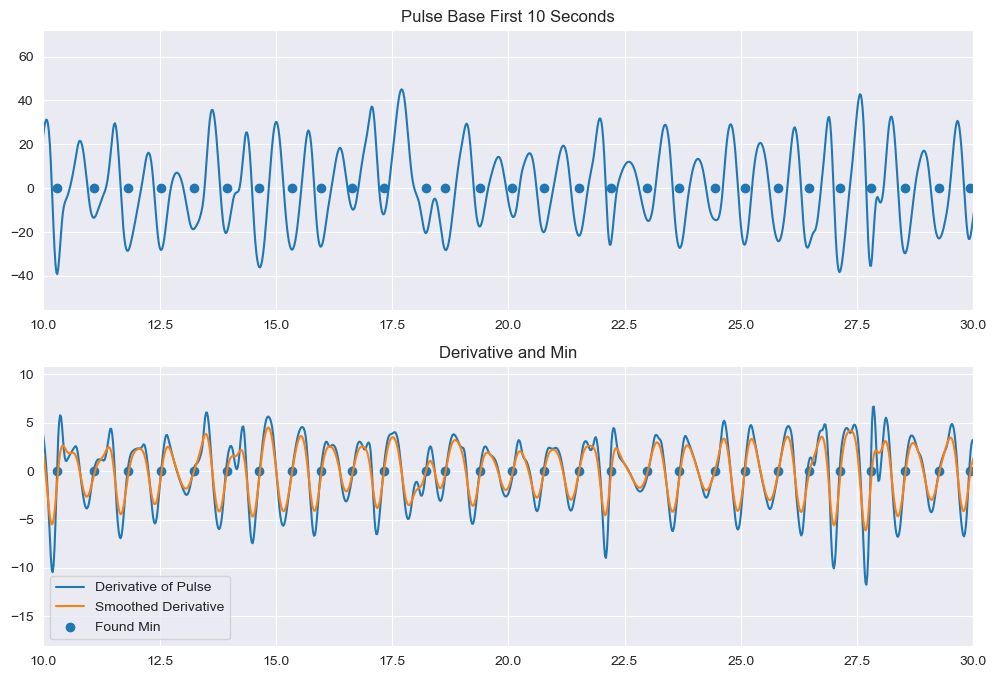

In [68]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base, pulse_base)
axis[0].set_title("Pulse Base First 10 Seconds")
axis[0].set_xlim([10, 30])

axis[1].plot(time_base, dy)
axis[1].plot(time_base, smoothed_dy)
axis[1].scatter(time_base[minimums_base], np.zeros(len(minimums_base)))
axis[0].scatter(time_base[minimums_base], np.zeros(len(minimums_base)))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([10, 30])

plt.show()

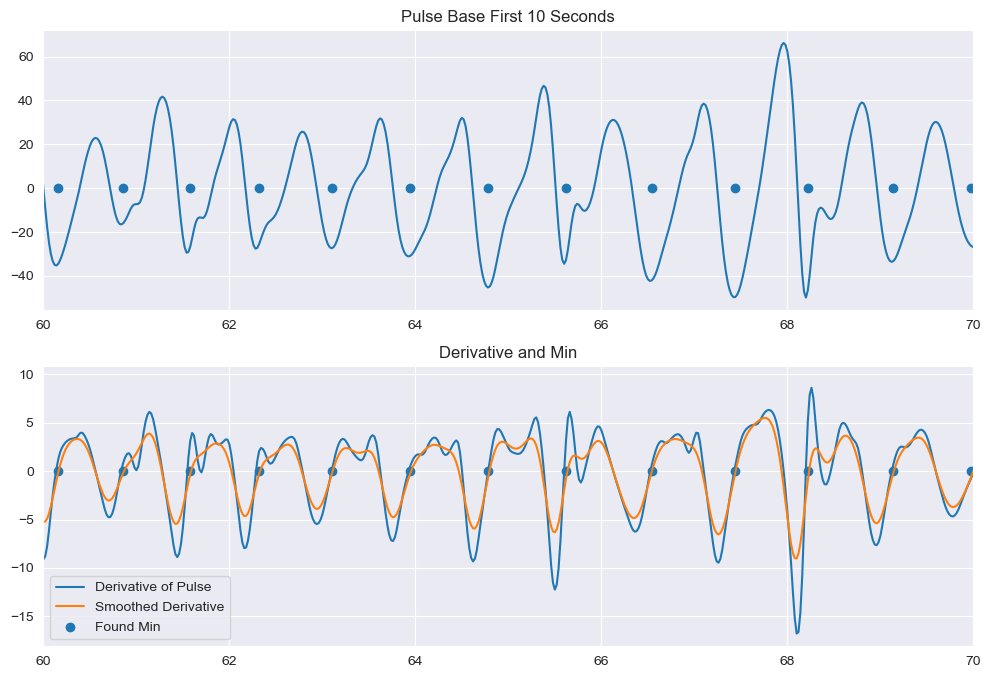

In [69]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base, pulse_base)
axis[0].set_title("Pulse Base First 10 Seconds")
axis[0].set_xlim([60, 70])

axis[1].plot(time_base, dy)
axis[1].plot(time_base, smoothed_dy)
axis[1].scatter(time_base[minimums_base], np.zeros(len(minimums_base)))
axis[0].scatter(time_base[minimums_base], np.zeros(len(minimums_base)))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([60, 70])

plt.show()

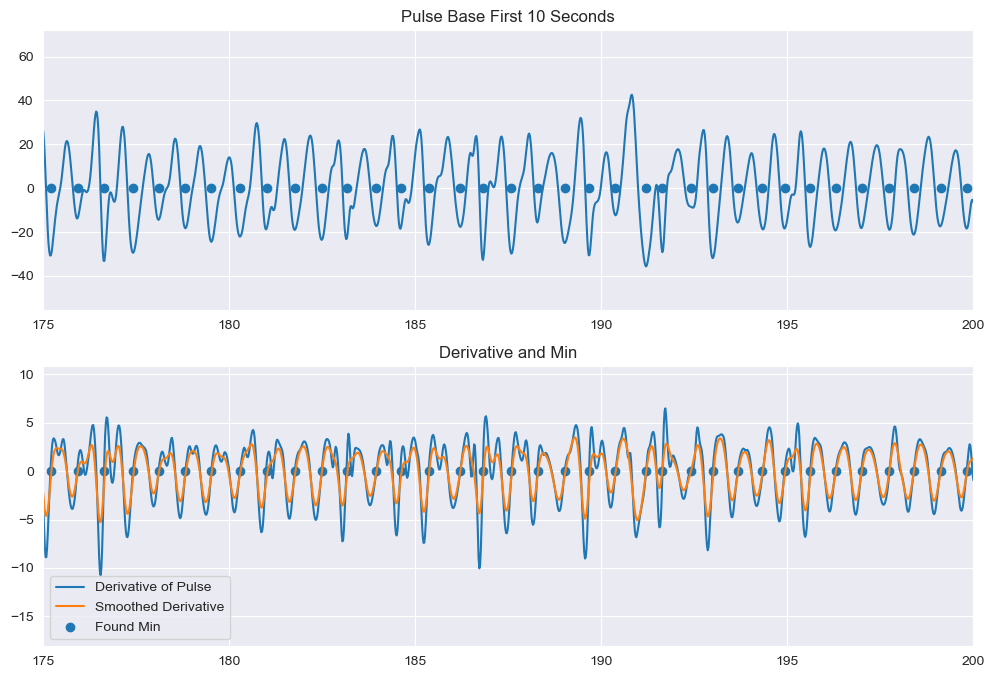

In [70]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base, pulse_base)
axis[0].set_title("Pulse Base First 10 Seconds")
axis[0].set_xlim([175, 200])

axis[1].plot(time_base, dy)
axis[1].plot(time_base, smoothed_dy)
axis[1].scatter(time_base[minimums_base], np.zeros(len(minimums_base)))
axis[0].scatter(time_base[minimums_base], np.zeros(len(minimums_base)))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([175, 200])

plt.show()

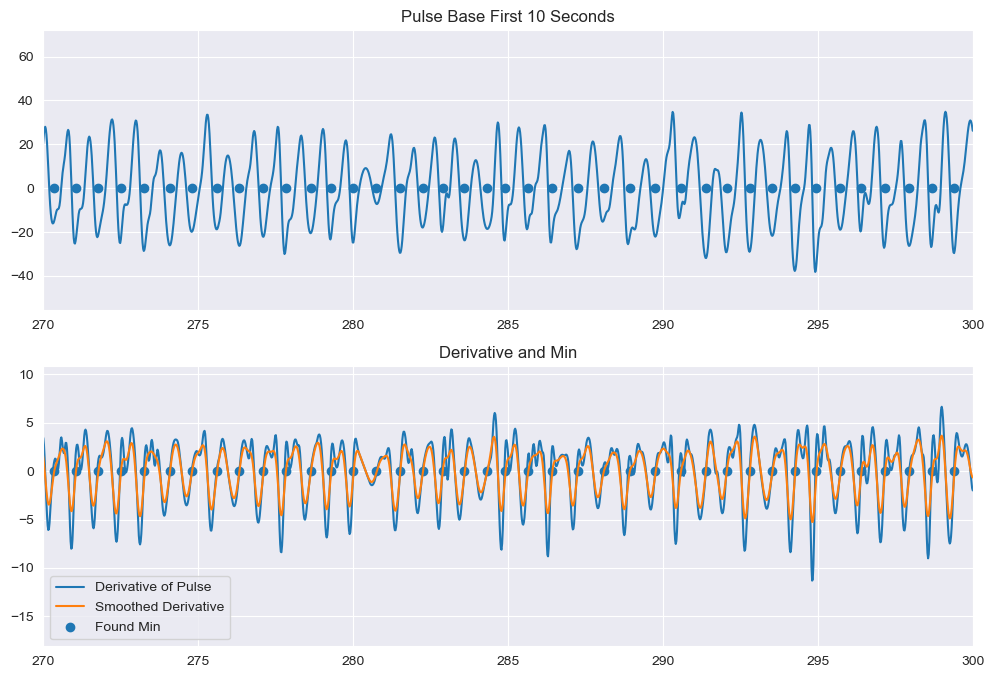

In [71]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base, pulse_base)
axis[0].set_title("Pulse Base First 10 Seconds")
axis[0].set_xlim([270, 300])

axis[1].plot(time_base, dy)
axis[1].plot(time_base, smoothed_dy)
axis[1].scatter(time_base[minimums_base], np.zeros(len(minimums_base)))
axis[0].scatter(time_base[minimums_base], np.zeros(len(minimums_base)))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([270, 300])

plt.show()

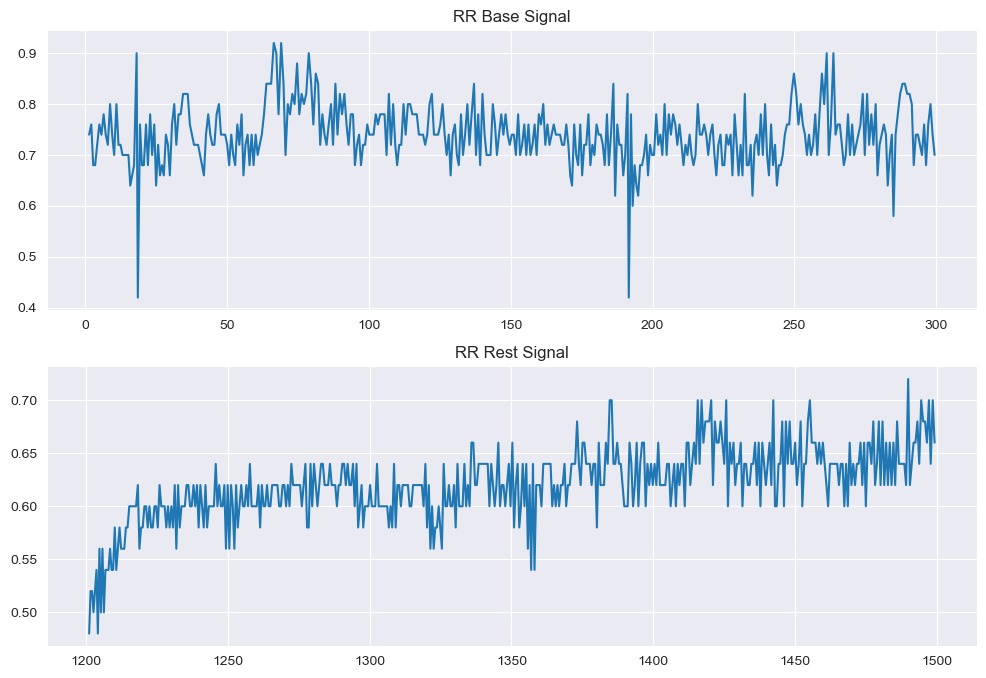

In [72]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(rr_base_times, rr_base)
axis[0].set_title("RR Base Signal")
axis[1].plot(rr_rest_times, rr_rest)
axis[1].set_title("RR Rest Signal")
plt.show()

### (Бонус) Выделение дыхательной компоненты и вычисление частоты дыхания <a id="breath"></a>
[Вернуться к содержанию](#contents)

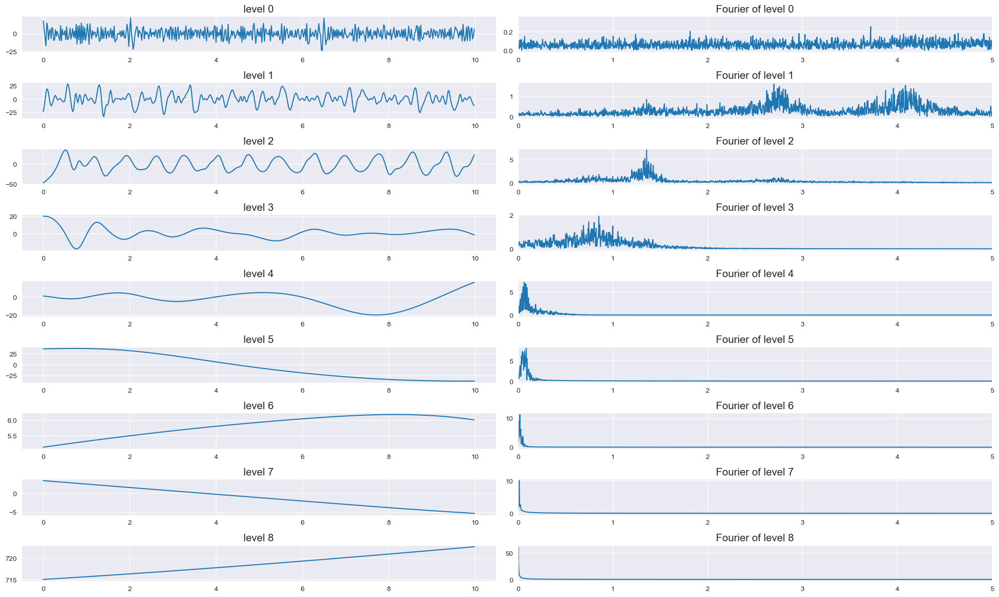

In [73]:
figure, axis = plt.subplots(levels, 2, figsize=(20, 12))
#plt.subplots_adjust(hspace=1.0)
for i in range(levels):
    axis[i][0].set_title('level '+str(i), fontsize=15)
    axis[i][0].plot(time_real[:500], imf_base[:, i][:500])

for i in range(levels):
    N = len(imf_base[:, i])
    spacing = 1 / 50
    fourierTransform = fft(imf_base[:, i] - np.average(imf_base[:, i]))
    frequencies = fftfreq(N, spacing)[: N // 2]
    axis[i][1].set_title('Fourier of level '+str(i), fontsize=15)
    axis[i][1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))
    axis[i][1].set_xlim([0, 5])

plt.tight_layout()
plt.show()

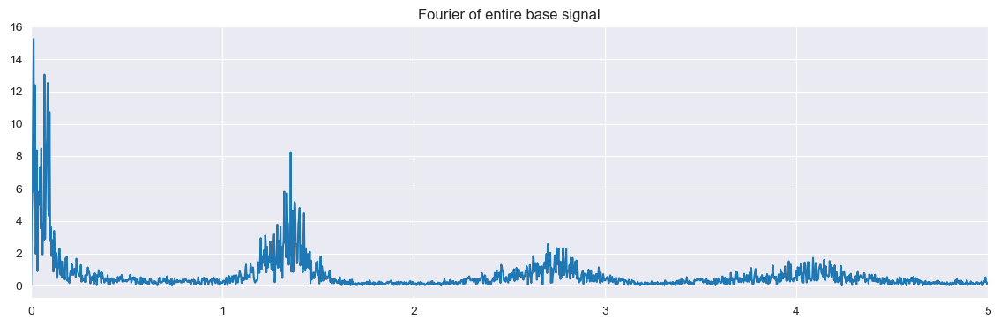

In [74]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
signal = dc_base - imf_base[:, 8] - imf_base[:, 0]
N = len(signal)
spacing = 1 / 50
fourierTransform = fft(signal - np.average(signal))
frequencies = fftfreq(N, spacing)[: N // 2]
plt.plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))
plt.xlim([0, 5])

plt.title("Fourier of entire base signal")
plt.show()

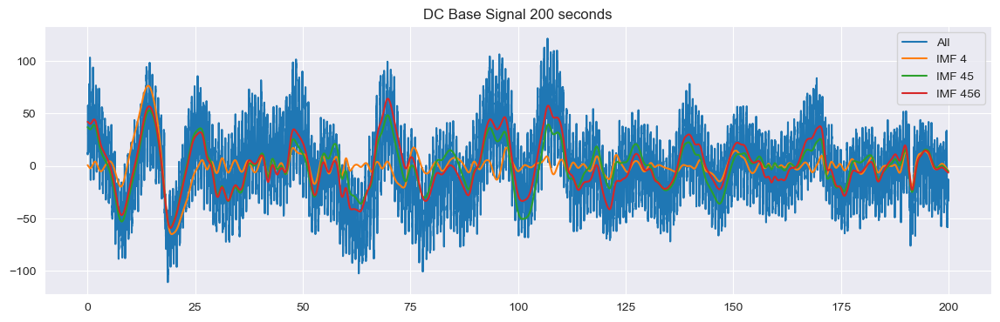

In [75]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_base[:10000], dc_base[:10000] - imf_base[:, 8][:10000])
plt.plot(time_base[:10000], imf_base[:, 4][:10000])
plt.plot(time_base[:10000], imf_base[:, 4][:10000] + imf_base[:, 5][:10000])
plt.plot(time_base[:10000], imf_base[:, 4][:10000] + imf_base[:, 5][:10000] + imf_base[:, 6][:10000])
plt.legend(["All", "IMF 4", "IMF 45", "IMF 456"])
plt.title("DC Base Signal 200 seconds")
plt.show()

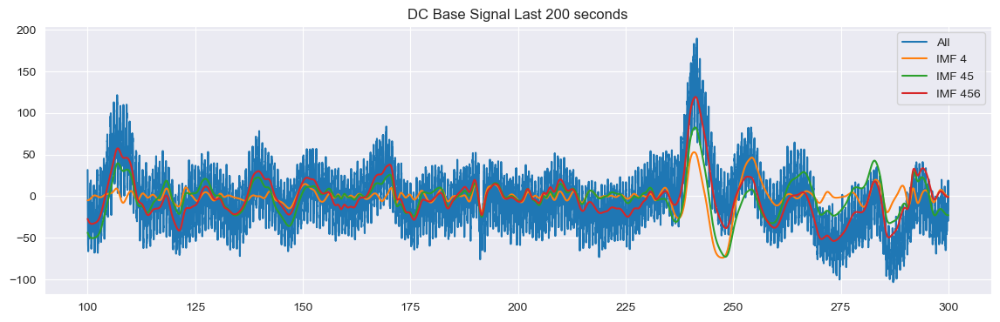

In [76]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_base[-10000:], dc_base[-10000:] - imf_base[:, 8][-10000:])
plt.plot(time_base[-10000:], imf_base[:, 4][-10000:])
plt.plot(time_base[-10000:], imf_base[:, 4][-10000:] + imf_base[:, 5][-10000:])
plt.plot(time_base[-10000:], imf_base[:, 4][-10000:] + imf_base[:, 5][-10000:] + imf_base[:, 6][-10000:])
plt.legend(["All", "IMF 4", "IMF 45", "IMF 456"])
plt.title("DC Base Signal Last 200 seconds")
plt.show()

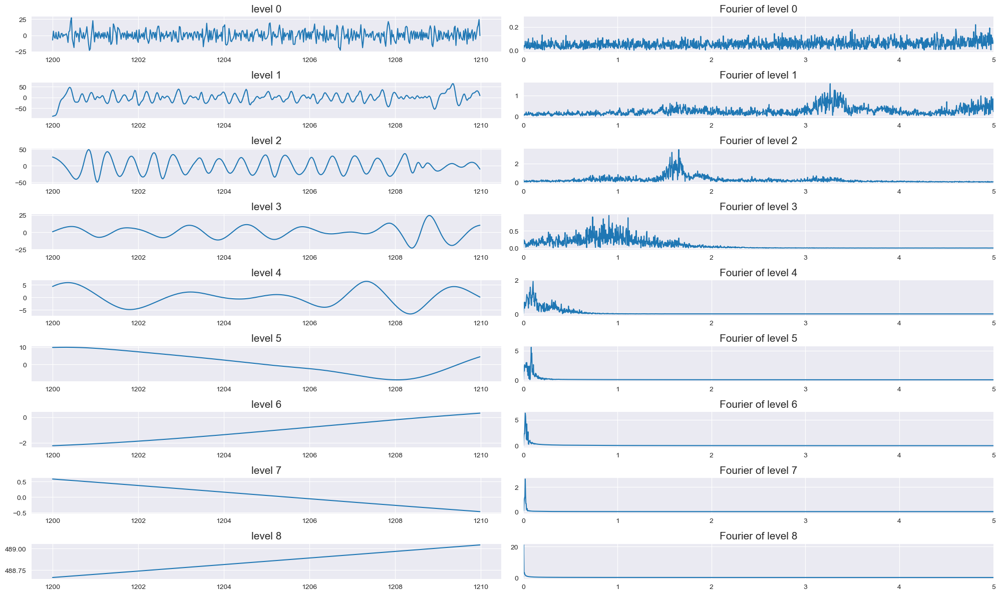

In [77]:
figure, axis = plt.subplots(levels, 2, figsize=(20, 12))
#plt.subplots_adjust(hspace=1.0)
for i in range(levels):
    axis[i][0].set_title('level '+str(i), fontsize=15)
    axis[i][0].plot(time_rest[:500], imf_rest[:, i][:500])

for i in range(levels):
    N = len(imf_rest[:, i])
    spacing = 1 / 50
    fourierTransform = fft(imf_rest[:, i] - np.average(imf_rest[:, i]))
    frequencies = fftfreq(N, spacing)[: N // 2]
    axis[i][1].set_title('Fourier of level '+str(i), fontsize=15)
    axis[i][1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))
    axis[i][1].set_xlim([0, 5])

plt.tight_layout()
plt.show()

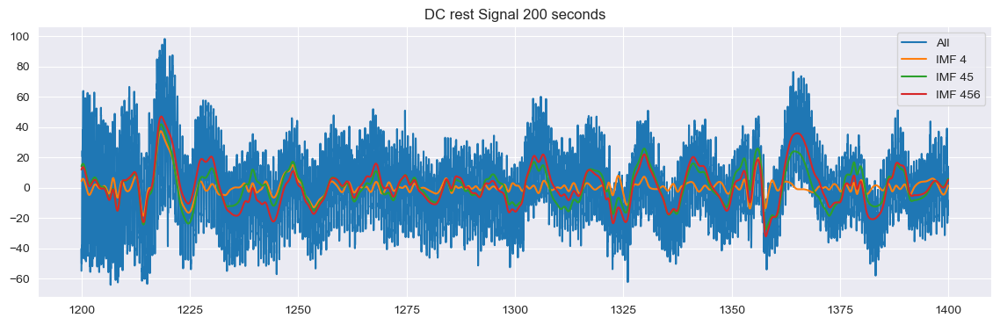

In [78]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_rest[:10000], dc_rest[:10000] - imf_rest[:, 8][:10000])
plt.plot(time_rest[:10000], imf_rest[:, 4][:10000])
plt.plot(time_rest[:10000], imf_rest[:, 4][:10000] + imf_rest[:, 5][:10000])
plt.plot(time_rest[:10000], imf_rest[:, 4][:10000] + imf_rest[:, 5][:10000] + imf_rest[:, 6][:10000])
plt.legend(["All", "IMF 4", "IMF 45", "IMF 456"])
plt.title("DC rest Signal 200 seconds")
plt.show()

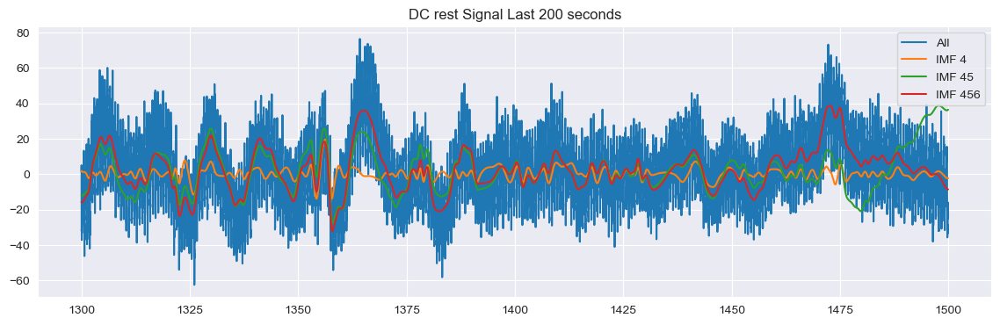

In [79]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_rest[-10000:], dc_rest[-10000:] - imf_rest[:, 8][-10000:])
plt.plot(time_rest[-10000:], imf_rest[:, 4][-10000:])
plt.plot(time_rest[-10000:], imf_rest[:, 4][-10000:] + imf_rest[:, 5][-10000:])
plt.plot(time_rest[-10000:], imf_rest[:, 4][-10000:] + imf_rest[:, 5][-10000:] + imf_rest[:, 6][-10000:])
plt.legend(["All", "IMF 4", "IMF 45", "IMF 456"])
plt.title("DC rest Signal Last 200 seconds")
plt.show()

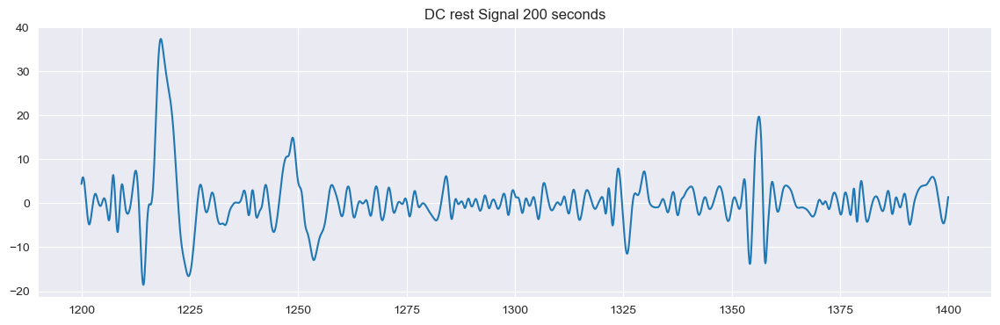

In [80]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_rest[:10000], imf_rest[:, 4][:10000])
plt.title("DC rest Signal 200 seconds")
plt.show()

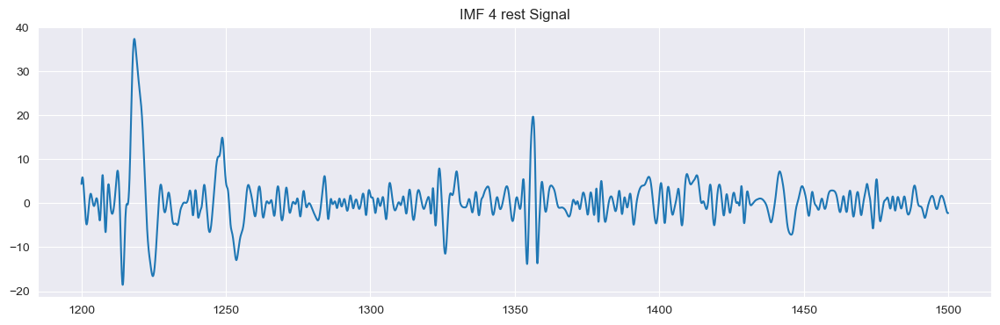

In [81]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_rest, imf_rest[:, 4])
plt.title("IMF 4 rest Signal")
plt.show()

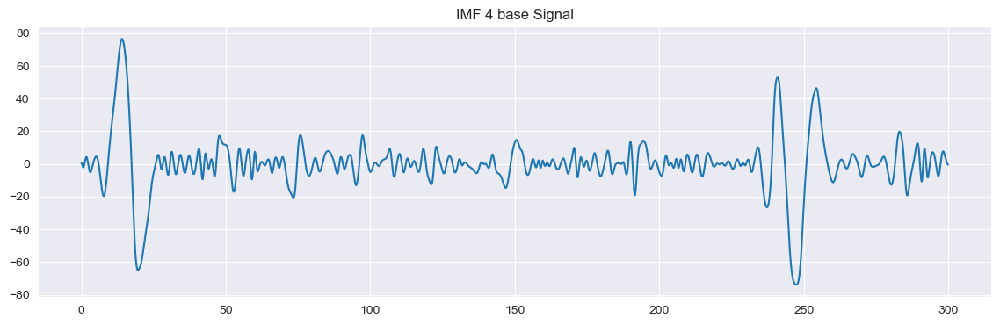

In [82]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_base, imf_base[:, 4])
plt.title("IMF 4 base Signal")
plt.show()

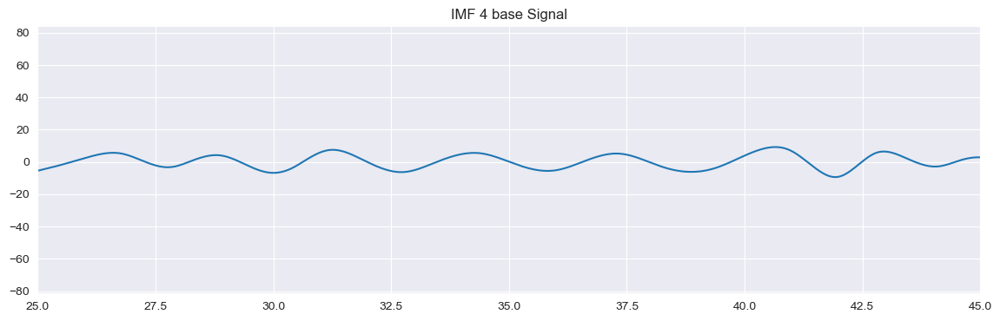

In [83]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_base, imf_base[:, 4])
plt.xlim([25, 45])
plt.title("IMF 4 base Signal")
plt.show()

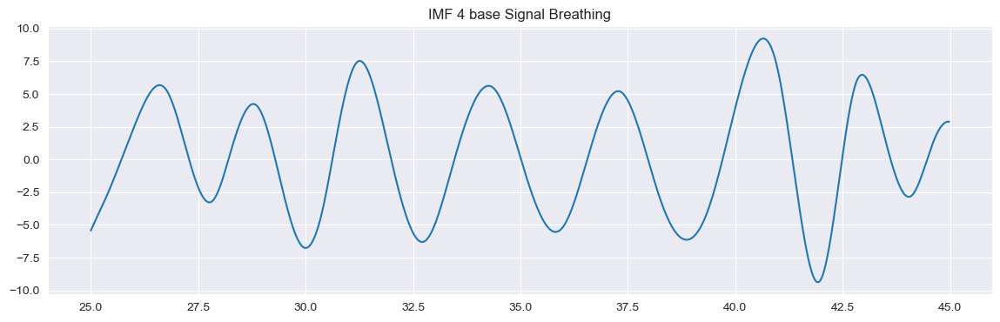

In [84]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(time_base[1250:2250], imf_base[:, 4][1250:2250])
plt.title("IMF 4 base Signal Breathing")
plt.show()

In [85]:
breathing_base = imf_base[:, 4][1250:2250]
breathing_time_base = time_base[1250:2250]

In [86]:
dy = np.gradient(breathing_base)
smoothed_dy = gaussian_filter1d(dy, 4)
minimums_breath = []
for i in range(len(smoothed_dy) - 1):
    if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
        minimums_breath.append(i)

breathing_lengths = []
breathing_times = []
for i in range(1, len(minimums_breath)):
    breathing_lengths.append(time_base[minimums_breath[i]] - time_base[minimums_breath[i-1]])
    breathing_times.append(time_base[minimums_breath[i]])

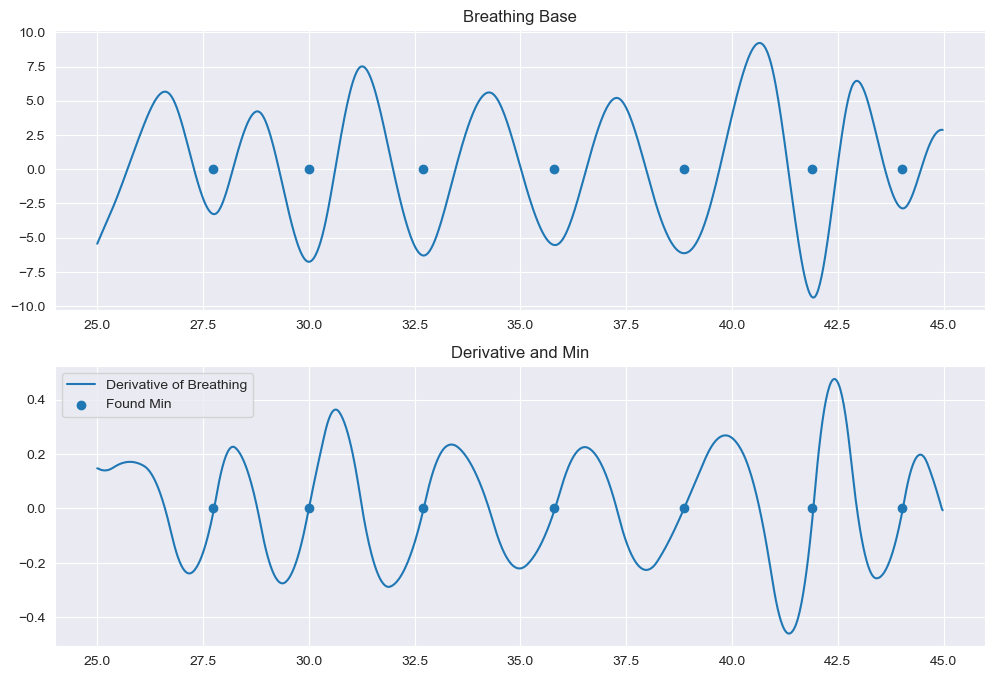

In [87]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(breathing_time_base, breathing_base)
axis[0].set_title("Breathing Base")

axis[1].plot(breathing_time_base, dy)
axis[1].scatter(breathing_time_base[minimums_breath], np.zeros(len(minimums_breath)))
axis[0].scatter(breathing_time_base[minimums_breath], np.zeros(len(minimums_breath)))
axis[1].legend(["Derivative of Breathing", "Found Min"])
axis[1].set_title("Derivative and Min")

plt.show()

In [88]:
print("Average breath length:", np.mean(breathing_lengths), "seconds")
print("Breaths per minute:", 60 / np.mean(breathing_lengths))

Average breath length: 2.7133333333333334 seconds
Breaths per minute: 22.11302211302211


### Удаление выбросов из последовательности RR-интервалов <a id="nn"></a>
[Вернуться к содержанию](#contents)

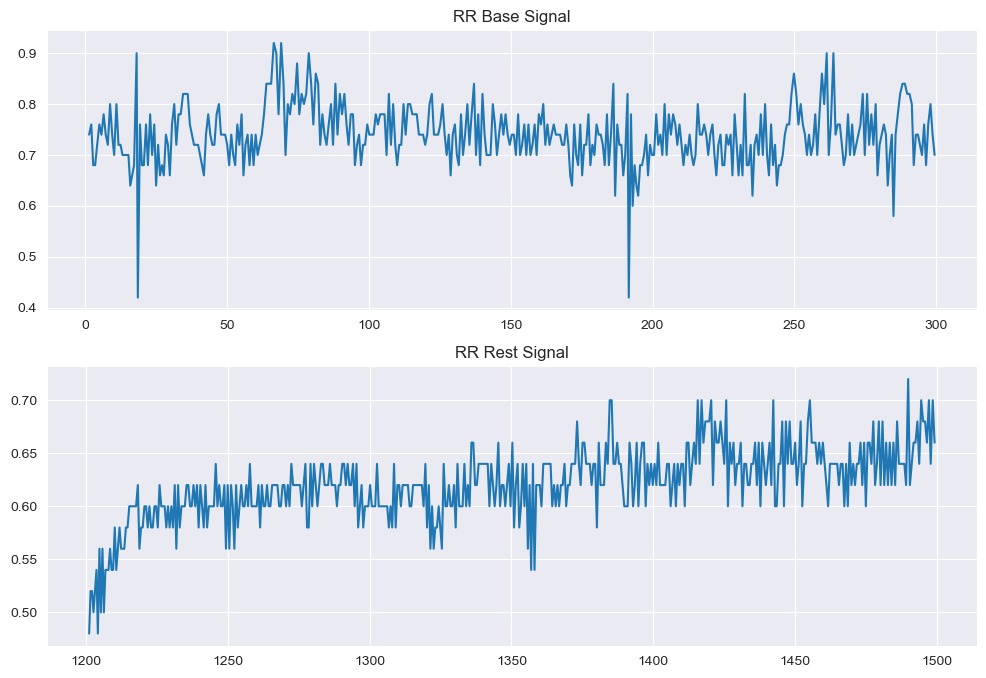

In [89]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(rr_base_times, rr_base)
axis[0].set_title("RR Base Signal")
axis[1].plot(rr_rest_times, rr_rest)
axis[1].set_title("RR Rest Signal")
plt.show()

In [90]:
start_ind, end_ind = 0, 0
for i in range(1, len(rr_rest_times)):
    if rr_rest_times[i - 1] < 1220 and rr_rest_times[i] >= 1220:
        start_ind = i
    elif rr_rest_times[i - 1] <= 1340 and rr_rest_times[i] > 1340:
        end_ind = i
rr_rest_times_chosen = rr_rest_times[start_ind:end_ind]
rr_rest_chosen = rr_rest[start_ind:end_ind]

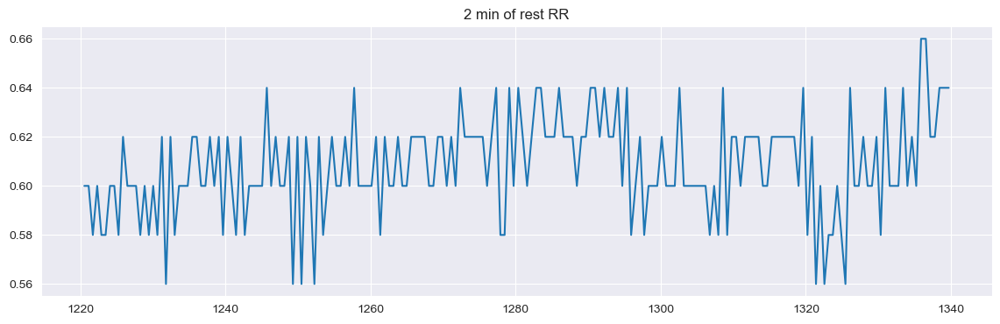

In [91]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(rr_rest_times_chosen, rr_rest_chosen)
plt.title("2 min of rest RR")
plt.show()

In [92]:
outliers = []
for i in range(len(rr_base)):
    if rr_base[i] < 0.5:
        outliers.append(i)

In [93]:
outliers

[24, 256]

In [94]:
rr_base_times_chosen = rr_base_times.copy()
rr_base_chosen = rr_base.copy()
for i in sorted(outliers, reverse=True):
    del rr_base_times_chosen[i]
    del rr_base_chosen[i]

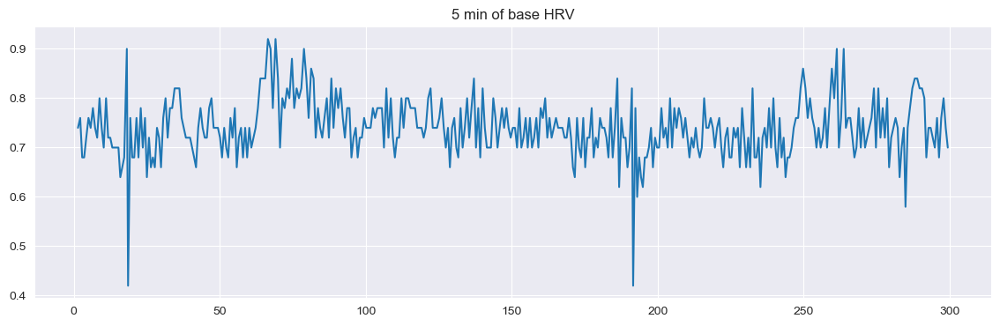

In [95]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(rr_base_times, rr_base)
plt.title("5 min of base HRV")
plt.show()

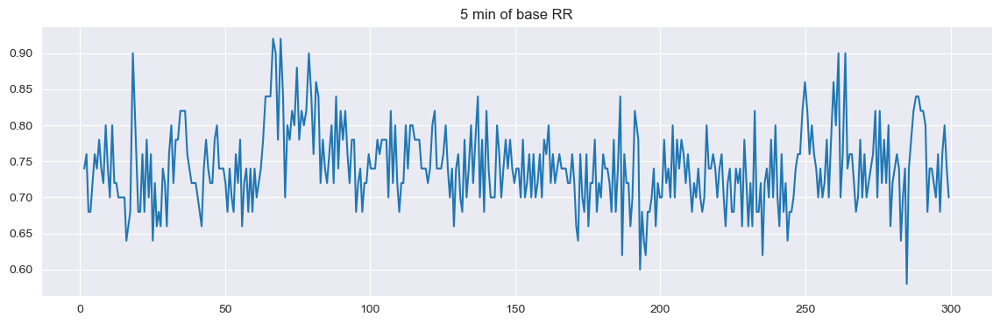

In [96]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(rr_base_times_chosen, rr_base_chosen)
plt.title("5 min of base RR")
plt.show()

In [97]:
start_ind = 0
for i in range(1, len(rr_base_times_chosen)):
    if rr_base_times_chosen[i - 1] < 180.0 and rr_base_times_chosen[i] >= 180.0:
        start_ind = i - 1
rr_base_times_chosen = rr_base_times_chosen[start_ind:]
rr_base_chosen = rr_base_chosen[start_ind:]

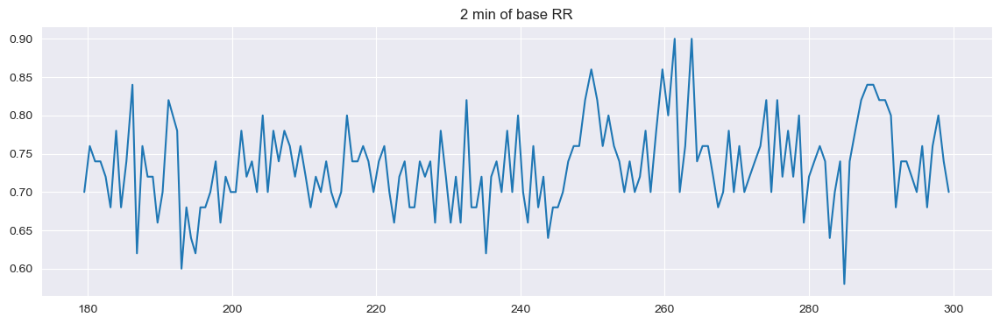

In [98]:
figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(rr_base_times_chosen, rr_base_chosen)
plt.title("2 min of base RR")
plt.show()

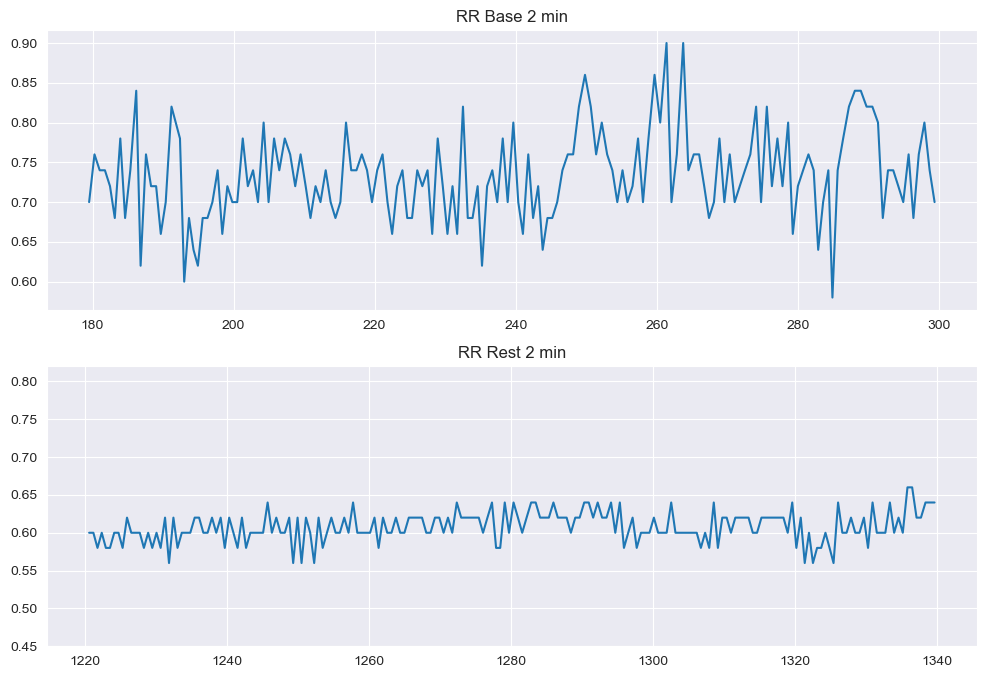

In [101]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(rr_base_times_chosen, rr_base_chosen)
axis[0].set_title("RR Base 2 min")
axis[1].plot(rr_rest_times_chosen, rr_rest_chosen)
axis[1].set_title("RR Rest 2 min")
axis[1].set_ylim([0.45, 0.82])
plt.show()

### Вычисление параметров вариабельности сердечного ритма <a id="param"></a>
[Вернуться к содержанию](#contents)

In [256]:
print("SDNN during base:", np.std(rr_base_chosen))
print("SDNN during rest:", np.std(rr_rest_chosen))

SDNN during base: 0.05504567893831432
SDNN during rest: 0.020005925582541124


In [249]:
np.abs(2 - 3)

1

In [257]:
def pNN50(rr):
    greater_nns = 0
    for i in range(1, len(rr)):
        if np.abs(rr[i] - rr[i - 1]) > 0.05:
            greater_nns += 1
    return greater_nns / (len(rr) - 1)

In [258]:
print("pNN50 during base:", pNN50(rr_base_chosen))
print("pNN50 during rest:", pNN50(rr_rest_chosen))

pNN50 during base: 0.4723926380368098
pNN50 during rest: 0.08673469387755102


In [269]:
def RMSSD(rr):
    sum_squares = 0
    for i in range(1, len(rr)):
        sum_squares += np.square(rr[i] - rr[i - 1])
    return np.sqrt(sum_squares / (len(rr) - 1))

In [270]:
print("RMSSD during base:", RMSSD(rr_base_chosen))
print("RMSSD during rest:", RMSSD(rr_rest_chosen))

RMSSD during base: 0.07033661396316869
RMSSD during rest: 0.027701027756657958


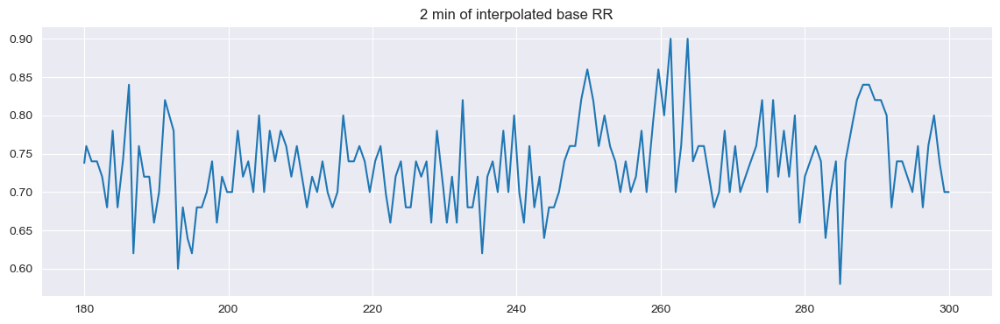

In [260]:
points_base = np.linspace(180, 300, 6000, endpoint=False)
interp_base = np.interp(points_base, rr_base_times_chosen, rr_base_chosen)

figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(points_base, interp_base)
plt.title("2 min of interpolated base RR")
plt.show()

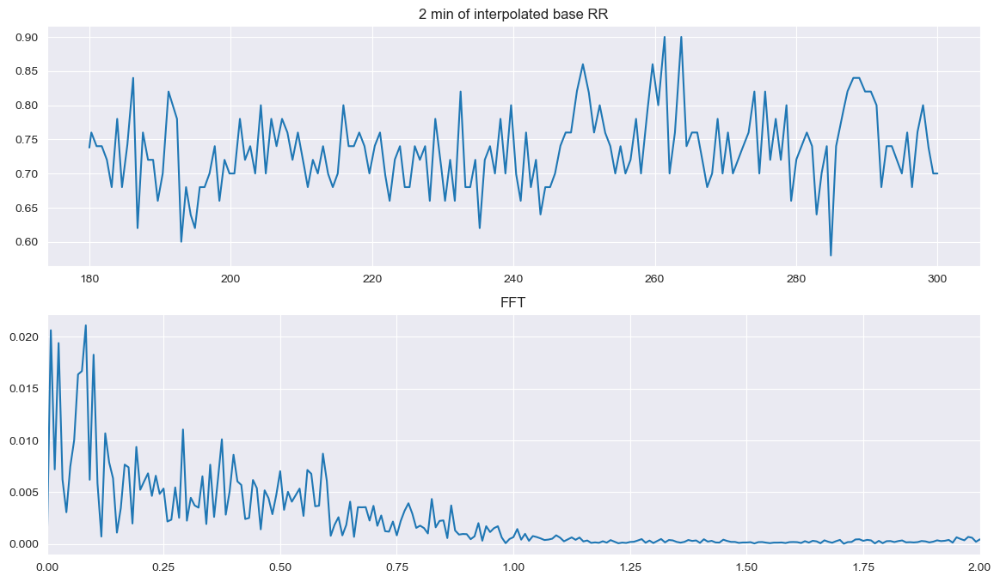

In [264]:
figure, axis = plt.subplots(2, 1, figsize=(14, 8))
axis[0].plot(points_base, interp_base)
axis[0].set_title("2 min of interpolated base RR")

N = len(interp_base)
spacing = 1 / 50
fourierTransform = fft(interp_base - np.average(interp_base))
frequencies = fftfreq(N, spacing)[: N // 2]
axis[1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))
axis[1].set_title("FFT")
axis[1].set_xlim([0, 2])
plt.show()

In [265]:
LF_base = 0
HF_base = 0
fft_res = 2.0 / N * np.abs(fourierTransform[0 : N // 2])
for i in range(len(frequencies)):
    if frequencies[i] > 0.04 and frequencies[i] <= 0.15:
        LF_base += fft_res[i]
    elif frequencies[i] > 0.15 and frequencies[i] <= 0.4:
        HF_base += fft_res[i]
LFHF_base = LF_base / HF_base
print("LF base:", LF_base)
print("HF base:", HF_base)
print("LF/HF base:", LFHF_base)

LF base: 0.131593808473632
HF base: 0.158134716387776
LF/HF base: 0.8321626742032996


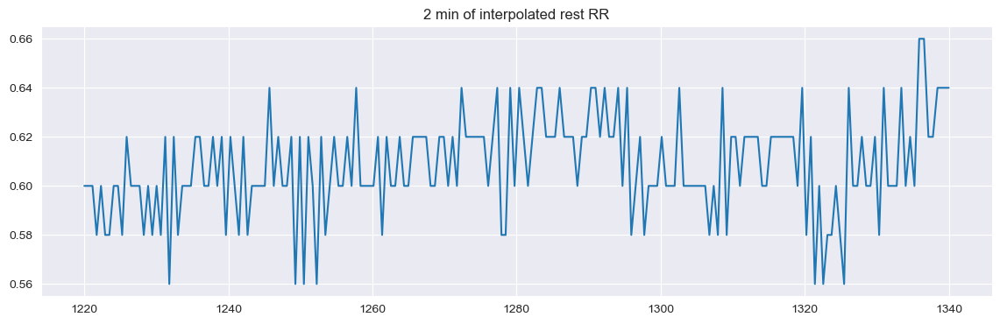

In [266]:
points_rest = np.linspace(1220, 1340, 6000, endpoint=False)
interp_rest = np.interp(points_rest, rr_rest_times_chosen, rr_rest_chosen)

figure, axis = plt.subplots(1, 1, figsize=(14, 4))
plt.plot(points_rest, interp_rest)
plt.title("2 min of interpolated rest RR")
plt.show()

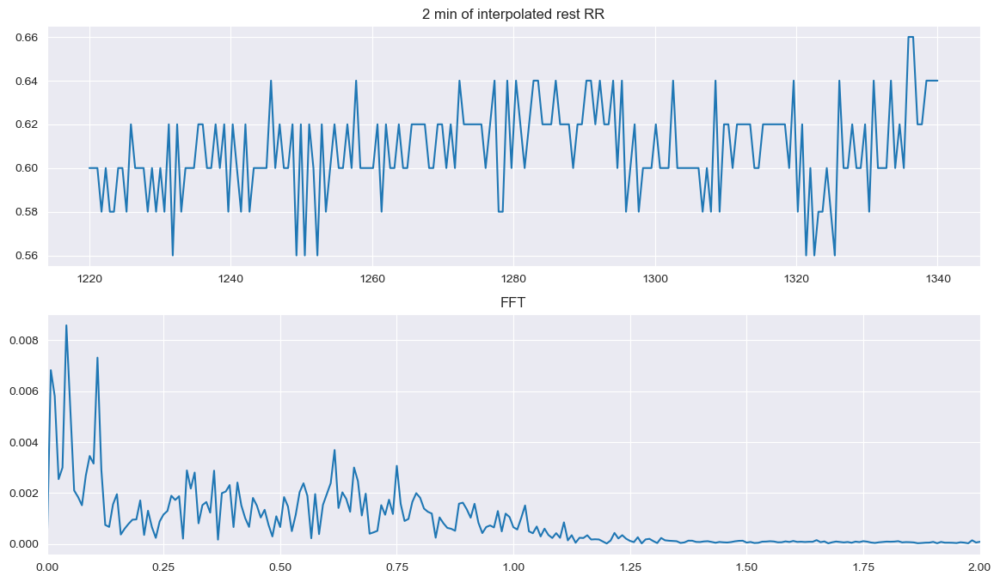

In [267]:
figure, axis = plt.subplots(2, 1, figsize=(14, 8))
axis[0].plot(points_rest, interp_rest)
axis[0].set_title("2 min of interpolated rest RR")

N = len(interp_rest)
spacing = 1 / 50
fourierTransform = fft(interp_rest - np.average(interp_rest))
frequencies = fftfreq(N, spacing)[: N // 2]
axis[1].plot(frequencies, 2.0 / N * np.abs(fourierTransform[0 : N // 2]))
axis[1].set_title("FFT")
axis[1].set_xlim([0, 2])
plt.show()

In [268]:
LF_rest = 0
HF_rest = 0
fft_res = 2.0 / N * np.abs(fourierTransform[0 : N // 2])
for i in range(len(frequencies)):
    if frequencies[i] > 0.04 and frequencies[i] <= 0.15:
        LF_rest += fft_res[i]
    elif frequencies[i] > 0.15 and frequencies[i] <= 0.4:
        HF_rest += fft_res[i]
LFHF_rest = LF_rest / HF_rest
print("LF rest:", LF_rest)
print("HF rest:", HF_rest)
print("LF/HF rest:", LFHF_rest)

LF rest: 0.043750376888988154
HF rest: 0.04002167225598245
LF/HF rest: 1.0931671372739387


In [276]:
q25, q75 = np.percentile(rr_base_chosen, [25, 75])
bin_width = 2 * (q75 - q25) * len(rr_base_chosen) ** (-1/3)
bins = round((np.array(rr_base_chosen).max() - np.array(rr_base_chosen).min()) / bin_width)
print("Freedman–Diaconis number of bins:", bins)

Freedman–Diaconis number of bins: 15


(array([ 2.,  3.,  3.,  8., 17., 27., 22., 27., 19., 12.,  8.,  9.,  3.,
         2.,  2.]),
 array([0.58      , 0.60133333, 0.62266667, 0.644     , 0.66533333,
        0.68666667, 0.708     , 0.72933333, 0.75066667, 0.772     ,
        0.79333333, 0.81466667, 0.836     , 0.85733333, 0.87866667,
        0.9       ]),
 <BarContainer object of 15 artists>)

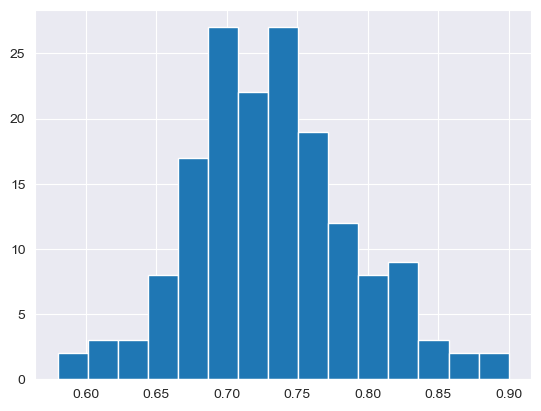

In [277]:
plt.hist(rr_base_chosen, bins=15)

(array([ 1.,  1.,  0.,  3.,  0.,  3.,  0.,  8.,  0., 17.,  0., 27.,  0.,
        22.,  9., 18., 19.,  0., 12.,  0.,  8.,  0.,  9.,  0.,  3.,  0.,
         2.,  0.,  0.,  2.]),
 array([0.58      , 0.59066667, 0.60133333, 0.612     , 0.62266667,
        0.63333333, 0.644     , 0.65466667, 0.66533333, 0.676     ,
        0.68666667, 0.69733333, 0.708     , 0.71866667, 0.72933333,
        0.74      , 0.75066667, 0.76133333, 0.772     , 0.78266667,
        0.79333333, 0.804     , 0.81466667, 0.82533333, 0.836     ,
        0.84666667, 0.85733333, 0.868     , 0.87866667, 0.88933333,
        0.9       ]),
 <BarContainer object of 30 artists>)

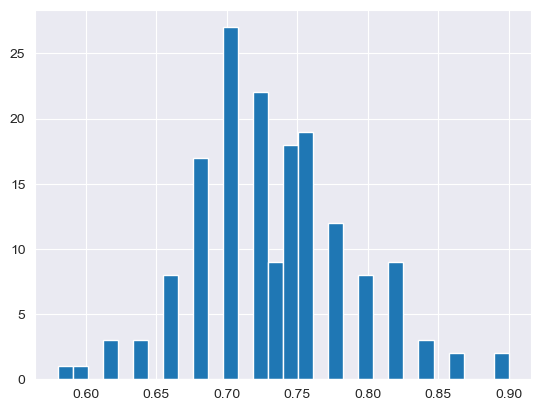

In [286]:
plt.hist(rr_base_chosen, bins=30)

In [272]:
np.median(rr_base_chosen)

0.7299999999999898

In [280]:
from scipy import stats

In [281]:
stats.mode(rr_base_chosen)

/var/folders/_j/__h83t0s3mbbkdhg2b5bz3z00000gn/T/ipykernel_19624/4030704347.py:1: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  stats.mode(rr_base_chosen)


ModeResult(mode=array([0.74]), count=array([18]))

In [284]:
len(rr_base_chosen)

164

In [289]:
def SI(rr, bins=30):
    hist_ampls, edges = np.histogram(rr, bins)
    indmax = np.argmax(hist_ampls)
    mode_val = (edges[indmax] + edges[indmax + 1]) / 2
    a_mode = hist_ampls[indmax] / len(rr)
    maxmin = (edges[-2] + edges[-1]) / 2 - (edges[0] + edges[1]) / 2
    si = a_mode * 100 / (2 * mode_val * maxmin)
    return si

In [291]:
SI(rr_base_chosen)

37.8716168770277

(array([ 7.,  0.,  0.,  0.,  0., 15., 10.,  0.,  0.,  0.,  0., 47., 28.,
         0.,  0.,  0.,  0., 31., 34.,  0.,  0.,  0.,  0., 12., 11.,  0.,
         0.,  0.,  0.,  2.]),
 array([0.56      , 0.56333333, 0.56666667, 0.57      , 0.57333333,
        0.57666667, 0.58      , 0.58333333, 0.58666667, 0.59      ,
        0.59333333, 0.59666667, 0.6       , 0.60333333, 0.60666667,
        0.61      , 0.61333333, 0.61666667, 0.62      , 0.62333333,
        0.62666667, 0.63      , 0.63333333, 0.63666667, 0.64      ,
        0.64333333, 0.64666667, 0.65      , 0.65333333, 0.65666667,
        0.66      ]),
 <BarContainer object of 30 artists>)

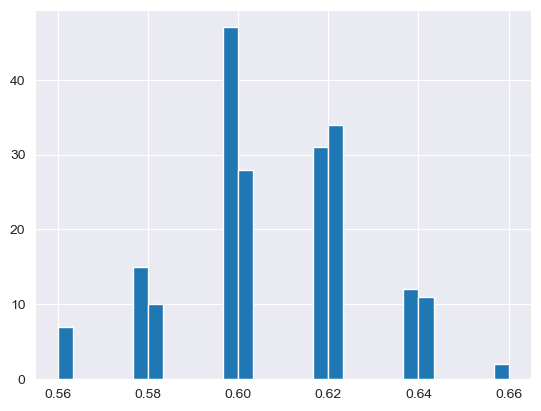

In [297]:
plt.hist(rr_rest_chosen, bins=30)

In [295]:
stats.mode(rr_rest_chosen)

/var/folders/_j/__h83t0s3mbbkdhg2b5bz3z00000gn/T/ipykernel_19624/2933703585.py:1: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  stats.mode(rr_rest_chosen)


ModeResult(mode=array([0.6]), count=array([47]))

In [298]:
SI(rr_rest_chosen)

206.24417652718176

In [299]:
print("SI during base:", SI(rr_base_chosen))
print("SI during rest:", SI(rr_rest_chosen))

SI during base: 37.8716168770277
SI during rest: 206.24417652718176


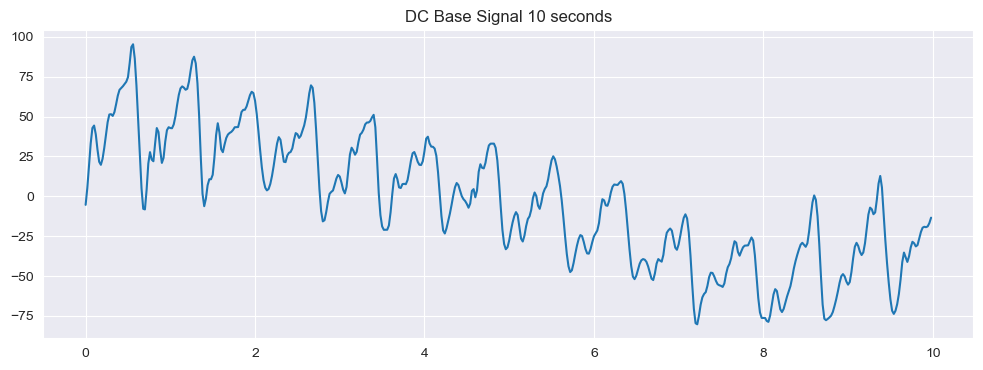

In [301]:
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[:500], dc_base[:500] - imf_base[:, 8][:500] - imf_base[:, 0][:500])
plt.title("DC Base Signal 10 seconds")
plt.show()

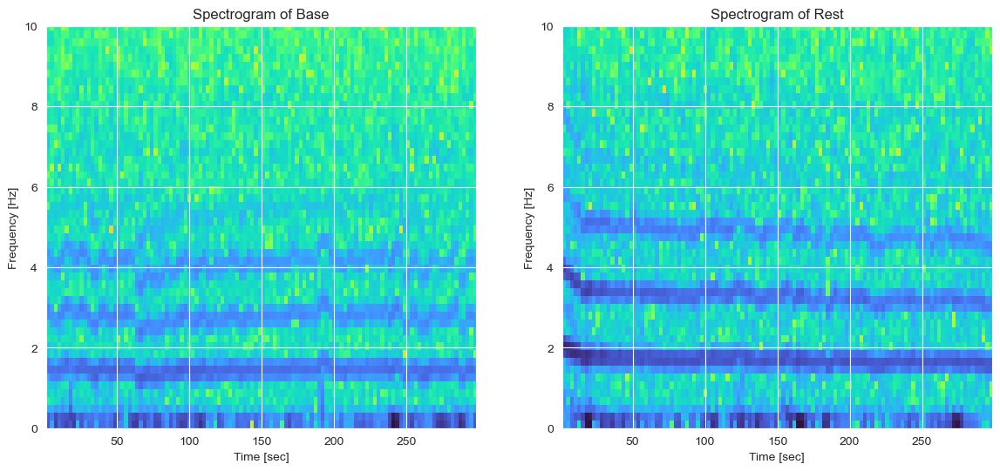

In [311]:
base_spec = dc_base - imf_base[:, 8] - imf_base[:, 0]
rest_spec = dc_rest - imf_rest[:, 8] - imf_rest[:, 0]

figure, axis = plt.subplots(1, 2, figsize=(14, 6))
axis[0].specgram(base_spec, Fs=50, cmap='turbo_r')
axis[0].set_title('Spectrogram of Base')
axis[0].set_ylabel('Frequency [Hz]')
axis[0].set_xlabel('Time [sec]')
axis[0].set_ylim([0, 10])

axis[1].specgram(rest_spec, Fs=50, cmap='turbo_r')
axis[1].set_title('Spectrogram of Rest')
axis[1].set_ylabel('Frequency [Hz]')
axis[1].set_xlabel('Time [sec]')
axis[1].set_ylim([0, 10])
plt.show()

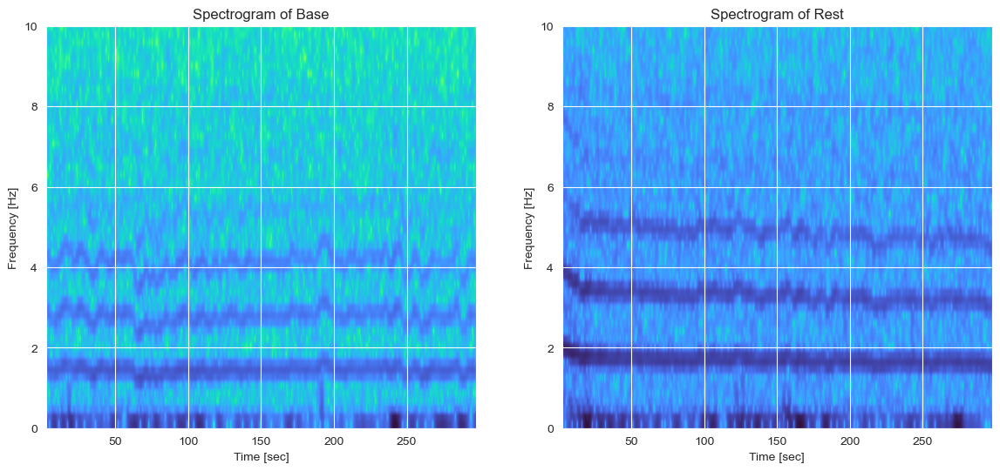

In [314]:
base_spec = dc_base - imf_base[:, 8] - imf_base[:, 0]
rest_spec = dc_rest - imf_rest[:, 8] - imf_rest[:, 0]

figure, axis = plt.subplots(1, 2, figsize=(14, 6))
axis[0].specgram(base_spec, Fs=50, noverlap=250, cmap='turbo_r')
axis[0].set_title('Spectrogram of Base')
axis[0].set_ylabel('Frequency [Hz]')
axis[0].set_xlabel('Time [sec]')
axis[0].set_ylim([0, 10])

axis[1].specgram(rest_spec, Fs=50, noverlap=250, cmap='turbo_r')
axis[1].set_title('Spectrogram of Rest')
axis[1].set_ylabel('Frequency [Hz]')
axis[1].set_xlabel('Time [sec]')
axis[1].set_ylim([0, 10])
plt.show()

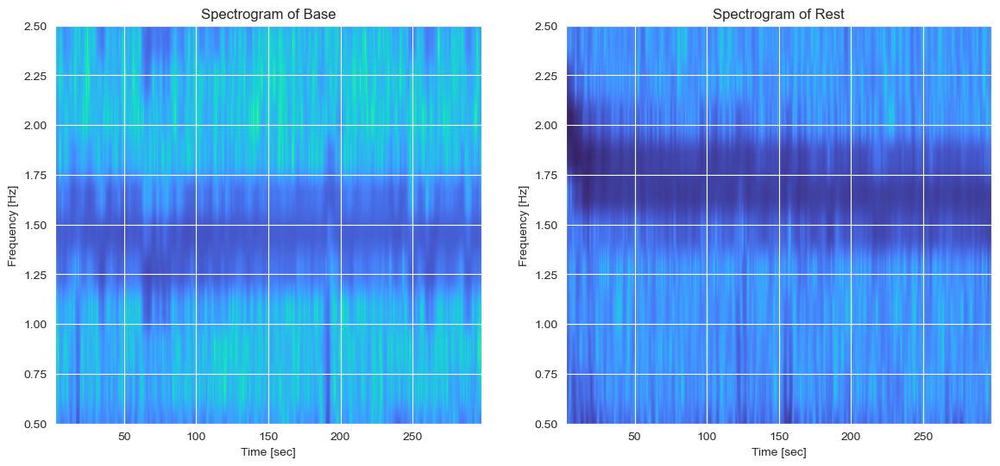

In [103]:
base_spec = dc_base - imf_base[:, 8] - imf_base[:, 0]
rest_spec = dc_rest - imf_rest[:, 8] - imf_rest[:, 0]

figure, axis = plt.subplots(1, 2, figsize=(14, 6))
axis[0].specgram(base_spec, Fs=50, noverlap=255, cmap='turbo_r')
axis[0].set_title('Spectrogram of Base')
axis[0].set_ylabel('Frequency [Hz]')
axis[0].set_xlabel('Time [sec]')
axis[0].set_ylim([0.5, 2.5])

axis[1].specgram(rest_spec, Fs=50, noverlap=255, cmap='turbo_r')
axis[1].set_title('Spectrogram of Rest')
axis[1].set_ylabel('Frequency [Hz]')
axis[1].set_xlabel('Time [sec]')
axis[1].set_ylim([0.5, 2.5])
plt.show()

In [105]:
import pywt
wavelist = pywt.wavelist(kind='continuous')
wavelist

['cgau1',
 'cgau2',
 'cgau3',
 'cgau4',
 'cgau5',
 'cgau6',
 'cgau7',
 'cgau8',
 'cmor',
 'fbsp',
 'gaus1',
 'gaus2',
 'gaus3',
 'gaus4',
 'gaus5',
 'gaus6',
 'gaus7',
 'gaus8',
 'mexh',
 'morl',
 'shan']

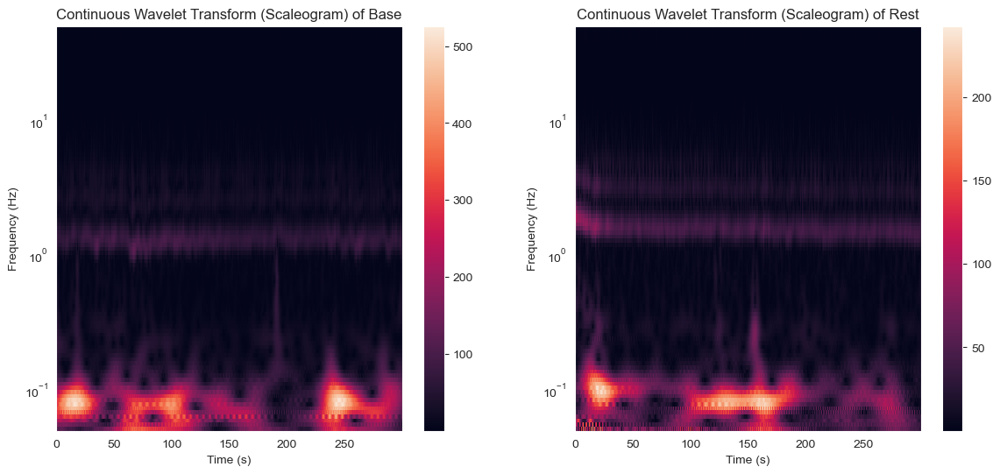

In [310]:
figure, axis = plt.subplots(1, 2, figsize=(14, 6))

wavelet = "cmor1.5-1.0"
# logarithmic scale for scales, as suggested by Torrence & Compo:
widths = np.geomspace(1, 1024, num=100)
sampling_period = np.diff(time_base).mean()
cwtmatr, freqs = pywt.cwt(base_spec, widths, wavelet, sampling_period=sampling_period)
# absolute take absolute value of complex result
cwtmatr = np.abs(cwtmatr[:-1, :-1])

pcm = axis[0].pcolormesh(time_base, freqs, cwtmatr)
axis[0].set_yscale("log")
axis[0].set_xlabel("Time (s)")
axis[0].set_ylabel("Frequency (Hz)")
axis[0].set_title("Continuous Wavelet Transform (Scaleogram) of Base")
figure.colorbar(pcm, ax=axis[0])

widths = np.geomspace(1, 1024, num=100)
sampling_period = np.diff(time_rest).mean()
cwtmatr, freqs = pywt.cwt(rest_spec, widths, wavelet, sampling_period=sampling_period)
# absolute take absolute value of complex result
cwtmatr = np.abs(cwtmatr[:-1, :-1])

pcm = axis[1].pcolormesh(time_base, freqs, cwtmatr)
axis[1].set_yscale("log")
axis[1].set_xlabel("Time (s)")
axis[1].set_ylabel("Frequency (Hz)")
axis[1].set_title("Continuous Wavelet Transform (Scaleogram) of Rest")
figure.colorbar(pcm, ax=axis[1])

plt.show()

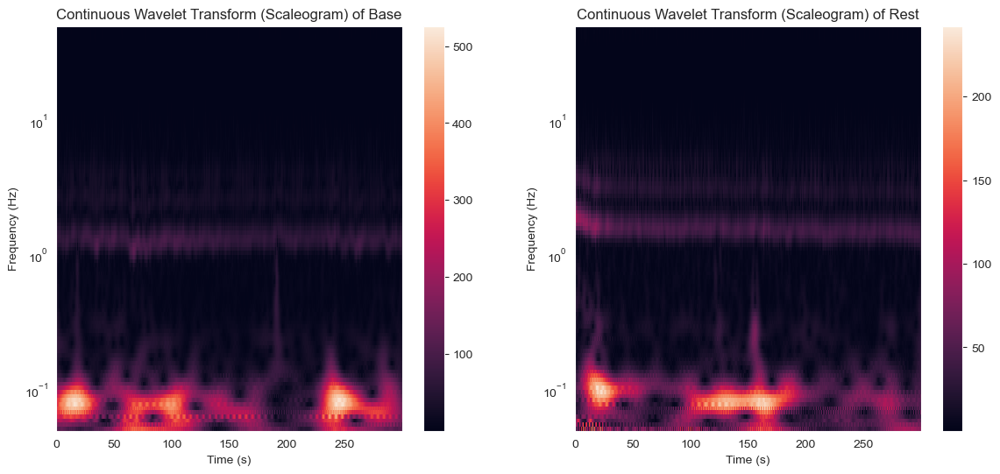

In [108]:
base_spec = dc_base - imf_base[:, 8] - imf_base[:, 0] - imf_base[:, 7]
rest_spec = dc_rest - imf_rest[:, 8] - imf_rest[:, 0] - imf_base[:, 7]

figure, axis = plt.subplots(1, 2, figsize=(14, 6))

wavelet = "cmor1.5-1.0"
# logarithmic scale for scales, as suggested by Torrence & Compo:
widths = np.geomspace(1, 1024, num=100)
sampling_period = np.diff(time_base).mean()
cwtmatr, freqs = pywt.cwt(base_spec, widths, wavelet, sampling_period=sampling_period)
# absolute take absolute value of complex result
cwtmatr = np.abs(cwtmatr[:-1, :-1])

pcm = axis[0].pcolormesh(time_base, freqs, cwtmatr)
axis[0].set_yscale("log")
axis[0].set_xlabel("Time (s)")
axis[0].set_ylabel("Frequency (Hz)")
axis[0].set_title("Continuous Wavelet Transform (Scaleogram) of Base")
figure.colorbar(pcm, ax=axis[0])

widths = np.geomspace(1, 1024, num=100)
sampling_period = np.diff(time_rest).mean()
cwtmatr, freqs = pywt.cwt(rest_spec, widths, wavelet, sampling_period=sampling_period)
# absolute take absolute value of complex result
cwtmatr = np.abs(cwtmatr[:-1, :-1])

pcm = axis[1].pcolormesh(time_base, freqs, cwtmatr)
axis[1].set_yscale("log")
axis[1].set_xlabel("Time (s)")
axis[1].set_ylabel("Frequency (Hz)")
axis[1].set_title("Continuous Wavelet Transform (Scaleogram) of Rest")
figure.colorbar(pcm, ax=axis[1])

plt.show()

In [112]:
freqs.shape

(100,)

In [111]:
cwtmatr.shape

(99, 14999)

### Вычисление параметров медленных колебаний гемодинамики <a id="mkg"></a>
[Вернуться к содержанию](#contents)

In [113]:
endo = [0.005, 0.02]
neo = [0.02, 0.05]
mio = [0.05, 0.15]
breath = [0.15, 0.4]

In [114]:
rr_base_times_chosen = rr_base_times.copy()
rr_base_chosen = rr_base.copy()
for i in sorted(outliers, reverse=True):
    del rr_base_times_chosen[i]
    del rr_base_chosen[i]

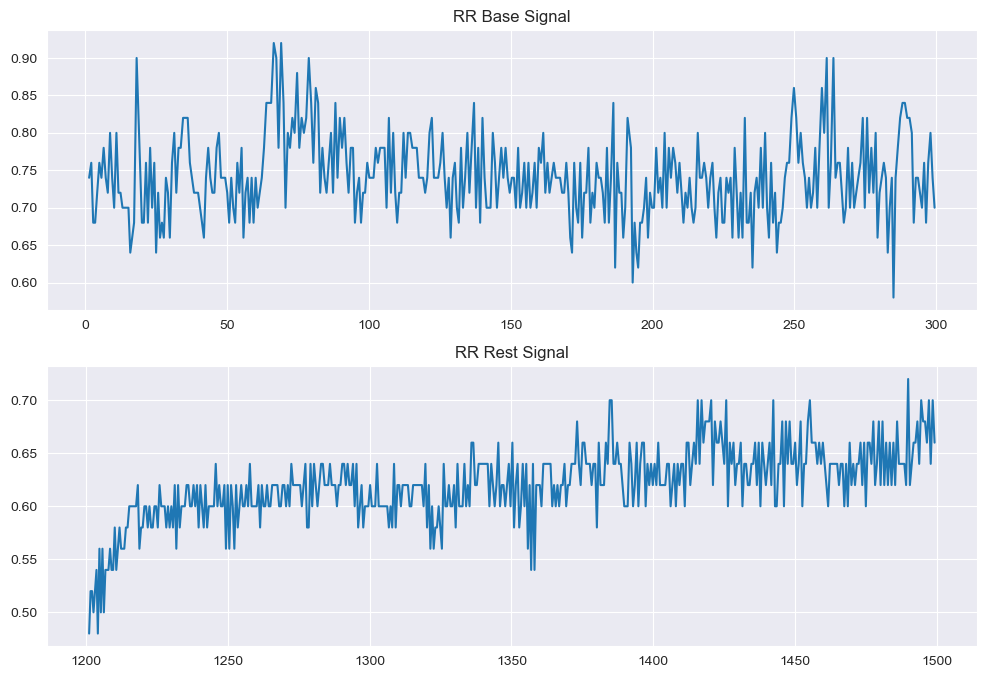

In [115]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(rr_base_times_chosen, rr_base_chosen)
axis[0].set_title("RR Base Signal")
axis[1].plot(rr_rest_times, rr_rest)
axis[1].set_title("RR Rest Signal")
plt.show()

In [ ]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(rr_base_times_chosen, rr_base_chosen)
axis[0].set_title("RR Base Signal")
axis[1].plot(rr_rest_times, rr_rest)
axis[1].set_title("RR Rest Signal")
plt.show()

In [122]:
base_spec = dc_base - imf_base[:, 8] - imf_base[:, 0] - imf_base[:, 7]
rest_spec = dc_rest - imf_rest[:, 8] - imf_rest[:, 0] - imf_base[:, 7]

In [144]:
N = len(base_spec)
spacing = 1 / 50
fourierTransform = fft(base_spec.copy())
frequencies = fftfreq(N, spacing)[: N // 2]
values =  2.0 / N * np.abs(fourierTransform[0 : N // 2])

e_v = 0
n_v = 0
m_v = 0
b_v = 0
total = 0
numbers = [0 for i in range(4)]
for i in range(len(frequencies)):
    if frequencies[i] > endo[0] and frequencies[i] <= endo[1]:
        e_v += values[i]
        total += values[i]
        numbers[0] += 1
    elif frequencies[i] > neo[0] and frequencies[i] <= neo[1]:
        n_v += values[i]
        total += values[i]
        numbers[1] += 1
    elif frequencies[i] > mio[0] and frequencies[i] <= mio[1]:
        m_v += values[i]
        total += values[i]
        numbers[2] += 1
    elif frequencies[i] > breath[0] and frequencies[i] <= breath[1]:
        b_v += values[i]
        total += values[i]
        numbers[3] += 1
res_base = np.array([e_v/total, n_v/total, m_v/total, b_v/total, m_v / b_v / 4])
res_base

array([0.12405448, 0.17148956, 0.49691202, 0.20754393, 0.59856245])

In [145]:
N = len(rest_spec)
spacing = 1 / 50
fourierTransform = fft(rest_spec.copy())
frequencies = fftfreq(N, spacing)[: N // 2]
values =  2.0 / N * np.abs(fourierTransform[0 : N // 2])

e_v = 0
n_v = 0
m_v = 0
b_v = 0
total = 0
numbers = [0 for i in range(4)]
for i in range(len(frequencies)):
    if frequencies[i] > endo[0] and frequencies[i] <= endo[1]:
        e_v += values[i]
        total += values[i]
        numbers[0] += 1
    elif frequencies[i] > neo[0] and frequencies[i] <= neo[1]:
        n_v += values[i]
        total += values[i]
        numbers[1] += 1
    elif frequencies[i] > mio[0] and frequencies[i] <= mio[1]:
        m_v += values[i]
        total += values[i]
        numbers[2] += 1
    elif frequencies[i] > breath[0] and frequencies[i] <= breath[1]:
        b_v += values[i]
        total += values[i]
        numbers[3] += 1
res_rest = np.array([e_v/total, n_v/total, m_v/total, b_v/total, m_v / b_v / 4])
res_rest

array([0.22730563, 0.18223357, 0.37700437, 0.21345643, 0.44154722])

Text(0.5, 1.0, 'Baseline')

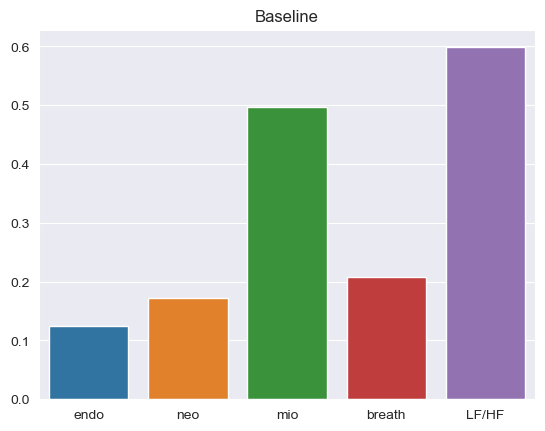

In [146]:
types = ["endo", "neo", "mio", "breath", 'LF/HF']
sns.barplot(x=types, y=res_base).set_title('Baseline')

Text(0.5, 1.0, 'Rest')

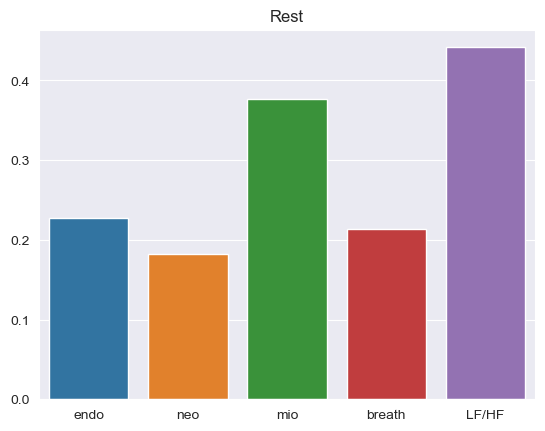

In [147]:
types = ["endo", "neo", "mio", "breath", 'LF/HF']
sns.barplot(x=types, y=res_rest).set_title('Rest')

In [148]:
freq_data = types + types
value_data = list(res_base) + list(res_rest)
moment_data = ['base'] * 5 + ['rest'] * 5
data = {'freq': freq_data, 'value': value_data, 'moment': moment_data}
data_df = pd.DataFrame.from_dict(data)
data_df

,freq,value,moment
0,endo,0.124054,base
1,neo,0.171490,base
2,mio,0.496912,base
3,breath,0.207544,base
4,LF/HF,0.598562,base
5,endo,0.227306,rest
6,neo,0.182234,rest
7,mio,0.377004,rest
8,breath,0.213456,rest
9,LF/HF,0.441547,rest


In [467]:
freq_data = types + types
value_data = list(res_base) + list(res_rest)
moment_data = ['no stress'] * 5 + ['stress'] * 5
data = {'freq': freq_data, 'value': value_data, 'moment': moment_data}
data_df = pd.DataFrame.from_dict(data)
data_df

,freq,value,moment
0,endo,0.124054,no stress
1,neo,0.171490,no stress
2,mio,0.496912,no stress
3,breath,0.207544,no stress
4,LF/HF,0.598562,no stress
5,endo,0.227306,stress
6,neo,0.182234,stress
7,mio,0.377004,stress
8,breath,0.213456,stress
9,LF/HF,0.441547,stress


Text(0.5, 1.0, 'Power of components')

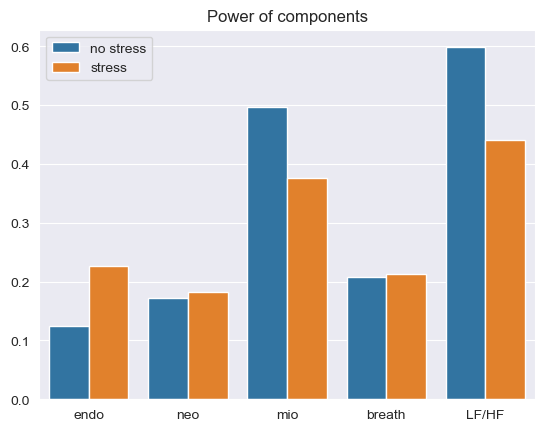

In [469]:
sns.barplot(x="freq", y="value", hue="moment", data=data).set_title('Power of components')

### Подготовка дополнительных данных для обучения <a id="more"></a>
[Вернуться к содержанию](#contents)

In [151]:
def get_rr_base(signal, time):
    imf_base = emd.sift.sift(signal)
    pulse = imf_base[:, 2] + imf_base[:, 3]
    dy = np.gradient(pulse)
    smoothed_dy = gaussian_filter1d(dy, 4.1)
    minimums = []
    for i in range(len(smoothed_dy) - 1):
        if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
            minimums.append(i)
    rr = []
    rr_times = []
    for i in range(1, len(minimums)):
        rr.append(time[minimums[i]] - time[minimums[i-1]])
        rr_times.append(time[minimums[i]])
    return rr_times, rr

def get_rr_rest(signal, time):
    imf_rest = emd.sift.sift(signal)
    imf_pulse_rest = imf_rest[:, 1] + imf_rest[:, 2] + imf_rest[:, 3]
    pulse = pd.Series(imf_pulse_rest).rolling(5, center=True).mean().to_numpy()
    dy = np.gradient(pulse)
    smoothed_dy = gaussian_filter1d(dy, 4.1)
    minimums = []
    for i in range(len(smoothed_dy) - 1):
        if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
            minimums.append(i)
    rr = []
    rr_times = []
    for i in range(1, len(minimums)):
        rr.append(time[minimums[i]] - time[minimums[i-1]])
        rr_times.append(time[minimums[i]])
    return rr_times, rr

In [161]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 2 A'].values

dc_base = dc_real[:15000]
dc_walk_1 = dc_real[15000:30000]
dc_walk_2 = dc_real[30000:45000]
dc_walk_3 = dc_real[45000:60000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_walk_1 = time_real[15000:30000]
time_walk_2 = time_real[30000:45000]
time_walk_3 = time_real[45000:60000]
time_rest = time_real[60000:75000]

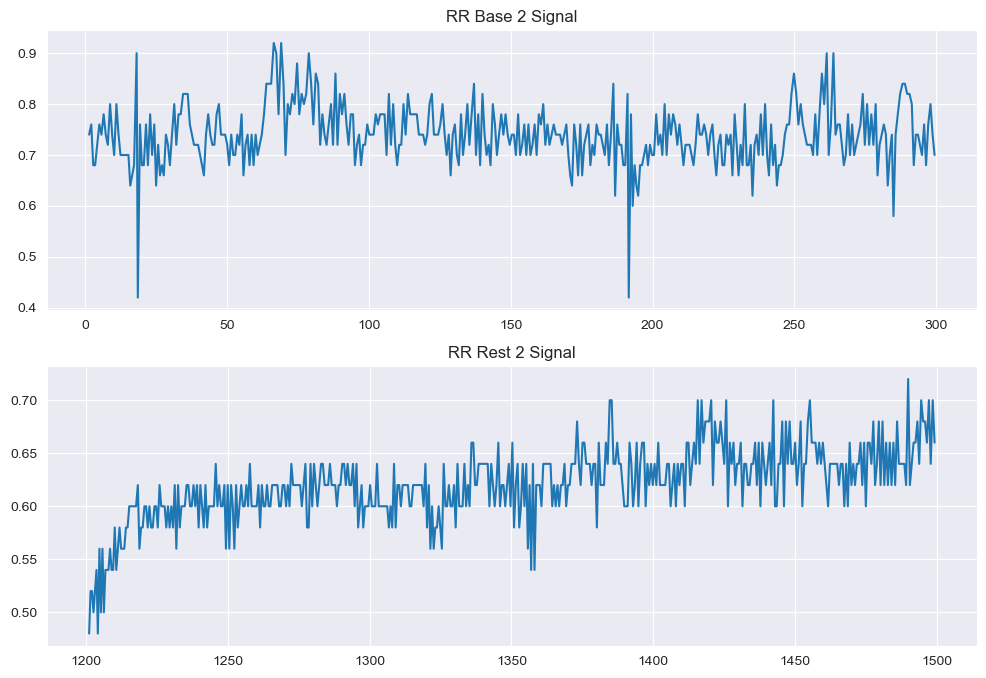

In [162]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_2, rr_base_2 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_2, rr_base_2)
axis[0].set_title("RR Base 2 Signal")
rr_times_rest_2, rr_rest_2 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_2, rr_rest_2)
axis[1].set_title("RR Rest 2 Signal")
plt.show()

In [ ]:
outliers = []
for i in range(len(rr_base)):
    if rr_base[i] < 0.5:
        outliers.append(i)

rr_base_times_chosen = rr_base_times.copy()
rr_base_chosen = rr_base.copy()
for i in sorted(outliers, reverse=True):
    del rr_base_times_chosen[i]
    del rr_base_chosen[i]

In [164]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 1 A'].values

dc_base = dc_real[:15000]
dc_walk_1 = dc_real[15000:30000]
dc_walk_2 = dc_real[30000:45000]
dc_walk_3 = dc_real[45000:60000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_walk_1 = time_real[15000:30000]
time_walk_2 = time_real[30000:45000]
time_walk_3 = time_real[45000:60000]
time_rest = time_real[60000:75000]

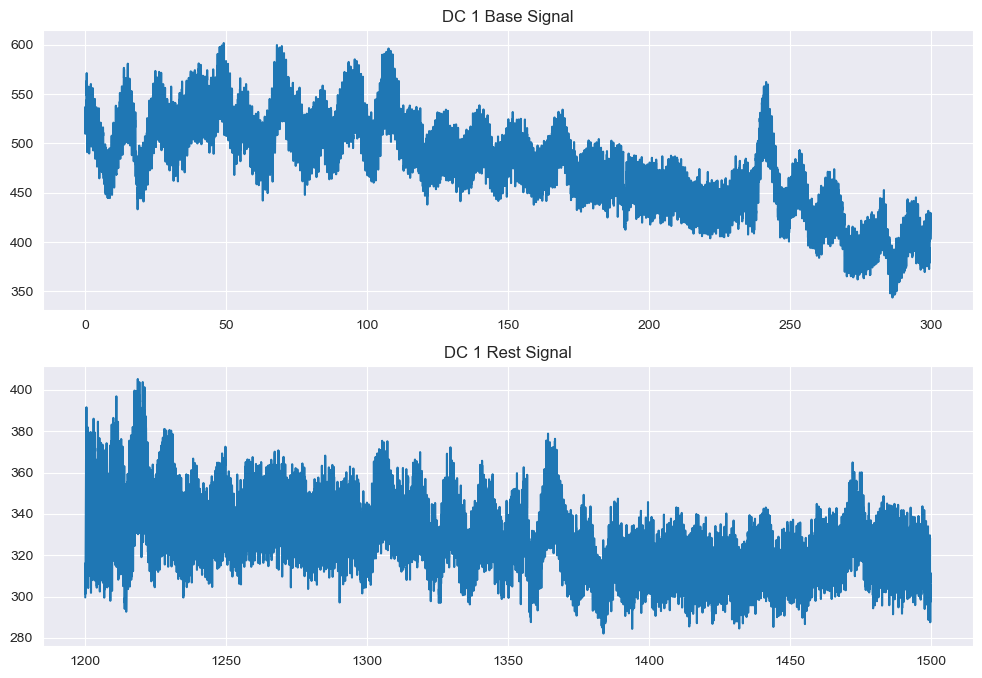

In [165]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 1 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 1 Rest Signal")
plt.show()

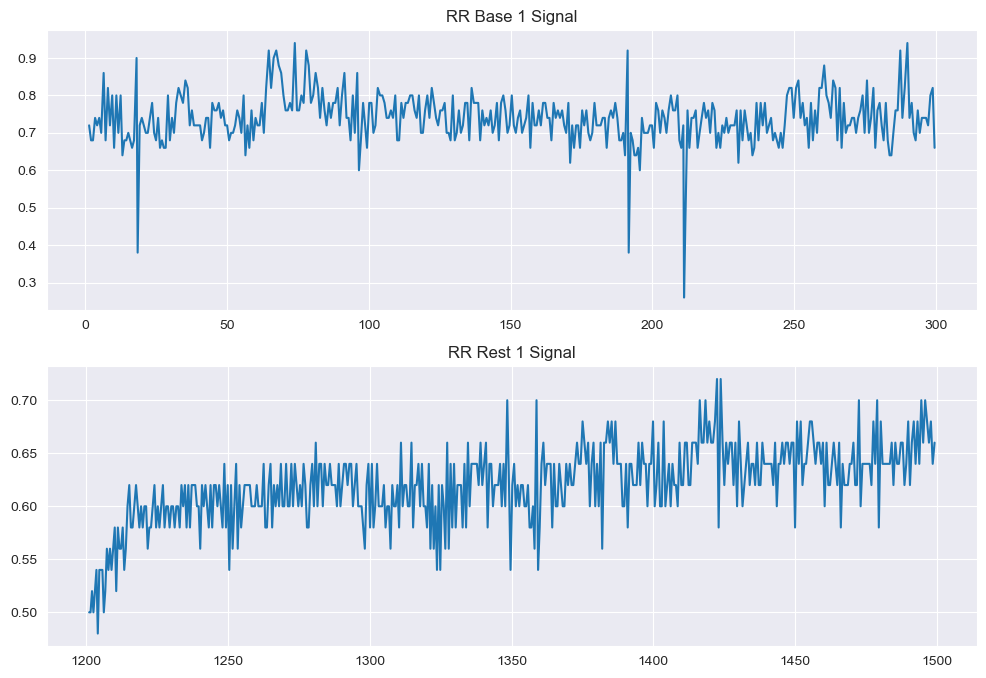

In [166]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_1, rr_base_1 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_1, rr_base_1)
axis[0].set_title("RR Base 1 Signal")
rr_times_rest_1, rr_rest_1 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_1, rr_rest_1)
axis[1].set_title("RR Rest 1 Signal")
plt.show()

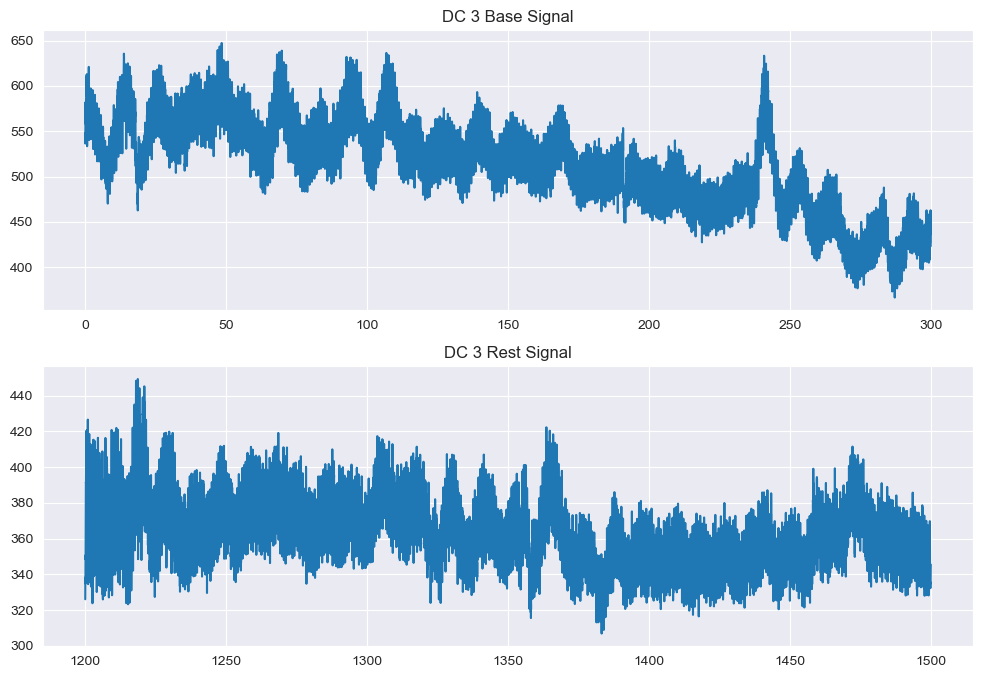

In [167]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 3 A'].values

dc_base = dc_real[:15000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_rest = time_real[60000:75000]

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 3 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 3 Rest Signal")
plt.show()

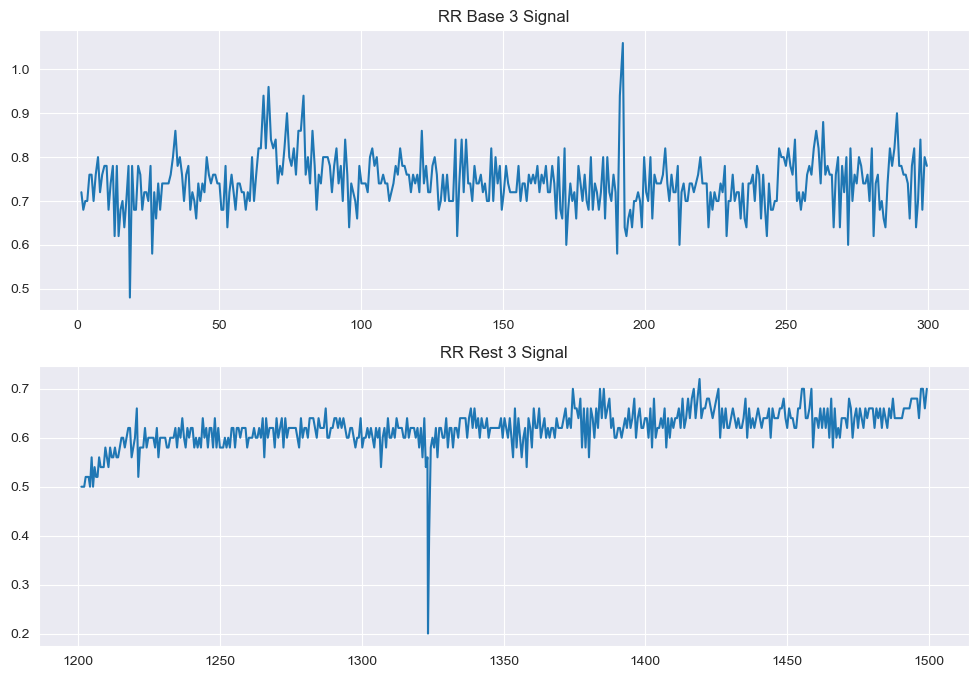

In [168]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_3, rr_base_3 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_3, rr_base_3)
axis[0].set_title("RR Base 3 Signal")
rr_times_rest_3, rr_rest_3 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_3, rr_rest_3)
axis[1].set_title("RR Rest 3 Signal")
plt.show()

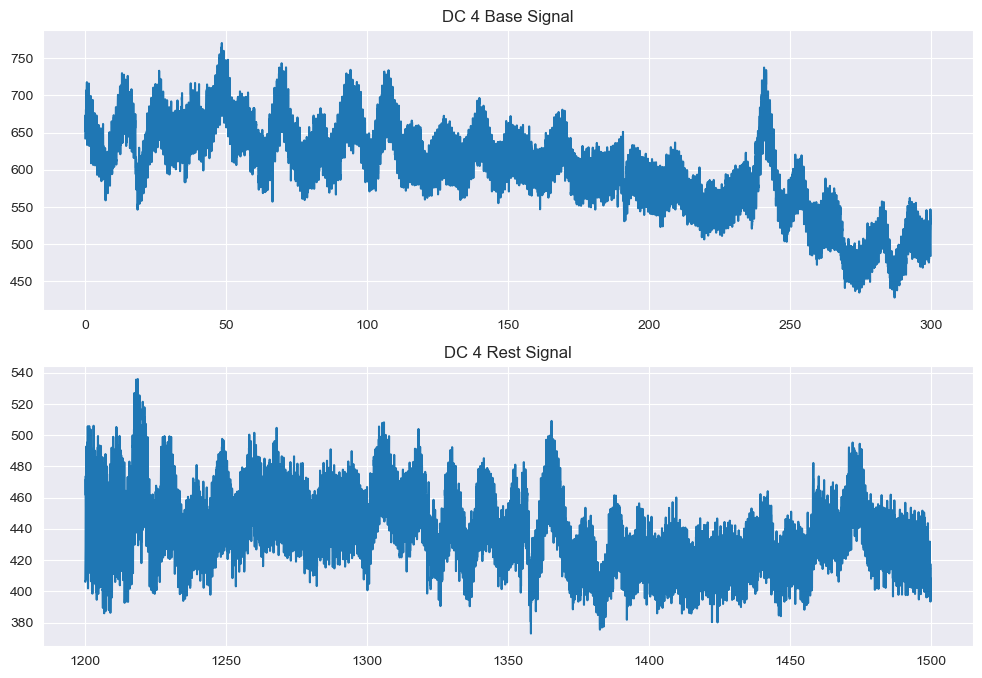

In [169]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 4 A'].values

dc_base = dc_real[:15000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_rest = time_real[60000:75000]

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 4 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 4 Rest Signal")
plt.show()

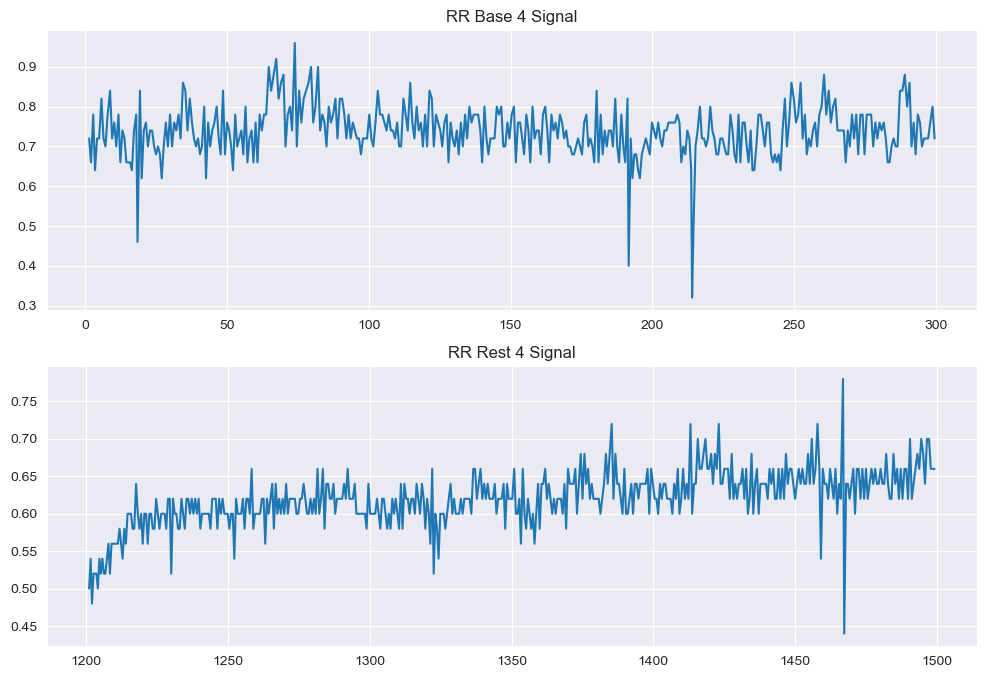

In [170]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_4, rr_base_4 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_4, rr_base_4)
axis[0].set_title("RR Base 4 Signal")
rr_times_rest_4, rr_rest_4 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_4, rr_rest_4)
axis[1].set_title("RR Rest 4 Signal")
plt.show()

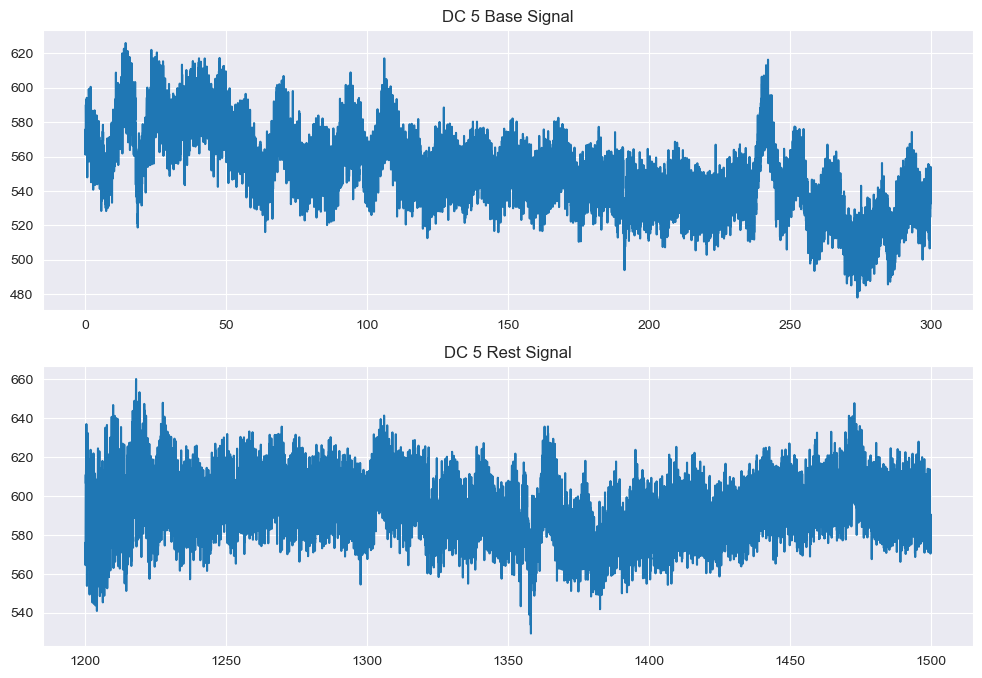

In [194]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 5 A'].values

dc_base = dc_real[:15000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_rest = time_real[60000:75000]

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 5 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 5 Rest Signal")
plt.show()

In [208]:
def get_rr_base(signal, time):
    imf_base = emd.sift.sift(signal)
    imf_pulse_base = imf_base[:, 2] + imf_base[:, 3]
    pulse = pd.Series(imf_pulse_base).rolling(10, center=True).mean().to_numpy()
    dy = np.gradient(pulse)
    smoothed_dy = gaussian_filter1d(dy, 4.1)
    minimums = []
    for i in range(len(smoothed_dy) - 1):
        if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
            minimums.append(i)
    rr = []
    rr_times = []
    for i in range(1, len(minimums)):
        rr.append(time[minimums[i]] - time[minimums[i-1]])
        rr_times.append(time[minimums[i]])
    return rr_times, rr

def get_rr_rest(signal, time):
    imf_rest = emd.sift.sift(signal)
    imf_pulse_rest = imf_rest[:, 1] + imf_rest[:, 2] + imf_rest[:, 3]
    pulse = pd.Series(imf_pulse_rest).rolling(5, center=True).mean().to_numpy()
    dy = np.gradient(pulse)
    smoothed_dy = gaussian_filter1d(dy, 4.1)
    minimums = []
    for i in range(len(smoothed_dy) - 1):
        if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
            minimums.append(i)
    rr = []
    rr_times = []
    for i in range(1, len(minimums)):
        rr.append(time[minimums[i]] - time[minimums[i-1]])
        rr_times.append(time[minimums[i]])
    return rr_times, rr

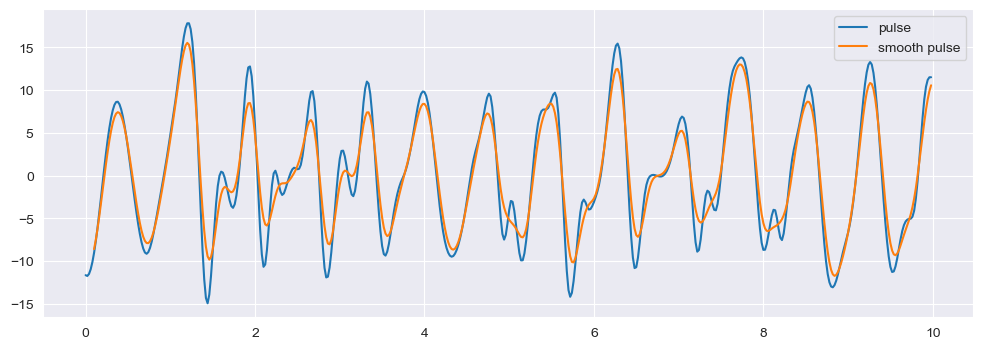

In [185]:
imf_base_5 = emd.sift.sift(dc_base)
pulse = imf_base_5[:, 2] + imf_base_5[:, 3]
pulse_sm = pd.Series(pulse).rolling(10, center=True).mean().to_numpy()
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[:500], pulse[:500])
plt.plot(time_base[:500], pulse_sm[:500])
plt.legend(['pulse', "smooth pulse"])
plt.show()

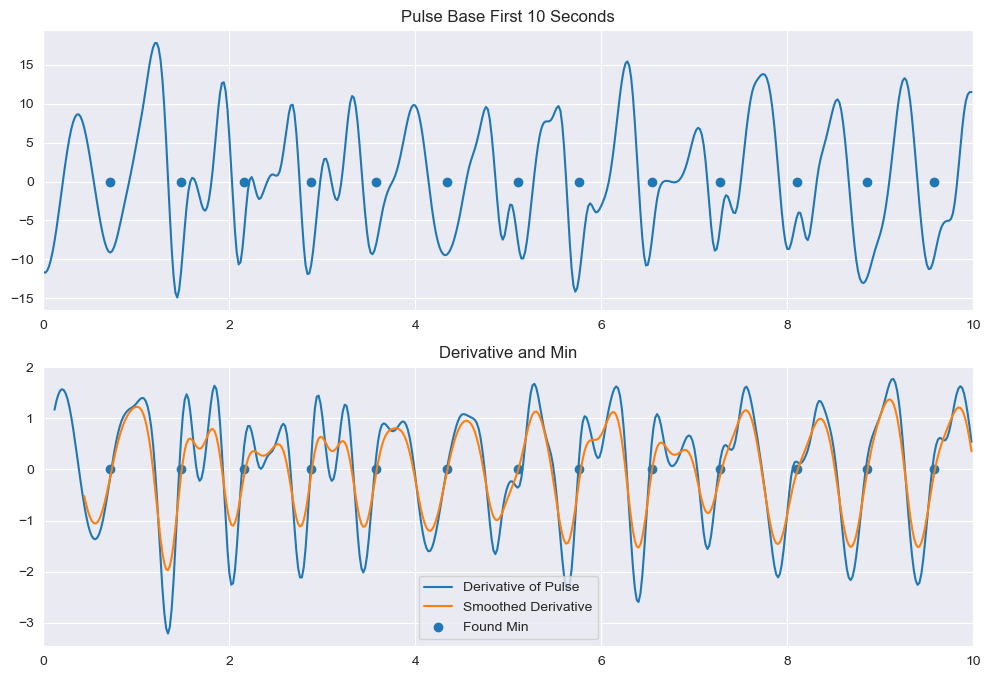

In [188]:
dy = np.gradient(pulse_sm)
smoothed_dy = gaussian_filter1d(dy, 4)
minimums_base = []
for i in range(len(smoothed_dy) - 1):
    if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
        minimums_base.append(i)
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base[:500], pulse[:500])
axis[0].set_title("Pulse Base First 10 Seconds")
axis[0].set_xlim([0, 10])

axis[1].plot(time_base[:500], dy[:500])
axis[1].plot(time_base[:500], smoothed_dy[:500])
axis[1].scatter(time_base[minimums_base[:13]], np.zeros(len(minimums_base[:13])))
axis[0].scatter(time_base[minimums_base[:13]], np.zeros(len(minimums_base[:13])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
axis[1].set_xlim([0, 10])

plt.show()

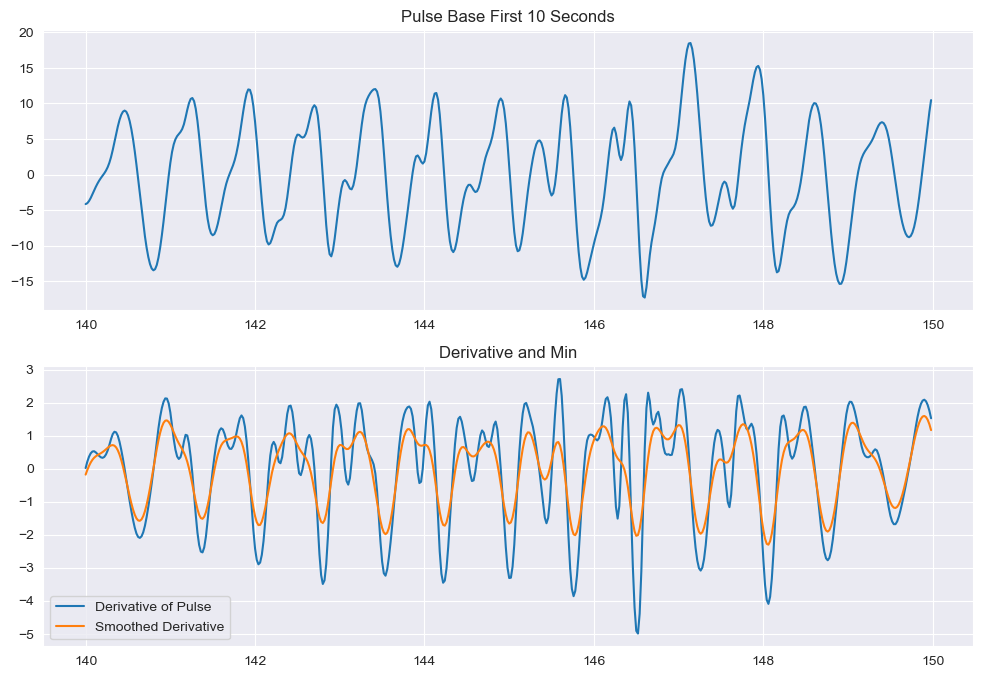

In [183]:
dy = np.gradient(pulse)
smoothed_dy = gaussian_filter1d(dy, 4)
minimums_base = []
for i in range(len(smoothed_dy) - 1):
    if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
        minimums_base.append(i)
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(time_base[7000:7500], pulse[7000:7500])
axis[0].set_title("Pulse Base First 10 Seconds")
#axis[0].set_xlim([0, 10])

axis[1].plot(time_base[7000:7500], dy[7000:7500])
axis[1].plot(time_base[7000:7500], smoothed_dy[7000:7500])
# axis[1].scatter(time_base[minimums_base[:13]], np.zeros(len(minimums_base[:13])))
# axis[0].scatter(time_base[minimums_base[:13]], np.zeros(len(minimums_base[:13])))
axis[1].legend(["Derivative of Pulse", "Smoothed Derivative", "Found Min"])
axis[1].set_title("Derivative and Min")
#axis[1].set_xlim([0, 10])

plt.show()

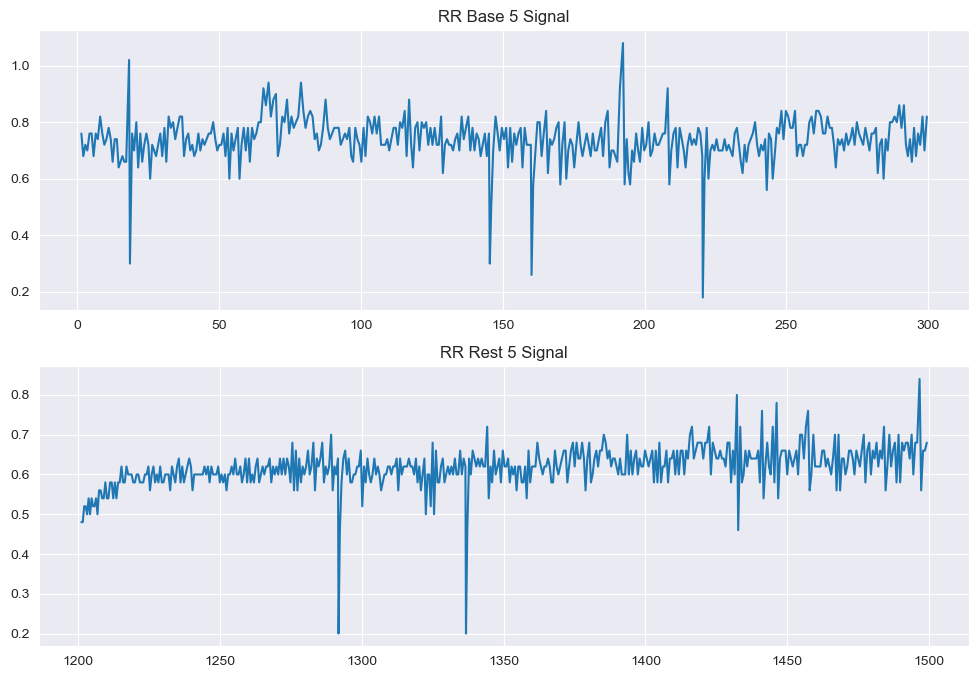

In [195]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_5, rr_base_5 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_5, rr_base_5)
axis[0].set_title("RR Base 5 Signal")
rr_times_rest_5, rr_rest_5 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_5, rr_rest_5)
axis[1].set_title("RR Rest 5 Signal")
plt.show()

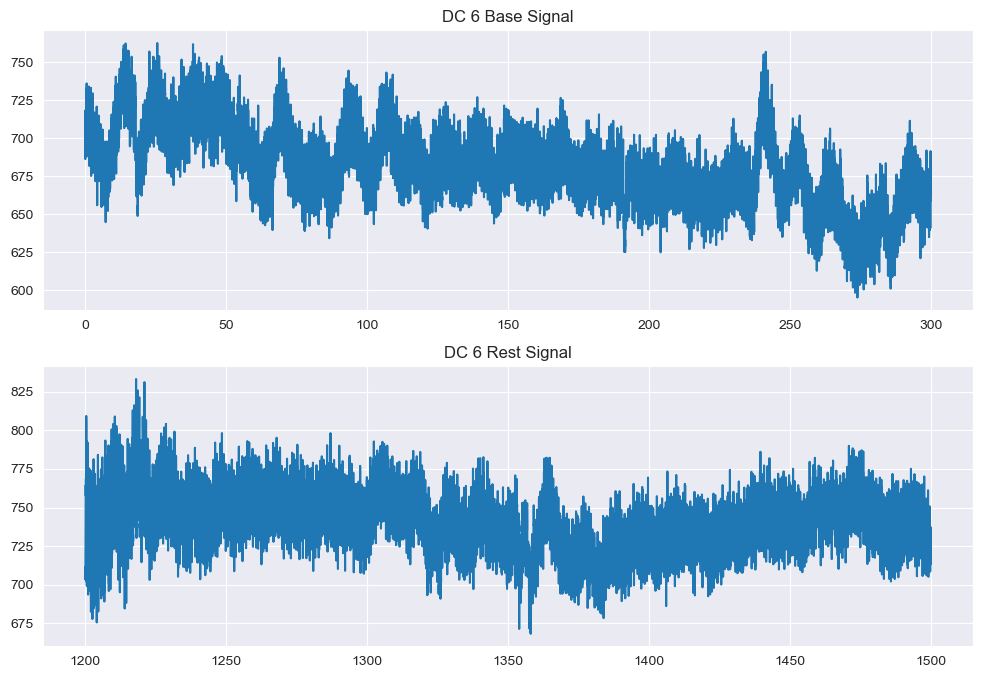

In [192]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 6 A'].values

dc_base = dc_real[:15000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_rest = time_real[60000:75000]

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 6 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 6 Rest Signal")
plt.show()

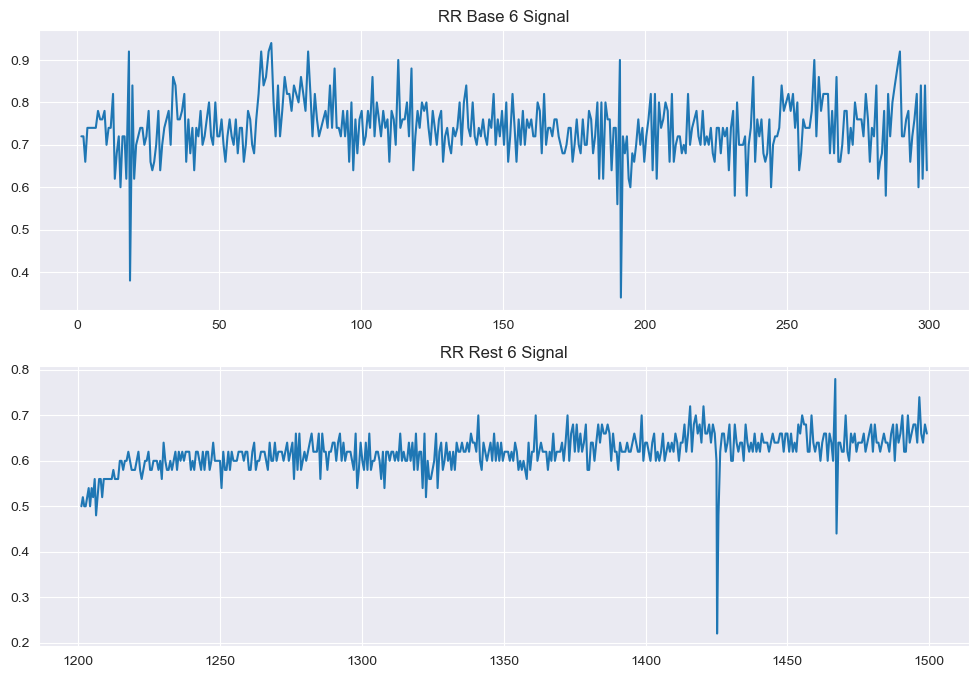

In [193]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_6, rr_base_6 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_6, rr_base_6)
axis[0].set_title("RR Base 6 Signal")
rr_times_rest_6, rr_rest_6 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_6, rr_rest_6)
axis[1].set_title("RR Rest 6 Signal")
plt.show()

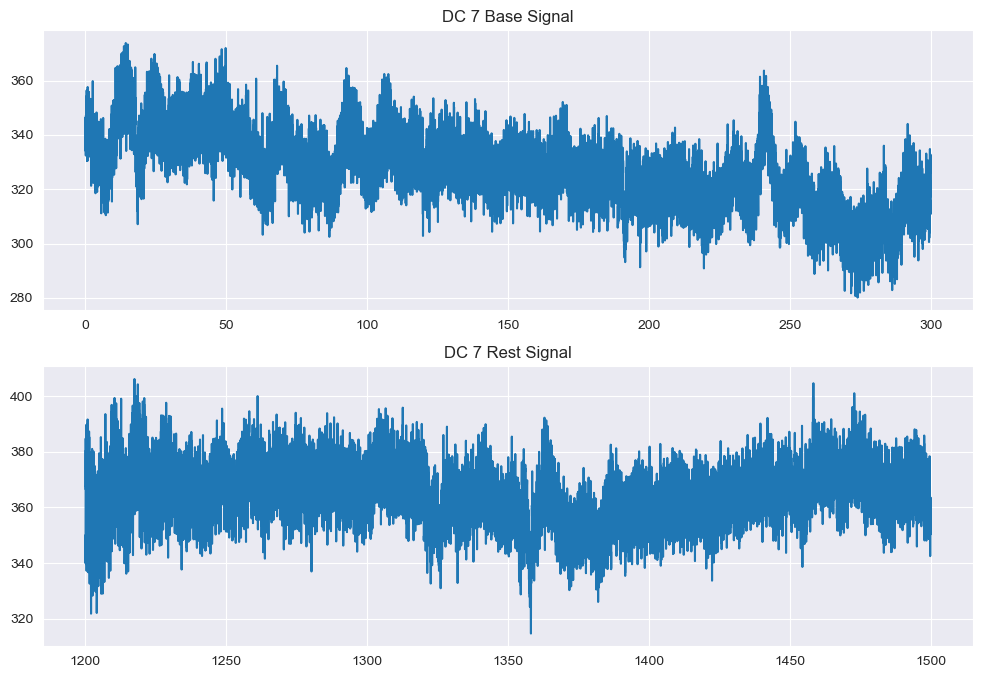

In [196]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 7 A'].values

dc_base = dc_real[:15000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_rest = time_real[60000:75000]

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 7 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 7 Rest Signal")
plt.show()

In [206]:
def get_rr_base(signal, time):
    imf_base = emd.sift.sift(signal)
    imf_pulse_base = imf_base[:, 2] + imf_base[:, 3]
    pulse = pd.Series(imf_pulse_base).rolling(10, center=True).mean().to_numpy()
    dy = np.gradient(pulse)
    smoothed_dy = gaussian_filter1d(dy, 4.5)
    minimums = []
    for i in range(len(smoothed_dy) - 1):
        if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
            minimums.append(i)
    rr = []
    rr_times = []
    for i in range(1, len(minimums)):
        rr.append(time[minimums[i]] - time[minimums[i-1]])
        rr_times.append(time[minimums[i]])
    return rr_times, rr

def get_rr_rest(signal, time):
    imf_rest = emd.sift.sift(signal)
    imf_pulse_rest = imf_rest[:, 1] + imf_rest[:, 2] + imf_rest[:, 3]
    pulse = pd.Series(imf_pulse_rest).rolling(5, center=True).mean().to_numpy()
    dy = np.gradient(pulse)
    smoothed_dy = gaussian_filter1d(dy, 4.5)
    minimums = []
    for i in range(len(smoothed_dy) - 1):
        if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
            minimums.append(i)
    rr = []
    rr_times = []
    for i in range(1, len(minimums)):
        rr.append(time[minimums[i]] - time[minimums[i-1]])
        rr_times.append(time[minimums[i]])
    return rr_times, rr

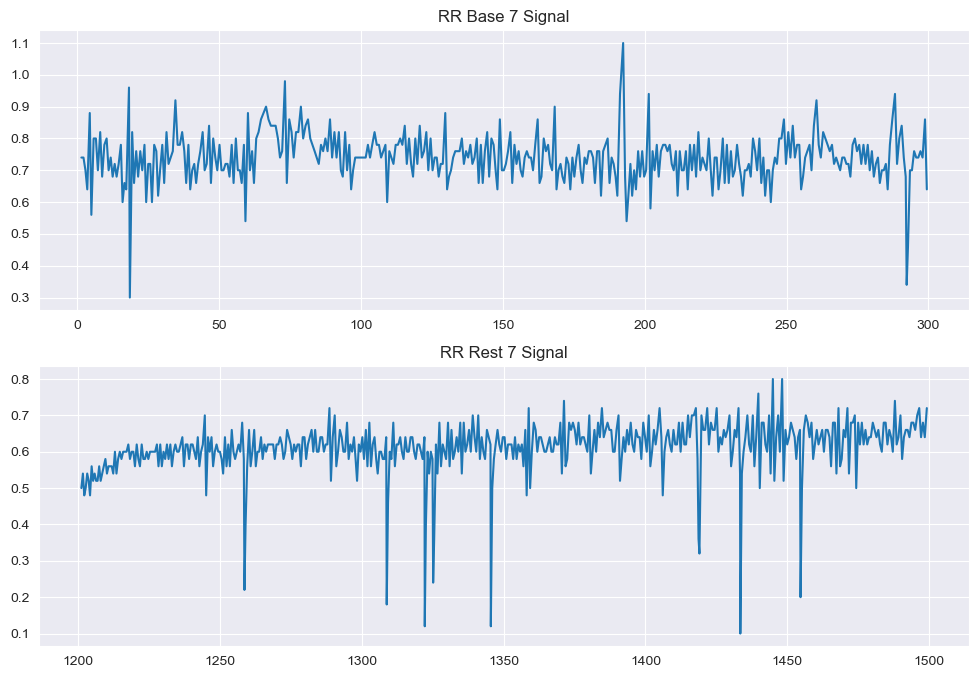

In [207]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_7, rr_base_7 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_7, rr_base_7)
axis[0].set_title("RR Base 7 Signal")
rr_times_rest_7, rr_rest_7 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_7, rr_rest_7)
axis[1].set_title("RR Rest 7 Signal")
plt.show()

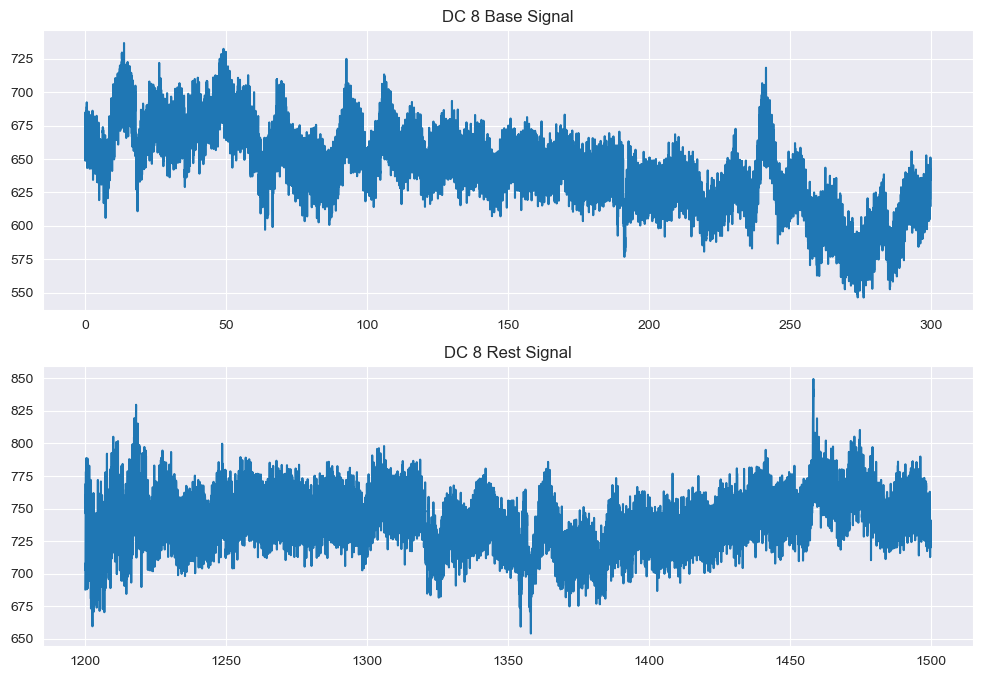

In [209]:
time_real = df_real[' Time'].values
dc_real = df_real['DC 8 A'].values

dc_base = dc_real[:15000]
dc_rest = dc_real[60000:75000]

time_base = time_real[:15000]
time_rest = time_real[60000:75000]

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 8 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 8 Rest Signal")
plt.show()

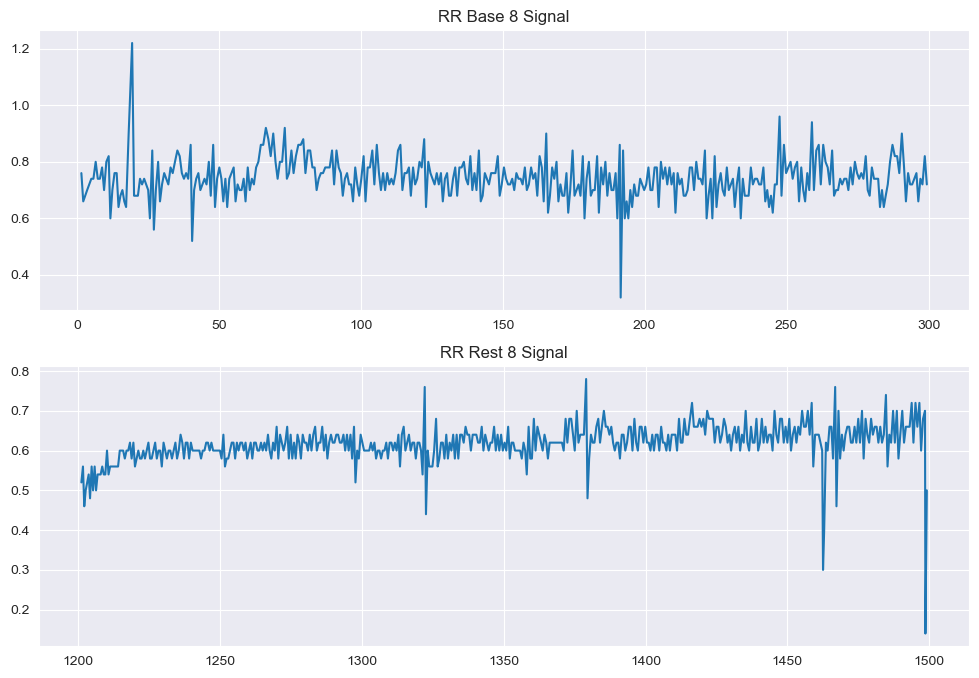

In [210]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_8, rr_base_8 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_8, rr_base_8)
axis[0].set_title("RR Base 8 Signal")
rr_times_rest_8, rr_rest_8 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_8, rr_rest_8)
axis[1].set_title("RR Rest 8 Signal")
plt.show()

In [212]:
def remove_outliers_base(rr_times, rr):
    outliers = []
    for i in range(len(rr)):
        if rr[i] < 0.5 or rr[i] > 1:
            outliers.append(i)
    rr_base_times_fin = rr_times.copy()
    rr_base_fin = rr.copy()
    for i in sorted(outliers, reverse=True):
        del rr_base_times_fin[i]
        del rr_base_fin[i]
    return rr_base_times_fin, rr_base_fin

In [211]:
def remove_outliers_rest(rr_times, rr):
    start_ind, end_ind = 0, 0
    for i in range(1, len(rr_times)):
        if rr_times[i - 1] < 1220 and rr_times[i] >= 1220:
            start_ind = i
        elif rr_times[i - 1] <= 1340 and rr_times[i] > 1340:
            end_ind = i
    rr_times_chosen = rr_times[start_ind:end_ind]
    rr_rest_chosen = rr[start_ind:end_ind]
    
    outliers = []
    for i in range(len(rr_rest_chosen)):
        if rr_rest_chosen[i] < 0.5 or rr_rest_chosen[i] > 0.75:
            outliers.append(i)

    rr_rest_times_fin = rr_times_chosen.copy()
    rr_rest_fin = rr_rest_chosen.copy()
    for i in sorted(outliers, reverse=True):
        del rr_rest_times_fin[i]
        del rr_rest_fin[i]
    return rr_rest_times_fin, rr_rest_fin

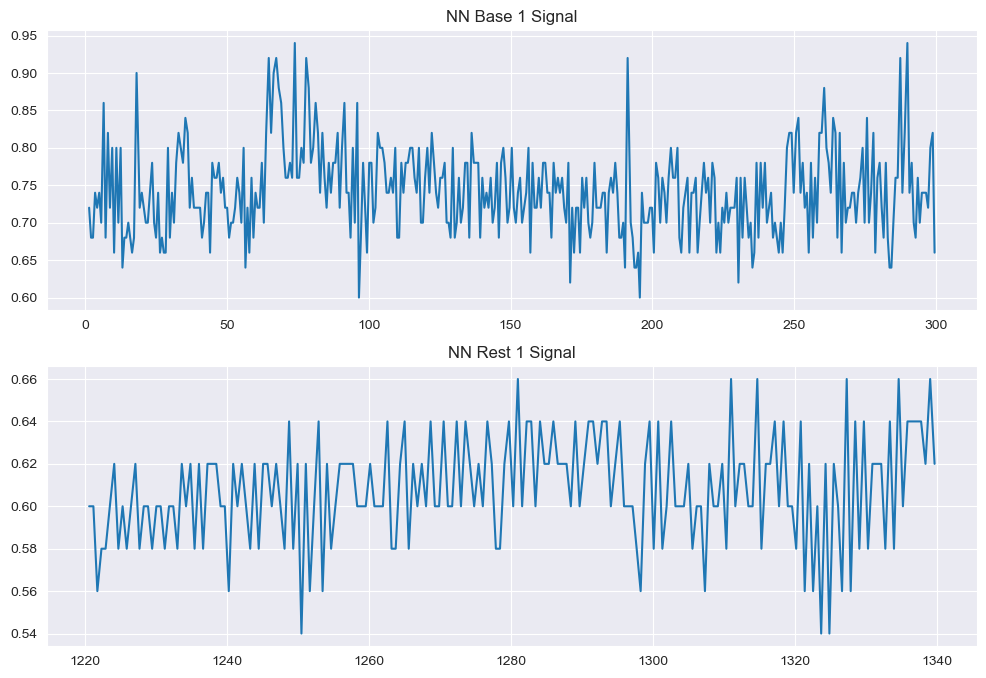

In [213]:
nn_times_base_1, nn_base_1 = remove_outliers_base(rr_times_base_1, rr_base_1)
nn_times_rest_1, nn_rest_1 = remove_outliers_rest(rr_times_rest_1, rr_rest_1)

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(nn_times_base_1, nn_base_1)
axis[0].set_title("NN Base 1 Signal")

axis[1].plot(nn_times_rest_1, nn_rest_1)
axis[1].set_title("NN Rest 1 Signal")
plt.show()

In [214]:
base_1_min = []
base_1_min_times = []
rest_1_min = []
rest_1_min_times = []

def split_into_min_base(rr_times, rr):
    global base_1_min
    global base_1_min_times
    edges = [0] * 6
    for i in range(len(rr)-1):
        if rr_times[i] <= 60 and rr_times[i+1] > 60:
            edges[1] = i
        elif rr_times[i] <= 120 and rr_times[i+1] > 120:
            edges[2] = i
        elif rr_times[i] <= 180 and rr_times[i+1] > 60:
            edges[3] = i
        elif rr_times[i] <= 240 and rr_times[i+1] > 240:
            edges[4] = i
    edges[5] = len(rr_times)
    for i in range(1, 6):
        base_1_min_times.append(rr_times[edges[i-1]:edges[i]])
        base_1_min.append(rr[edges[i-1]:edges[i]])

def split_into_min_rest(rr_times, rr):
    global rest_1_min
    global rest_1_min_times
    edges = [0] * 3
    for i in range(len(rr)-1):
        if rr_times[i] <= 1280 and rr_times[i+1] > 1280:
            edges[1] = i
    edges[2] = len(rr_times)
    for i in range(1, 3):
        rest_1_min_times.append(rr_times[edges[i-1]:edges[i]])
        rest_1_min.append(rr[edges[i-1]:edges[i]])

In [215]:
split_into_min_base(nn_times_base_1, nn_base_1)
split_into_min_rest(nn_times_rest_1, nn_rest_1)

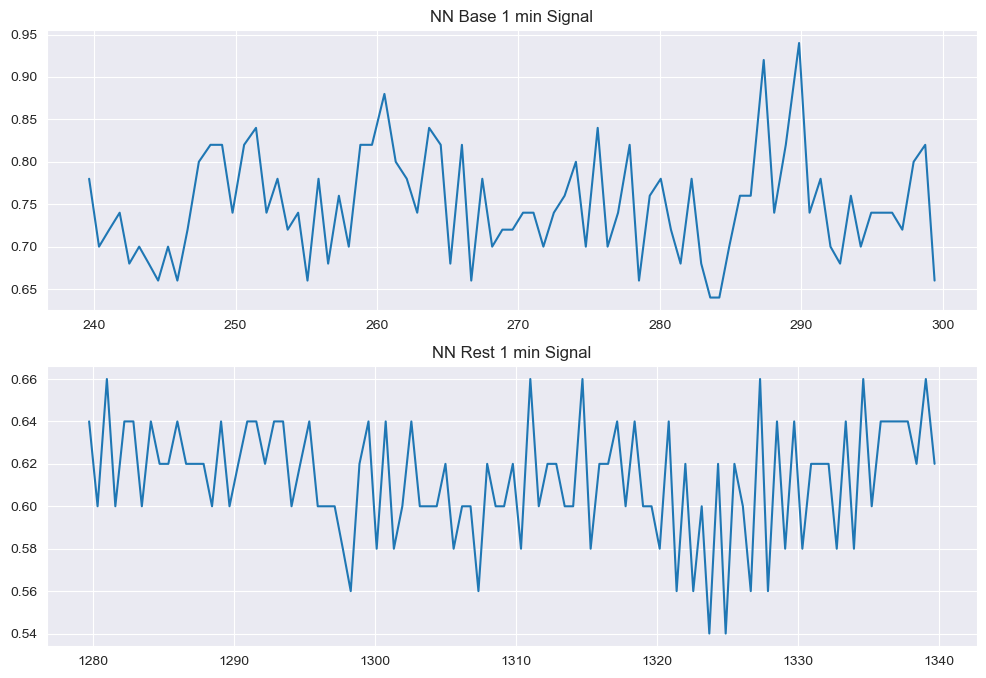

In [221]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(base_1_min_times[4], base_1_min[4])
axis[0].set_title("NN Base 1 min Signal")

axis[1].plot(rest_1_min_times[1], rest_1_min[1])
axis[1].set_title("NN Rest 1 min Signal")
plt.show()

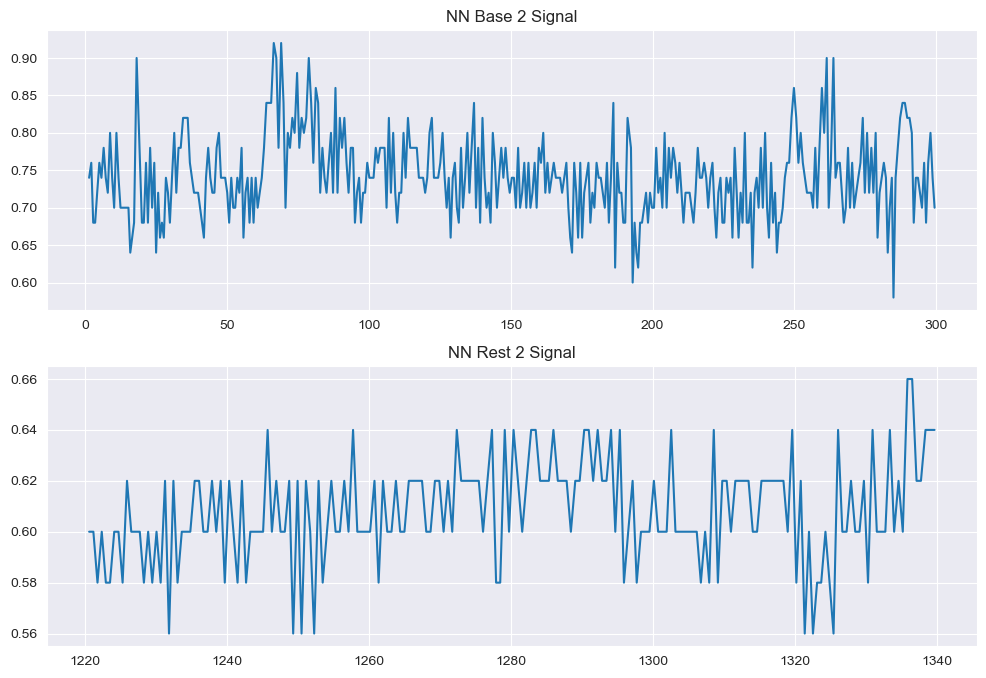

In [222]:
nn_times_base_2, nn_base_2 = remove_outliers_base(rr_times_base_2, rr_base_2)
nn_times_rest_2, nn_rest_2 = remove_outliers_rest(rr_times_rest_2, rr_rest_2)

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(nn_times_base_2, nn_base_2)
axis[0].set_title("NN Base 2 Signal")

axis[1].plot(nn_times_rest_2, nn_rest_2)
axis[1].set_title("NN Rest 2 Signal")
plt.show()

In [ ]:
split_into_min_base(nn_times_base_2, nn_base_2)
split_into_min_rest(nn_times_rest_2, nn_rest_2)

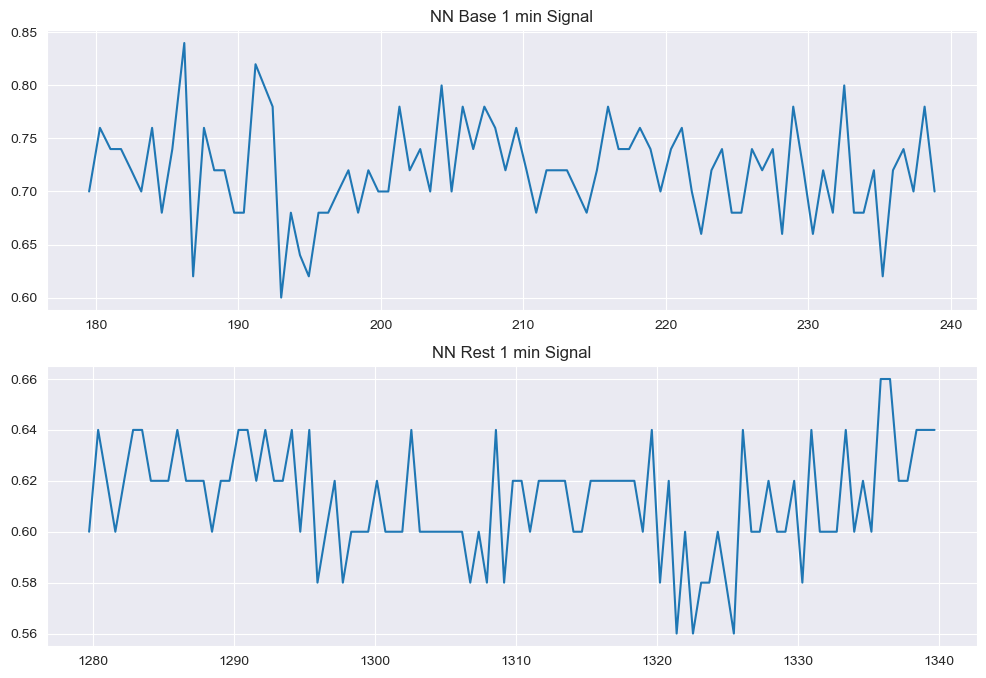

In [225]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(base_1_min_times[8], base_1_min[8])
axis[0].set_title("NN Base 1 min Signal")

axis[1].plot(rest_1_min_times[3], rest_1_min[3])
axis[1].set_title("NN Rest 1 min Signal")
plt.show()

In [224]:
nn_times_base_3, nn_base_3 = remove_outliers_base(rr_times_base_3, rr_base_3)
nn_times_rest_3, nn_rest_3 = remove_outliers_rest(rr_times_rest_3, rr_rest_3)

split_into_min_base(nn_times_base_3, nn_base_3)
split_into_min_rest(nn_times_rest_3, nn_rest_3)

In [226]:
nn_times_base_4, nn_base_4 = remove_outliers_base(rr_times_base_4, rr_base_4)
nn_times_rest_4, nn_rest_4 = remove_outliers_rest(rr_times_rest_4, rr_rest_4)

split_into_min_base(nn_times_base_4, nn_base_4)
split_into_min_rest(nn_times_rest_4, nn_rest_4)

In [227]:
nn_times_base_5, nn_base_5 = remove_outliers_base(rr_times_base_5, rr_base_5)
nn_times_rest_5, nn_rest_5 = remove_outliers_rest(rr_times_rest_5, rr_rest_5)

split_into_min_base(nn_times_base_5, nn_base_5)
split_into_min_rest(nn_times_rest_5, nn_rest_5)

In [228]:
nn_times_base_6, nn_base_6 = remove_outliers_base(rr_times_base_6, rr_base_6)
nn_times_rest_6, nn_rest_6 = remove_outliers_rest(rr_times_rest_6, rr_rest_6)

split_into_min_base(nn_times_base_6, nn_base_6)
split_into_min_rest(nn_times_rest_6, nn_rest_6)

In [229]:
nn_times_base_7, nn_base_7 = remove_outliers_base(rr_times_base_7, rr_base_7)
nn_times_rest_7, nn_rest_7 = remove_outliers_rest(rr_times_rest_7, rr_rest_7)

split_into_min_base(nn_times_base_7, nn_base_7)
split_into_min_rest(nn_times_rest_7, nn_rest_7)

In [230]:
nn_times_base_8, nn_base_8 = remove_outliers_base(rr_times_base_8, rr_base_8)
nn_times_rest_8, nn_rest_8 = remove_outliers_rest(rr_times_rest_8, rr_rest_8)

split_into_min_base(nn_times_base_8, nn_base_8)
split_into_min_rest(nn_times_rest_8, nn_rest_8)

In [231]:
print(len(base_1_min_times))
print(len(base_1_min))

print(len(rest_1_min_times))
print(len(rest_1_min))

40
40
16
16


In [233]:
def SDNN(rr):
    return np.std(rr)

def pNN50(rr):
    greater_nns = 0
    for i in range(1, len(rr)):
        if np.abs(rr[i] - rr[i - 1]) > 0.05:
            greater_nns += 1
    return greater_nns / (len(rr) - 1)

def RMSSD(rr):
    sum_squares = 0
    for i in range(1, len(rr)):
        sum_squares += np.square(rr[i] - rr[i - 1])
    return np.sqrt(sum_squares / (len(rr) - 1))

def LFHF(rr_times, rr):
    points = np.linspace((rr_times[0] // 60) * 60, (rr_times[0] // 60) * 60 + 60, 3000, endpoint=False)
    interp = np.interp(points, rr_times, rr)
    N = len(interp)
    spacing = 1 / 50
    fourierTransform = fft(interp - np.average(interp))
    frequencies = fftfreq(N, spacing)[: N // 2]
    LF_rest = 0
    HF_rest = 0
    fft_res = 2.0 / N * np.abs(fourierTransform[0 : N // 2])
    for i in range(len(frequencies)):
        if frequencies[i] > 0.04 and frequencies[i] <= 0.15:
            LF_rest += fft_res[i]
        elif frequencies[i] > 0.15 and frequencies[i] <= 0.4:
            HF_rest += fft_res[i]
    LFHF_rest = LF_rest / HF_rest
    return LFHF_rest

def SI(rr, bins=30):
    hist_ampls, edges = np.histogram(rr, bins)
    indmax = np.argmax(hist_ampls)
    mode_val = (edges[indmax] + edges[indmax + 1]) / 2
    a_mode = hist_ampls[indmax] / len(rr)
    maxmin = (edges[-2] + edges[-1]) / 2 - (edges[0] + edges[1]) / 2
    si = a_mode * 100 / (2 * mode_val * maxmin)
    return si

def hrv_parameters(rr_times, rr):
    return [SDNN(rr), pNN50(rr), RMSSD(rr), LFHF(rr_times, rr), SI(rr)]

In [234]:
base_parameters = []
rest_parameters = []

for i in range(len(base_1_min)):
    base_parameters.append(hrv_parameters(base_1_min_times[i], base_1_min[i]))

for i in range(len(rest_1_min)):
    rest_parameters.append(hrv_parameters(rest_1_min_times[i], rest_1_min[i]))

In [235]:
print(len(base_parameters))
print(len(rest_parameters))

40
16


base: stress = 0

rest: stress = 1

In [237]:
all_parameters = []
for i in range(len(base_parameters)):
    all_parameters.append(base_parameters[i].copy())
    all_parameters[i].append(0)
for i in range(len(rest_parameters)):
    all_parameters.append(rest_parameters[i].copy())
    all_parameters[i + len(base_parameters)].append(1)

### Обучение и проверка моделей машинного обучения на полученных данных  <a id="ml1"></a>
[Вернуться к содержанию](#contents)

In [240]:
hrv_data = pd.DataFrame(all_parameters, columns=['SDNN', 'pNN50', 'RMSSD', 'LFHF', 'SI', 'stress'])
hrv_data

,SDNN,pNN50,RMSSD,LFHF,SI,stress
0,0.053028,0.371795,0.075786,0.740164,48.807122,0
1,0.064601,0.493506,0.076786,0.480070,35.202430,0
2,0.041628,0.437500,0.062008,0.467093,70.625210,0
3,0.049672,0.395062,0.070518,0.473073,36.538297,0
4,0.062347,0.537500,0.080808,0.471317,34.285616,0
5,0.047173,0.410256,0.058441,0.604794,57.876958,0
6,0.056539,0.415584,0.063940,0.479163,56.677776,0
7,0.040097,0.425000,0.058822,0.467093,64.429669,0
8,0.044905,0.390244,0.065070,0.475115,64.556186,0
9,0.058230,0.487500,0.069390,0.470795,34.314670,0


In [241]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import accuracy_score

In [242]:
feature_cols = ['SDNN', 'pNN50', 'RMSSD', 'LFHF', 'SI']
X = hrv_data[feature_cols]
y = hrv_data.stress

In [249]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

In [250]:
rdg = Ridge()
rdg.fit(X_train, y_train)

Ridge()

In [251]:
y_pred = rdg.predict(X_test)

In [252]:
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_test, y_int)
print("Accuracy:", accuracy)

Accuracy: 0.9411764705882353


In [253]:
from sklearn import metrics

cnf_matrix = metrics.confusion_matrix(y_test, y_int)
cnf_matrix

array([[12,  0],
       [ 1,  4]])

In [425]:
from sklearn.linear_model import LogisticRegression

In [426]:
logreg = LogisticRegression(random_state=16)
logreg.fit(X_train, y_train)

LogisticRegression(random_state=16)

In [427]:
y_pred = logreg.predict(X_test)
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_test, y_int)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [254]:
from sklearn.neighbors import KNeighborsClassifier

In [255]:
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [256]:
y_pred = neigh.predict(X_test)
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_test, y_int)
print("Accuracy:", accuracy)

Accuracy: 0.9411764705882353


In [257]:
from sklearn import svm

In [258]:
clf = svm.SVC(kernel='linear')
clf.fit(X_train, y_train)

SVC(kernel='linear')

In [260]:
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [261]:
from sklearn.tree import DecisionTreeClassifier

In [262]:
dectree = DecisionTreeClassifier()
dectree.fit(X_train,y_train)

DecisionTreeClassifier()

In [263]:
y_pred = dectree.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9411764705882353


In [264]:
from sklearn.ensemble import RandomForestClassifier

In [265]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [267]:
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


### Подготовка данных второго испытуемого <a id="data2"></a>
[Вернуться к содержанию](#contents)

In [339]:
df_real_base = pd.read_excel('data/person_5_DC_base.xlsx')
df_real_base

,"Time, s",DC 1 A,DC 2 A,DC 3 A,DC 4 A,DC 5 A,DC 6 A,DC 7 A,DC 8 A,DC 1 B,DC 2 B,DC 3 B,DC 4 B,DC 5 B,DC 6 B,DC 7 B,DC 8 B
0,20.00,440.031496,405.963361,284.976781,168.251485,505.785171,339.264713,244.100784,136.374861,601.950869,422.185813,404.629967,234.024575,391.315518,264.772082,113.427392,122.443289
1,20.02,427.371695,390.135461,277.600989,164.304942,508.858651,355.532858,258.191068,142.819436,603.489973,410.875207,414.049895,222.656731,380.036238,255.967149,115.309026,129.429950
2,20.04,423.641492,384.505185,273.337112,161.593864,522.980781,340.172015,254.657013,146.261541,584.138892,423.754139,415.647625,224.860656,369.597032,256.882107,112.743308,122.291775
3,20.06,409.765886,380.029253,271.839766,165.928188,509.214587,341.332093,250.751603,140.672581,601.897184,417.291689,405.847878,217.565254,389.492281,264.357886,113.879106,121.342211
4,20.08,421.398509,380.089465,268.831378,160.926359,513.398853,343.395568,242.250659,138.319650,590.088500,426.249044,410.825366,231.007891,389.342086,252.971313,105.994751,121.932057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14996,319.92,396.211625,372.804145,253.829429,151.599082,515.372620,344.156397,242.041792,136.332493,555.294890,379.092180,371.693786,214.783624,407.091655,247.646491,119.609804,132.062087
14997,319.94,407.356052,373.306524,258.768148,148.955766,529.784037,354.641997,249.799660,140.603279,553.158238,385.588488,364.378543,210.633033,383.618350,248.718096,107.829266,129.906844
14998,319.96,405.427032,372.554877,247.396003,151.696432,529.118407,354.732956,245.631255,131.724545,547.288852,384.922523,365.637358,198.072610,389.936980,246.120564,108.422055,132.215546
14999,319.98,400.827778,360.911090,259.785809,146.753320,535.642320,343.781580,252.746798,139.531583,565.652867,382.328636,371.391200,210.640979,397.449149,256.451074,110.397500,132.678165


In [340]:
df_real_rest = pd.read_excel('data/person_5_DC_rest.xlsx')
df_real_rest

,"Time, s",DC 1 A,DC 2 A,DC 3 A,DC 4 A,DC 5 A,DC 6 A,DC 7 A,DC 8 A,DC 1 B,DC 2 B,DC 3 B,DC 4 B,DC 5 B,DC 6 B,DC 7 B,DC 8 B
0,1137.00,430.255967,379.812562,235.738444,135.410473,663.677855,437.230344,314.386455,170.369606,645.471113,447.169488,437.173700,238.944687,501.569732,316.703316,124.708548,169.388854
1,1137.02,436.613518,369.126986,250.427664,134.157621,660.773818,431.110500,321.912106,167.473316,660.622524,441.488670,427.587959,234.006746,502.384214,314.267098,138.645221,167.468451
2,1137.04,439.576884,370.410417,246.074871,145.079211,665.932308,435.842197,317.393836,169.842932,661.577258,434.137311,425.906164,229.018262,503.952631,314.126298,136.736455,166.623511
3,1137.06,428.768352,368.431312,253.426504,140.658245,663.347328,422.465553,311.004928,176.531406,667.548767,463.694680,442.164426,223.478336,505.186159,312.983057,125.666652,165.056299
4,1137.08,456.056443,388.890677,257.719344,149.658685,671.315360,423.348789,311.232600,165.225116,666.018509,450.205054,443.159362,235.264128,512.243289,317.608910,127.408873,158.812782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30305,1743.10,3.664601,3.649873,3.631847,3.661239,3.645252,3.647617,3.669156,3.676834,6.198127,6.188951,6.160579,6.204547,6.185350,6.200339,6.199037,6.207692
30306,1743.12,3.694252,3.660219,3.612347,3.627791,3.618746,3.583585,3.616555,3.675706,6.209796,6.183159,6.168345,6.168431,6.202443,6.143790,6.179299,6.204829
30307,1743.14,3.601632,3.597554,3.663798,3.667074,3.609267,3.695510,3.684838,3.670717,6.160536,6.145959,6.206021,6.189168,6.158584,6.234719,6.221336,6.194222
30308,1743.16,3.674166,3.662258,3.669980,3.639135,3.699957,3.711496,3.664904,3.632802,6.199038,6.161273,6.201315,6.153725,6.218667,6.240510,6.192443,6.177910


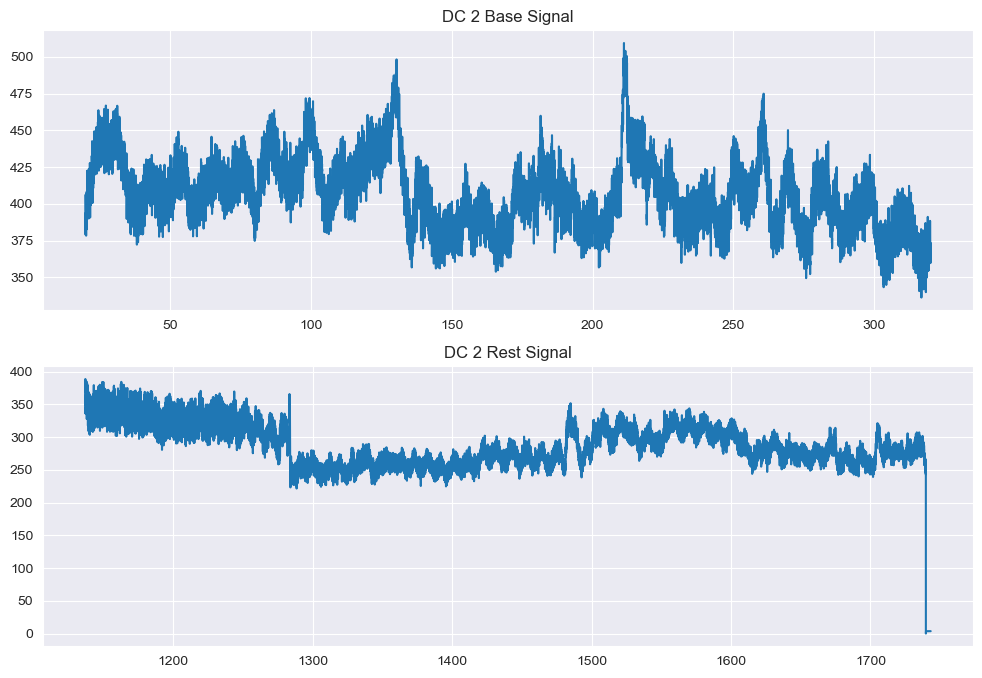

In [385]:
time_base = df_real_base['Time, s'].values
dc_base = df_real_base['DC 2 A'].values

time_rest = df_real_rest['Time, s'].values
dc_rest = df_real_rest['DC 2 A'].values

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 2 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 2 Rest Signal")
plt.show()

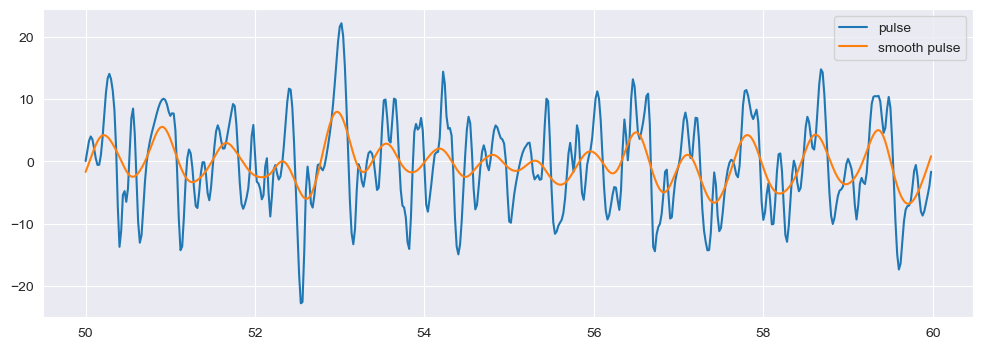

In [364]:
imf_base_2 = emd.sift.sift(dc_base)
pulse = imf_base_2[:, 1] + imf_base_2[:, 2] + imf_base_2[:, 3]
pulse_sm = pd.Series(pulse).rolling(15, center=True).mean().to_numpy()
pulse_gs = gaussian_filter1d(pulse_sm, 4)
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[1500:2000], pulse[1500:2000])
plt.plot(time_base[1500:2000], pulse_gs[1500:2000])
plt.legend(['pulse', "smooth pulse"])
plt.show()

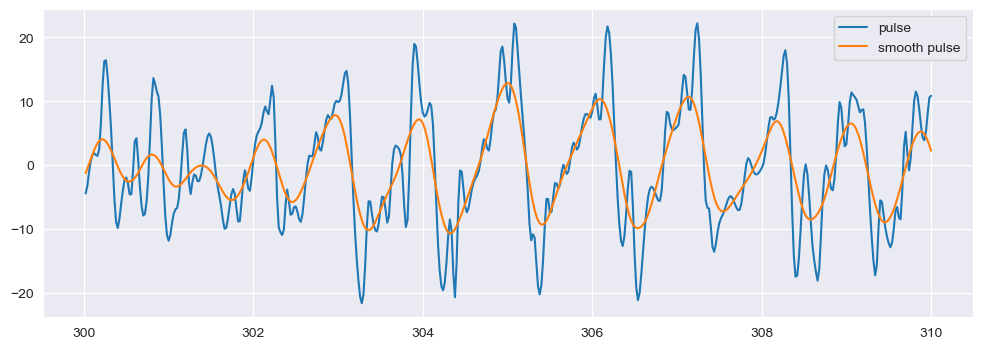

In [370]:
imf_base_2 = emd.sift.sift(dc_base)
pulse = imf_base_2[:, 1] + imf_base_2[:, 2] + imf_base_2[:, 3]
pulse_sm = pd.Series(pulse).rolling(15, center=True).mean().to_numpy()
pulse_gs = gaussian_filter1d(pulse_sm, 4)
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[-1000:-500], pulse[-1000:-500])
plt.plot(time_base[-1000:-500], pulse_gs[-1000:-500])
plt.legend(['pulse', "smooth pulse"])
plt.show()

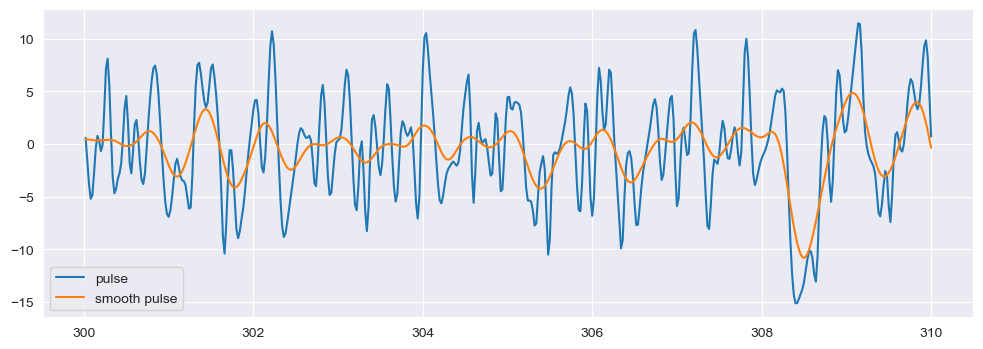

In [373]:
imf_base_2 = emd.sift.sift(dc_base)
pulse = imf_base_2[:, 1] + imf_base_2[:, 2]
pulse_sm = pd.Series(pulse).rolling(15, center=True).mean().to_numpy()
pulse_gs = gaussian_filter1d(pulse_sm, 4)
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[-1000:-500], pulse[-1000:-500])
plt.plot(time_base[-1000:-500], pulse_gs[-1000:-500])
plt.legend(['pulse', "smooth pulse"])
plt.show()

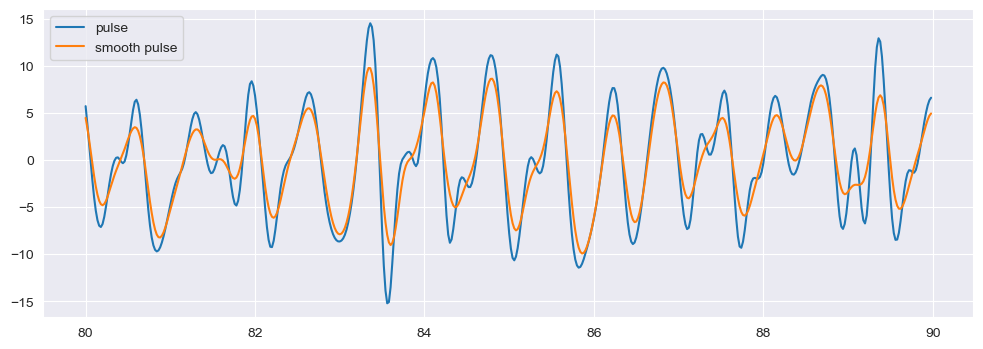

In [354]:
imf_base_2 = emd.sift.sift(dc_base)
pulse = imf_base_2[:, 2] + imf_base_2[:, 3]
pulse_sm = pd.Series(pulse).rolling(12, center=True).mean().to_numpy()
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[3000:3500], pulse[3000:3500])
plt.plot(time_base[3000:3500], pulse_sm[3000:3500])
plt.legend(['pulse', "smooth pulse"])
plt.show()

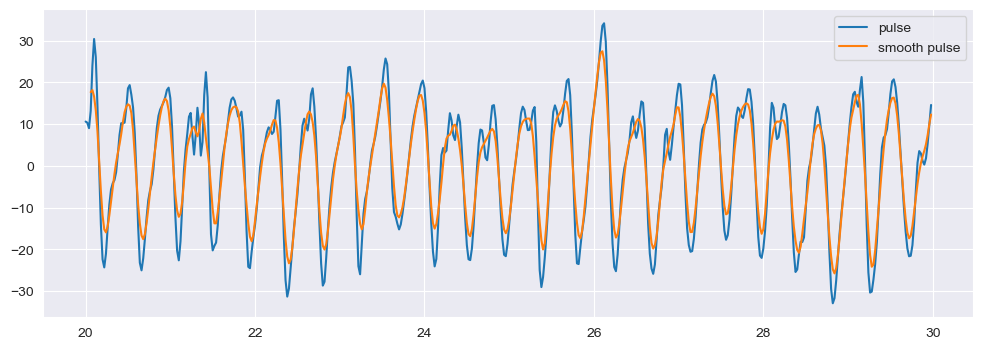

In [344]:
imf_rest_2 = emd.sift.sift(dc_rest)
pulse = imf_rest_2[:, 1] + imf_rest_2[:, 2] + imf_rest_2[:, 3]
pulse_sm = pd.Series(pulse).rolling(7, center=True).mean().to_numpy()
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[:500], pulse[:500])
plt.plot(time_base[:500], pulse_sm[:500])
plt.legend(['pulse', "smooth pulse"])
plt.show()

In [367]:
def get_rr_base(signal, time):
    imf_base = emd.sift.sift(signal)
    imf_pulse_base = imf_base[:, 1] + imf_base[:, 2] + imf_base[:, 3]
    pulse_sm = pd.Series(imf_pulse_base).rolling(15, center=True).mean().to_numpy()
    pulse = gaussian_filter1d(pulse_sm, 4)
    dy = np.gradient(pulse)
    smoothed_dy = gaussian_filter1d(dy, 4.1)
    minimums = []
    for i in range(len(smoothed_dy) - 1):
        if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
            minimums.append(i)
    rr = []
    rr_times = []
    for i in range(1, len(minimums)):
        rr.append(time[minimums[i]] - time[minimums[i-1]])
        rr_times.append(time[minimums[i]])
    return rr_times, rr

def get_rr_rest(signal, time):
    imf_rest = emd.sift.sift(signal)
    imf_pulse_rest = imf_rest[:, 1] + imf_rest[:, 2] + imf_rest[:, 3]
    pulse = pd.Series(imf_pulse_rest).rolling(7, center=True).mean().to_numpy()
    dy = np.gradient(pulse)
    smoothed_dy = gaussian_filter1d(dy, 4.1)
    minimums = []
    for i in range(len(smoothed_dy) - 1):
        if smoothed_dy[i] <= 0 and smoothed_dy[i + 1] >= 0:
            minimums.append(i)
    rr = []
    rr_times = []
    for i in range(1, len(minimums)):
        rr.append(time[minimums[i]] - time[minimums[i-1]])
        rr_times.append(time[minimums[i]])
    return rr_times, rr

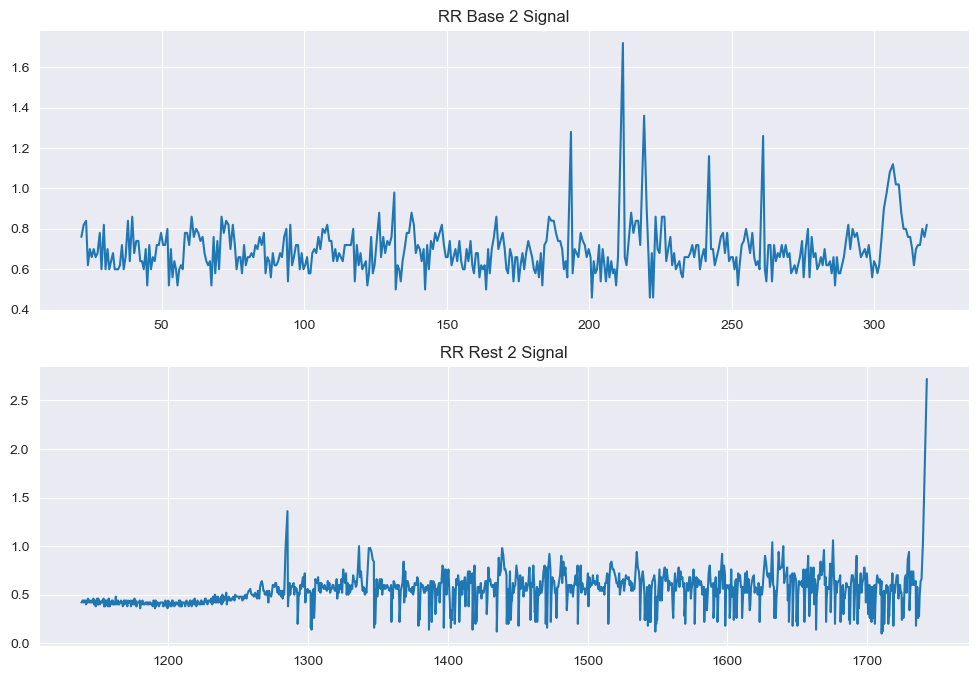

In [368]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_2, rr_base_2 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_2, rr_base_2)
axis[0].set_title("RR Base 2 Signal")

rr_times_rest_2, rr_rest_2 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_2, rr_rest_2)
axis[1].set_title("RR Rest 2 Signal")
plt.show()

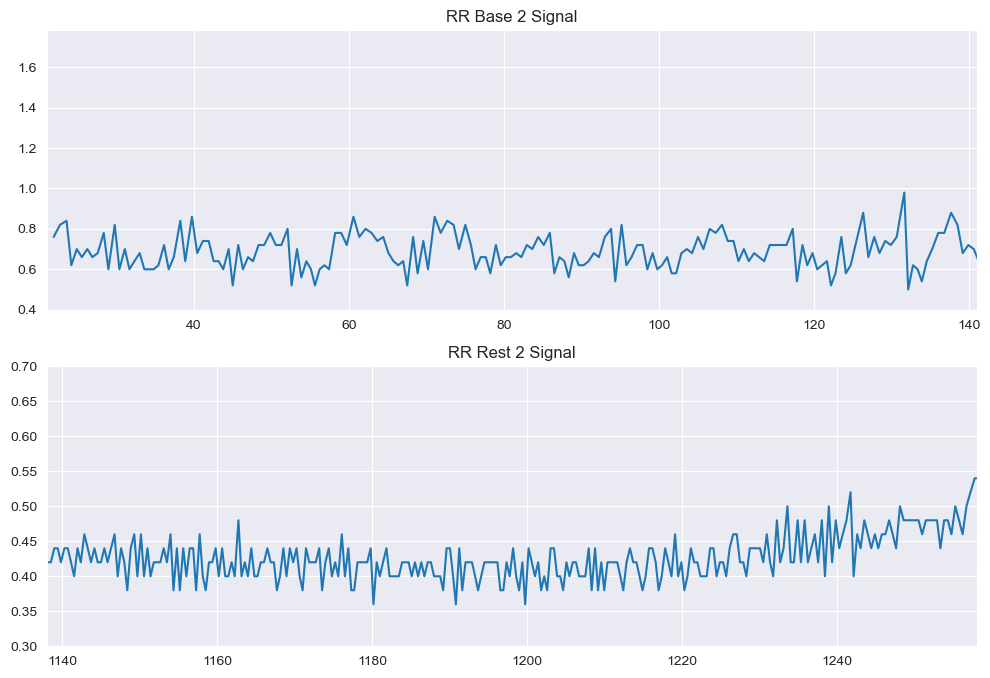

In [386]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_2, rr_base_2 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_2, rr_base_2)
axis[0].set_title("RR Base 2 Signal")
axis[0].set_xlim([21, 141])
rr_times_rest_2, rr_rest_2 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_2, rr_rest_2)
axis[1].set_title("RR Rest 2 Signal")
axis[1].set_xlim([1138, 1258])
axis[1].set_ylim([0.3, 0.7])
plt.show()

In [377]:
rr_times_base_2[0]

21.88

In [378]:
rr_times_rest_2[0]

1138.1

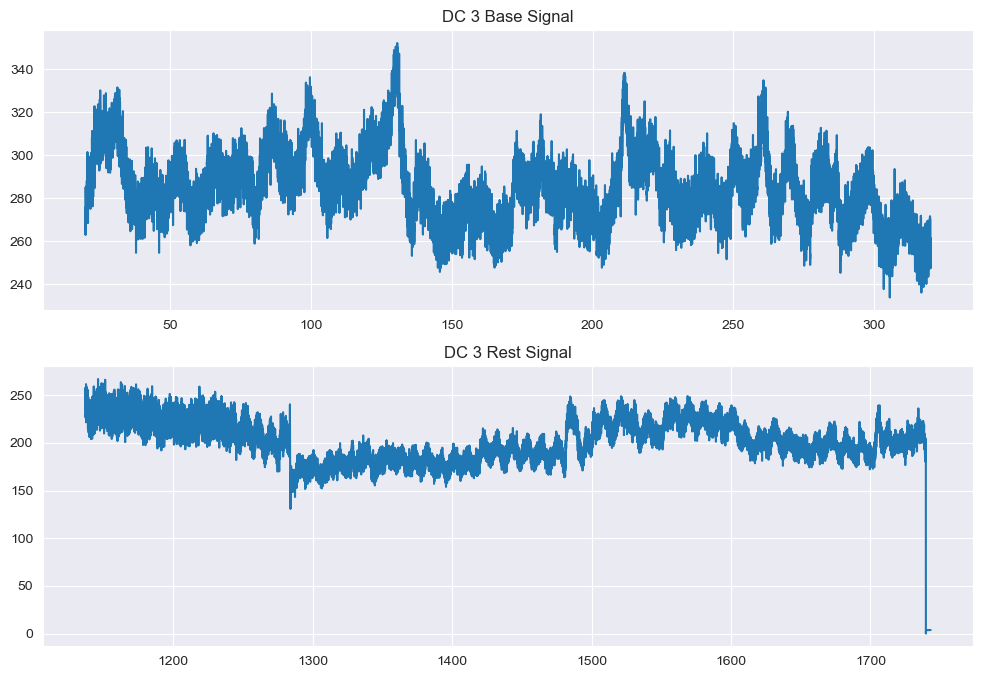

In [388]:
time_base = df_real_base['Time, s'].values
dc_base = df_real_base['DC 3 A'].values

time_rest = df_real_rest['Time, s'].values
dc_rest = df_real_rest['DC 3 A'].values

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 3 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 3 Rest Signal")
plt.show()

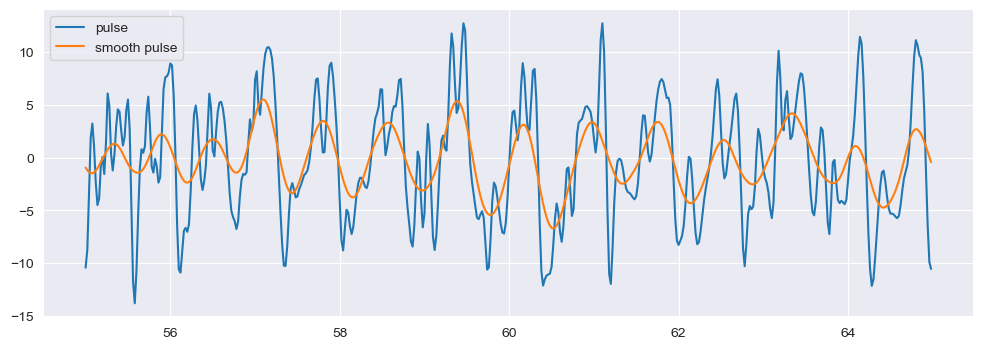

In [375]:
imf_base_3 = emd.sift.sift(dc_base)
pulse = imf_base_3[:, 1] + imf_base_3[:, 2] + imf_base_3[:, 3]
pulse_sm = pd.Series(pulse).rolling(15, center=True).mean().to_numpy()
pulse_gs = gaussian_filter1d(pulse_sm, 4)
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[1750:2250], pulse[1750:2250])
plt.plot(time_base[1750:2250], pulse_gs[1750:2250])
plt.legend(['pulse', "smooth pulse"])
plt.show()

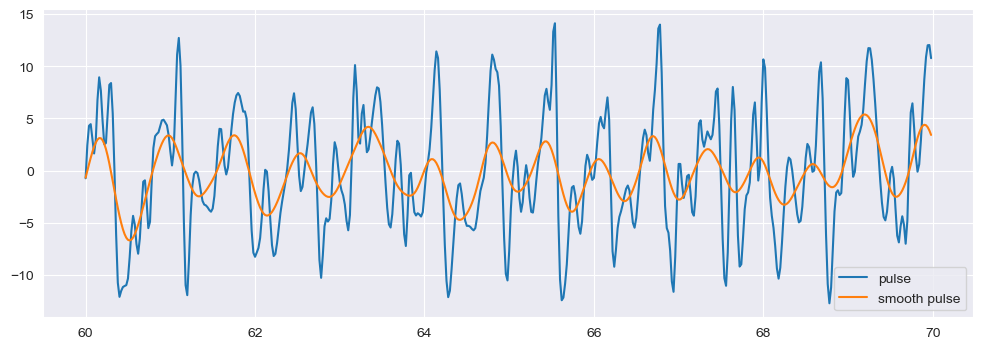

In [376]:
imf_base_3 = emd.sift.sift(dc_base)
pulse = imf_base_3[:, 1] + imf_base_3[:, 2] + imf_base_3[:, 3]
pulse_sm = pd.Series(pulse).rolling(15, center=True).mean().to_numpy()
pulse_gs = gaussian_filter1d(pulse_sm, 4)
figure, axis = plt.subplots(1, 1, figsize=(12, 4))
plt.plot(time_base[2000:2500], pulse[2000:2500])
plt.plot(time_base[2000:2500], pulse_gs[2000:2500])
plt.legend(['pulse', "smooth pulse"])
plt.show()

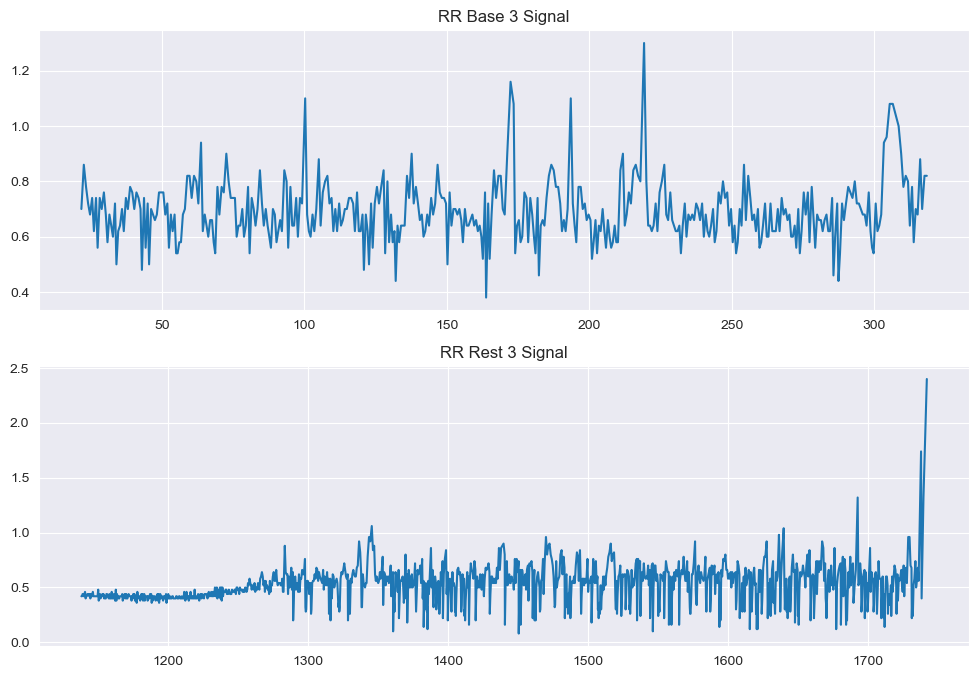

In [372]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_3, rr_base_3 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_3, rr_base_3)
axis[0].set_title("RR Base 3 Signal")
rr_times_rest_3, rr_rest_3 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_3, rr_rest_3)
axis[1].set_title("RR Rest 3 Signal")
plt.show()

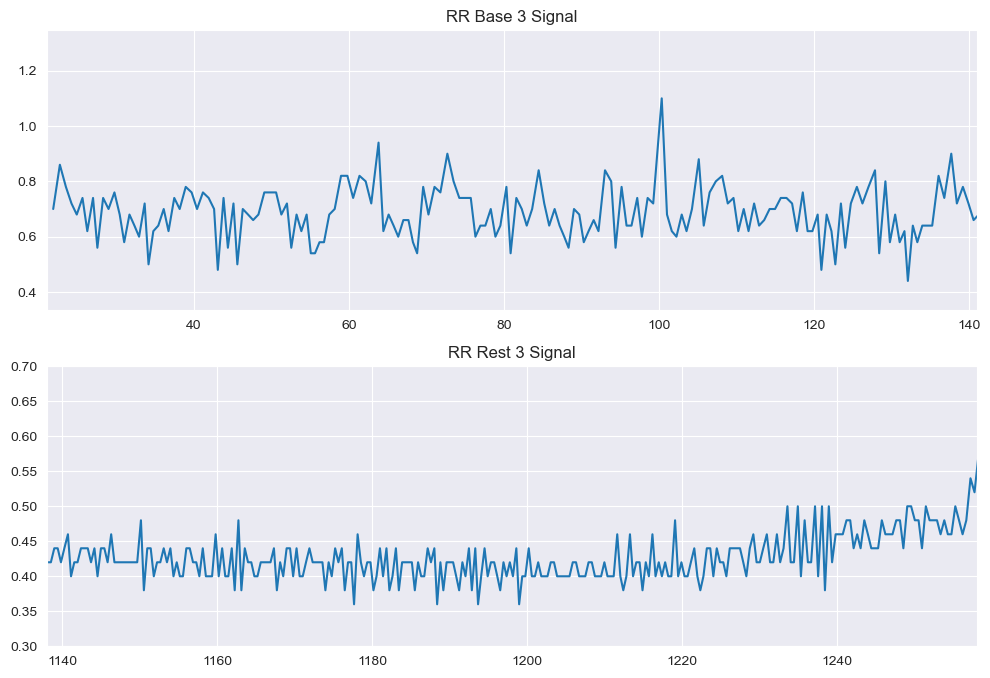

In [389]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_3, rr_base_3 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_3, rr_base_3)
axis[0].set_title("RR Base 3 Signal")
axis[0].set_xlim([21, 141])
rr_times_rest_3, rr_rest_3 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_3, rr_rest_3)
axis[1].set_title("RR Rest 3 Signal")
axis[1].set_xlim([1138, 1258])
axis[1].set_ylim([0.3, 0.7])
plt.show()

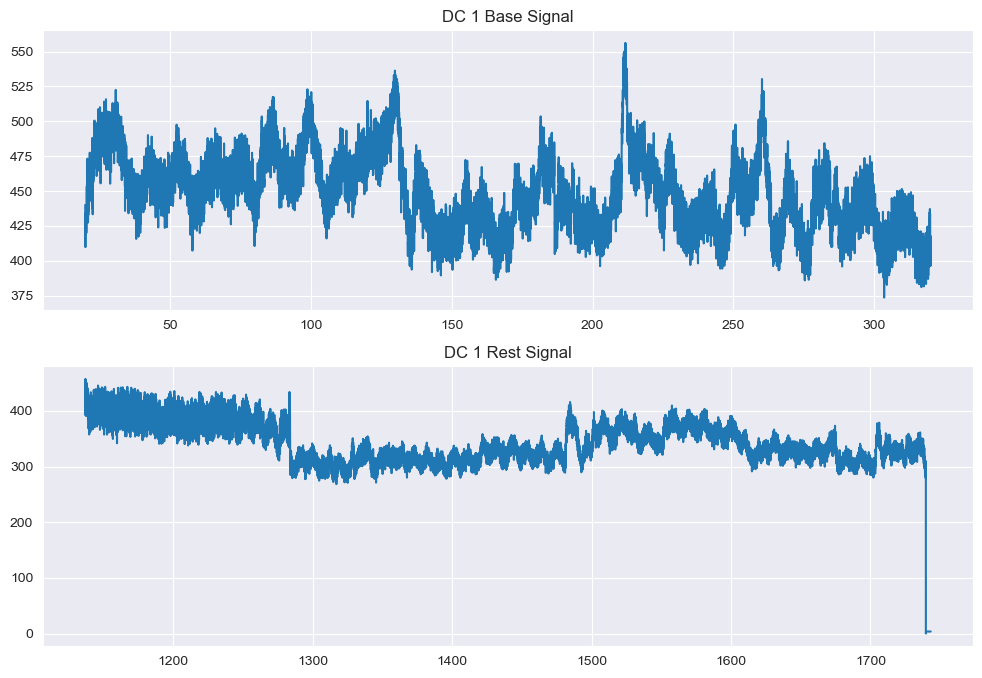

In [392]:
time_base = df_real_base['Time, s'].values
dc_base = df_real_base['DC 1 A'].values

time_rest = df_real_rest['Time, s'].values
dc_rest = df_real_rest['DC 1 A'].values

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 1 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 1 Rest Signal")
plt.show()

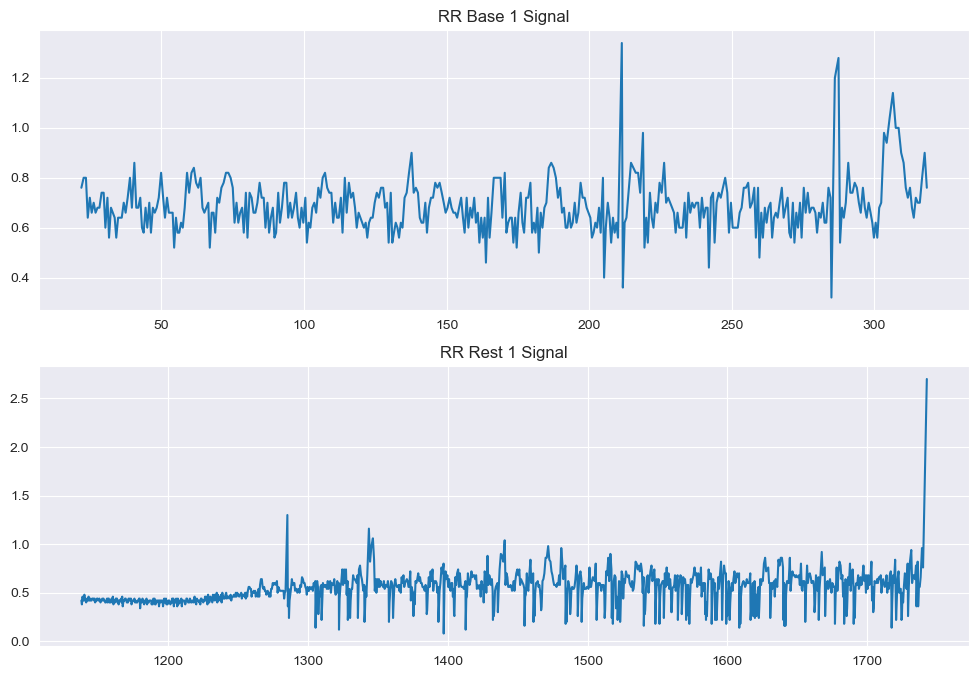

In [393]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_1, rr_base_1 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_1, rr_base_1)
axis[0].set_title("RR Base 1 Signal")
rr_times_rest_1, rr_rest_1 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_1, rr_rest_1)
axis[1].set_title("RR Rest 1 Signal")
plt.show()

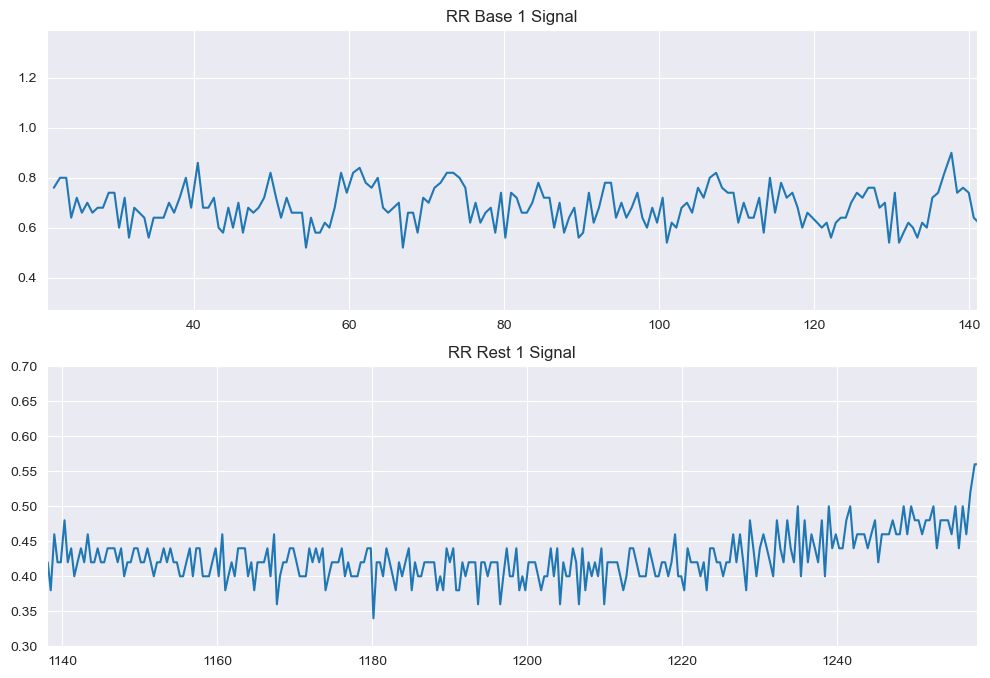

In [394]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(rr_times_base_1, rr_base_1)
axis[0].set_title("RR Base 1 Signal")
axis[0].set_xlim([21, 141])

axis[1].plot(rr_times_rest_1, rr_rest_1)
axis[1].set_title("RR Rest 1 Signal")
axis[1].set_xlim([1138, 1258])
axis[1].set_ylim([0.3, 0.7])
plt.show()

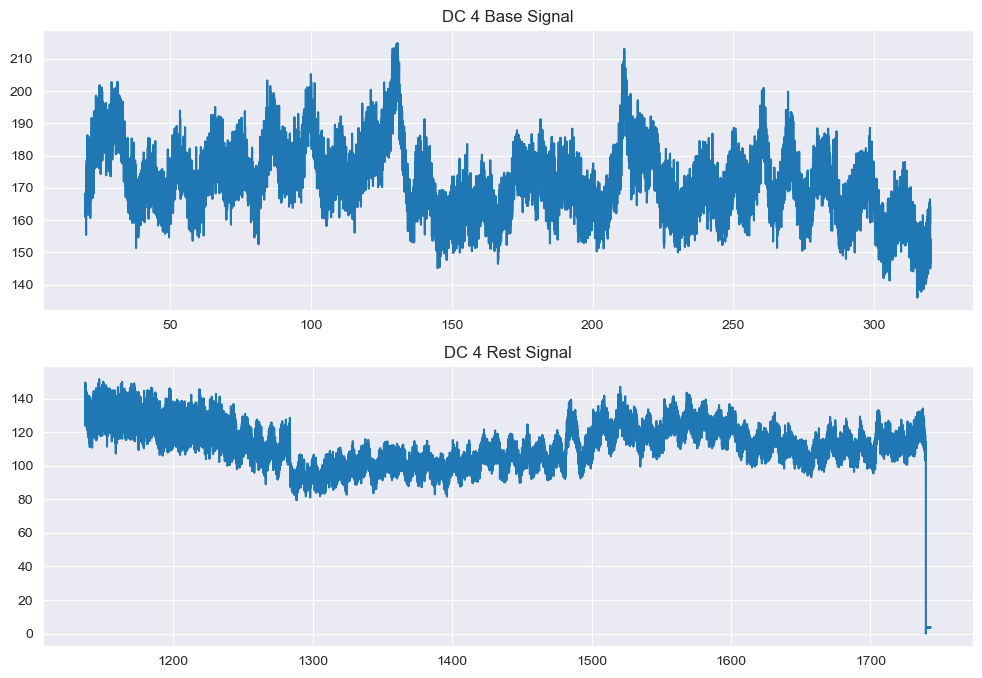

In [395]:
time_base = df_real_base['Time, s'].values
dc_base = df_real_base['DC 4 A'].values

time_rest = df_real_rest['Time, s'].values
dc_rest = df_real_rest['DC 4 A'].values

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 4 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 4 Rest Signal")
plt.show()

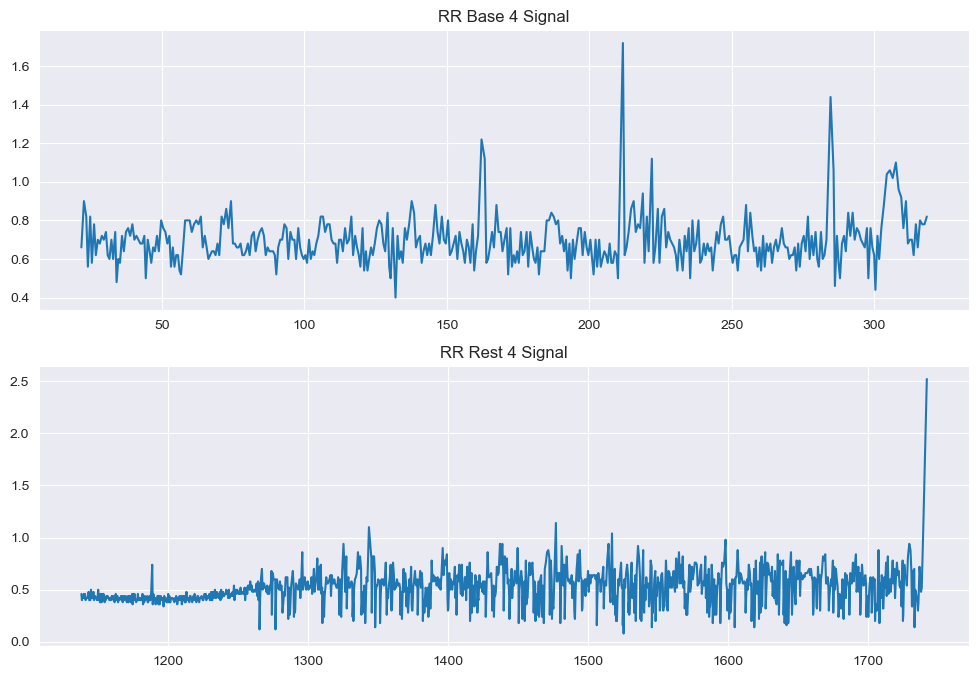

In [396]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_4, rr_base_4 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_4, rr_base_4)
axis[0].set_title("RR Base 4 Signal")
rr_times_rest_4, rr_rest_4 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_4, rr_rest_4)
axis[1].set_title("RR Rest 4 Signal")
plt.show()

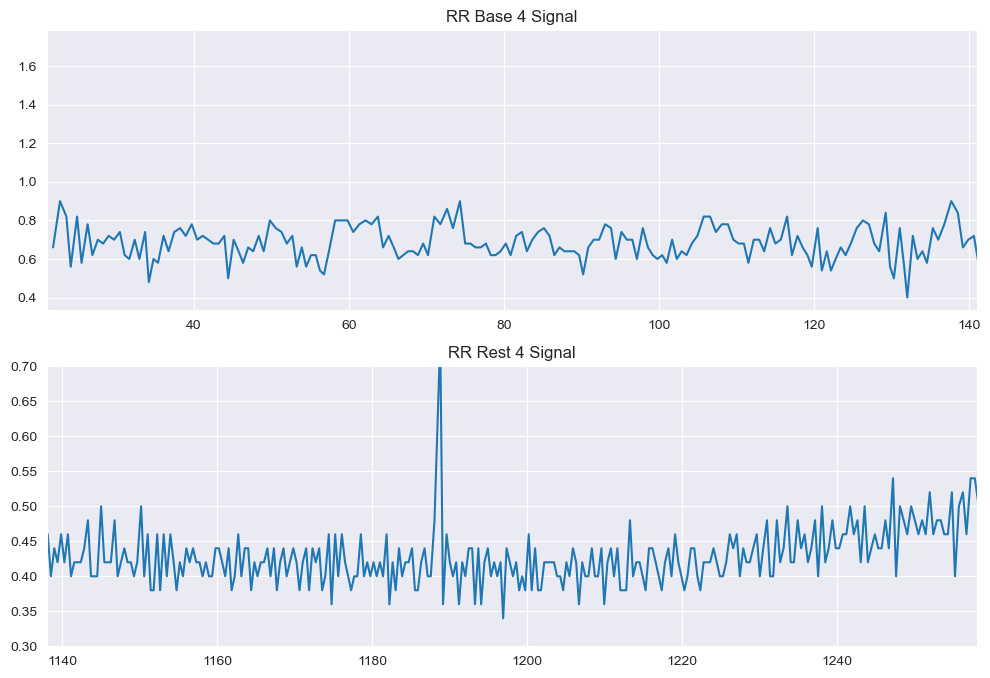

In [397]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(rr_times_base_4, rr_base_4)
axis[0].set_title("RR Base 4 Signal")
axis[0].set_xlim([21, 141])

axis[1].plot(rr_times_rest_4, rr_rest_4)
axis[1].set_title("RR Rest 4 Signal")
axis[1].set_xlim([1138, 1258])
axis[1].set_ylim([0.3, 0.7])
plt.show()

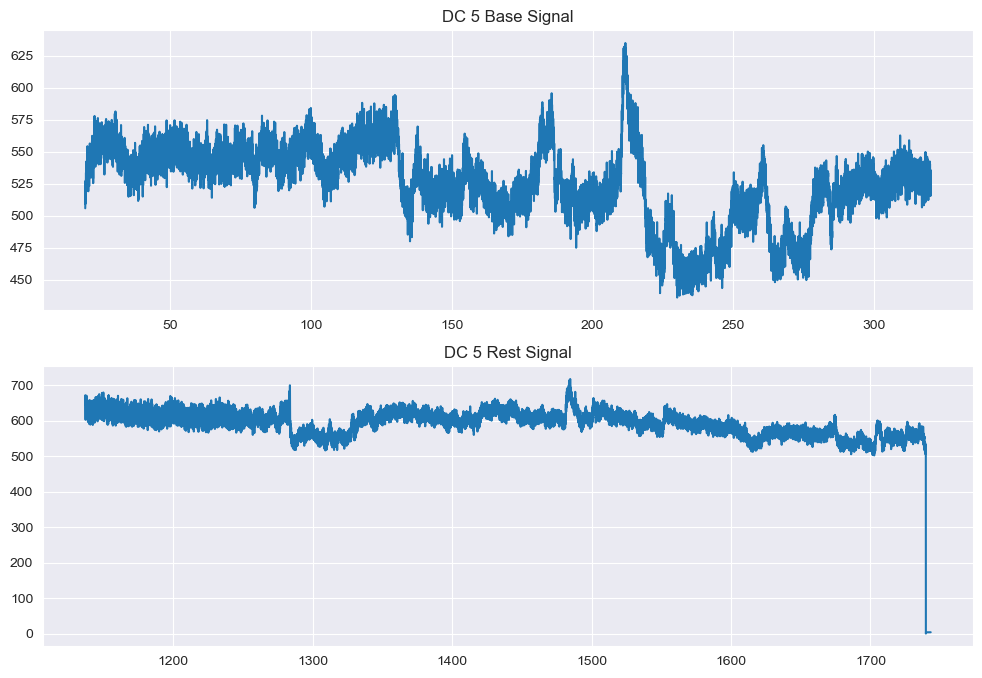

In [398]:
time_base = df_real_base['Time, s'].values
dc_base = df_real_base['DC 5 A'].values

time_rest = df_real_rest['Time, s'].values
dc_rest = df_real_rest['DC 5 A'].values

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(time_base, dc_base)
axis[0].set_title("DC 5 Base Signal")

axis[1].plot(time_rest, dc_rest)
axis[1].set_title("DC 5 Rest Signal")
plt.show()

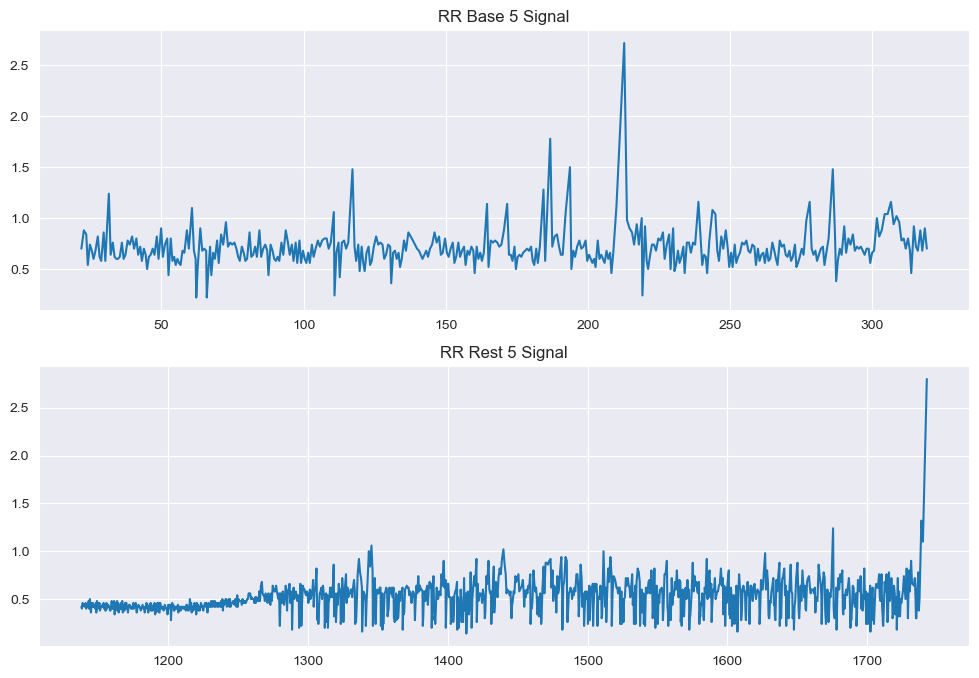

In [399]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
rr_times_base_5, rr_base_5 = get_rr_base(dc_base, time_base)
axis[0].plot(rr_times_base_5, rr_base_5)
axis[0].set_title("RR Base 5 Signal")
rr_times_rest_5, rr_rest_5 = get_rr_rest(dc_rest, time_rest)
axis[1].plot(rr_times_rest_5, rr_rest_5)
axis[1].set_title("RR Rest 5 Signal")
plt.show()

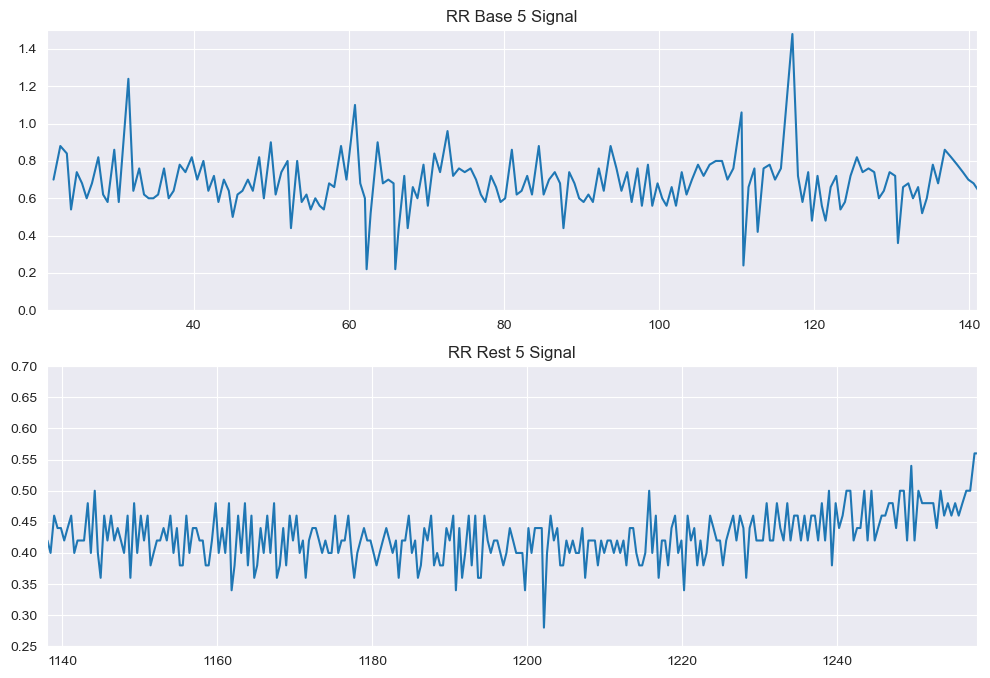

In [402]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))

axis[0].plot(rr_times_base_5, rr_base_5)
axis[0].set_title("RR Base 5 Signal")
axis[0].set_xlim([21, 141])
axis[0].set_ylim([0.0, 1.5])

axis[1].plot(rr_times_rest_5, rr_rest_5)
axis[1].set_title("RR Rest 5 Signal")
axis[1].set_xlim([1138, 1258])
axis[1].set_ylim([0.25, 0.7])
plt.show()

In [403]:
def remove_outliers_base(rr_times, rr):
    start_ind, end_ind = 0, 0
    for i in range(1, len(rr_times)):
        if rr_times[i - 1] < 21 and rr_times[i] >= 21:
            start_ind = i
        elif rr_times[i - 1] <= 141 and rr_times[i] > 141:
            end_ind = i
    rr_times_chosen = rr_times[start_ind:end_ind]
    rr_base_chosen = rr[start_ind:end_ind]

    outliers = []
    for i in range(len(rr_base_chosen)):
        if rr_base_chosen[i] > 1:
            outliers.append(i)
    rr_base_times_fin = rr_times_chosen.copy()
    rr_base_fin = rr_base_chosen.copy()
    for i in sorted(outliers, reverse=True):
        del rr_base_times_fin[i]
        del rr_base_fin[i]
    return rr_base_times_fin, rr_base_fin

def remove_outliers_rest(rr_times, rr):
    start_ind, end_ind = 0, 0
    for i in range(1, len(rr_times)):
        if rr_times[i - 1] < 1138 and rr_times[i] >= 1138:
            start_ind = i
        elif rr_times[i - 1] <= 1258 and rr_times[i] > 1258:
            end_ind = i
    rr_times_chosen = rr_times[start_ind:end_ind]
    rr_rest_chosen = rr[start_ind:end_ind]
    

    outliers = []
    for i in range(len(rr_rest_chosen)):
        if rr_rest_chosen[i] > 0.6:
            outliers.append(i)


    rr_rest_times_fin = rr_times_chosen.copy()
    rr_rest_fin = rr_rest_chosen.copy()
    

    for i in sorted(outliers, reverse=True):
        del rr_rest_times_fin[i]
        del rr_rest_fin[i]

    return rr_rest_times_fin, rr_rest_fin

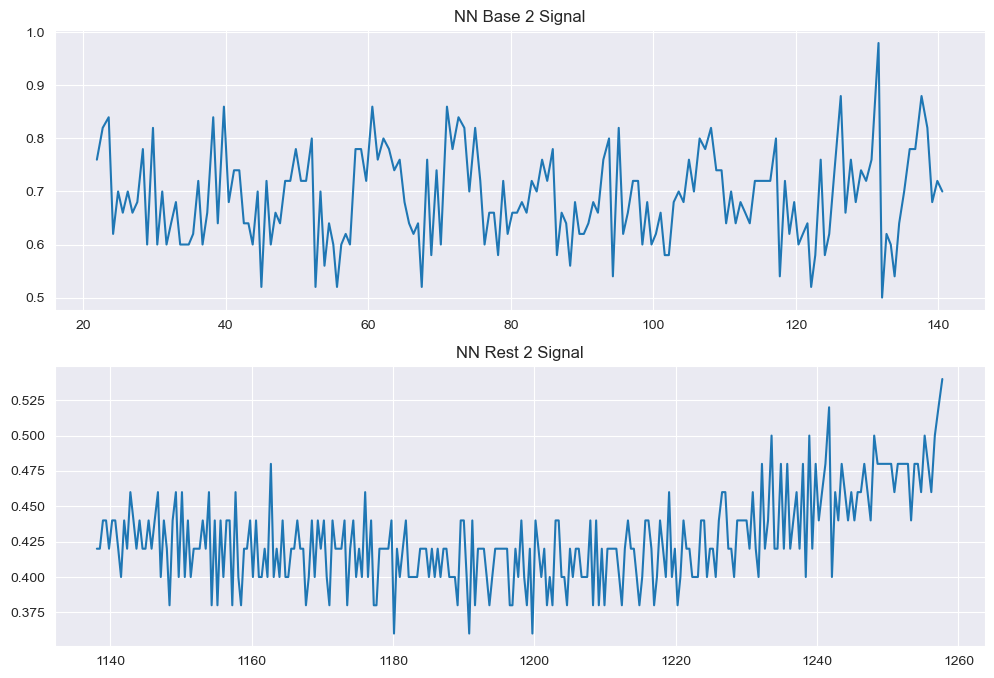

In [391]:
nn_times_base_2, nn_base_2 = remove_outliers_base(rr_times_base_2, rr_base_2)
nn_times_rest_2, nn_rest_2 = remove_outliers_rest(rr_times_rest_2, rr_rest_2)

figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(nn_times_base_2, nn_base_2)
axis[0].set_title("NN Base 2 Signal")

axis[1].plot(nn_times_rest_2, nn_rest_2)
axis[1].set_title("NN Rest 2 Signal")
plt.show()

In [405]:
base_1_min_5 = []
base_1_min_5_times = []
rest_1_min_5 = []
rest_1_min_5_times = []

def split_into_min_base(rr_times, rr):
    global base_1_min_5
    global base_1_min_5_times
    edges = [0] * 3
    for i in range(len(rr)-1):
        if rr_times[i] <= 81 and rr_times[i+1] > 81:
            edges[1] = i
    edges[2] = len(rr_times)
    for i in range(1, 3):
        base_1_min_5_times.append(rr_times[edges[i-1]:edges[i]])
        base_1_min_5.append(rr[edges[i-1]:edges[i]])

def split_into_min_rest(rr_times, rr):
    global rest_1_min_5
    global rest_1_min_5_times
    edges = [0] * 3
    for i in range(len(rr)-1):
        if rr_times[i] <= 1198 and rr_times[i+1] > 1198:
            edges[1] = i
    edges[2] = len(rr_times)
    for i in range(1, 3):
        rest_1_min_5_times.append(rr_times[edges[i-1]:edges[i]])
        rest_1_min_5.append(rr[edges[i-1]:edges[i]])

In [406]:
split_into_min_base(nn_times_base_2, nn_base_2)
split_into_min_rest(nn_times_rest_2, nn_rest_2)

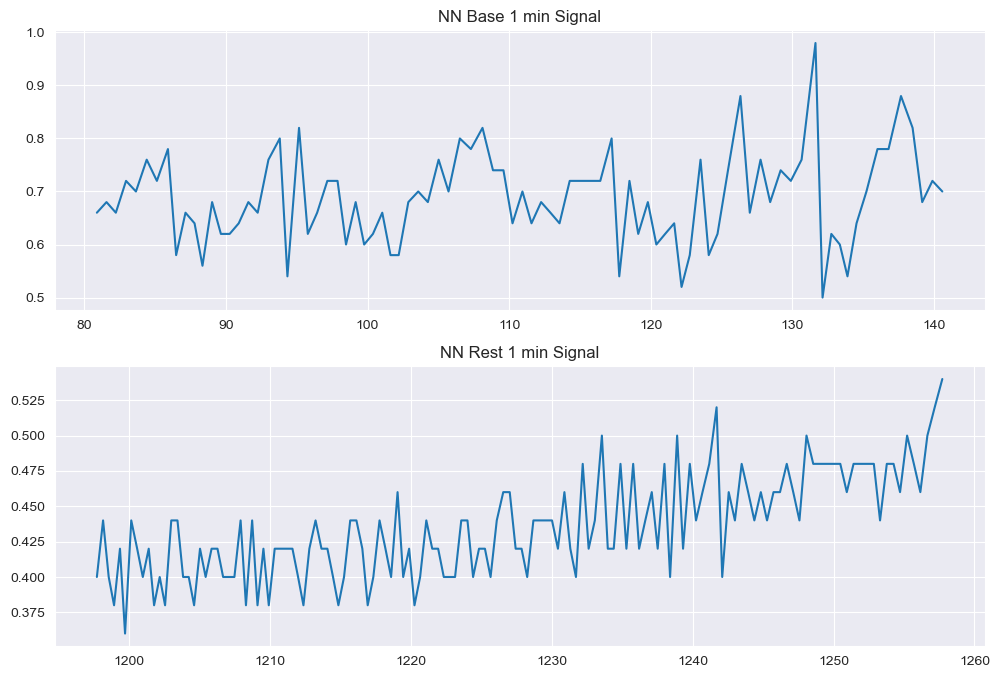

In [409]:
figure, axis = plt.subplots(2, 1, figsize=(12, 8))
axis[0].plot(base_1_min_5_times[1], base_1_min_5[1])
axis[0].set_title("NN Base 1 min Signal")

axis[1].plot(rest_1_min_5_times[1], rest_1_min_5[1])
axis[1].set_title("NN Rest 1 min Signal")
plt.show()

In [410]:
nn_times_base_1, nn_base_1 = remove_outliers_base(rr_times_base_1, rr_base_1)
nn_times_rest_1, nn_rest_1 = remove_outliers_rest(rr_times_rest_1, rr_rest_1)

split_into_min_base(nn_times_base_1, nn_base_1)
split_into_min_rest(nn_times_rest_1, nn_rest_1)

In [411]:
nn_times_base_3, nn_base_3 = remove_outliers_base(rr_times_base_3, rr_base_3)
nn_times_rest_3, nn_rest_3 = remove_outliers_rest(rr_times_rest_3, rr_rest_3)

split_into_min_base(nn_times_base_3, nn_base_3)
split_into_min_rest(nn_times_rest_3, nn_rest_3)

In [412]:
nn_times_base_4, nn_base_4 = remove_outliers_base(rr_times_base_4, rr_base_4)
nn_times_rest_4, nn_rest_4 = remove_outliers_rest(rr_times_rest_4, rr_rest_4)

split_into_min_base(nn_times_base_4, nn_base_4)
split_into_min_rest(nn_times_rest_4, nn_rest_4)

In [413]:
print(len(base_1_min_5_times))
print(len(base_1_min_5))

print(len(rest_1_min_5_times))
print(len(rest_1_min_5))

8
8
8
8


In [414]:
base_parameters_5 = []
rest_parameters_5 = []

for i in range(len(base_1_min_5)):
    base_parameters_5.append(hrv_parameters(base_1_min_5_times[i], base_1_min_5[i]))

for i in range(len(rest_1_min_5)):
    rest_parameters_5.append(hrv_parameters(rest_1_min_5_times[i], rest_1_min_5[i]))

all_parameters_5 = []
for i in range(len(base_parameters_5)):
    all_parameters_5.append(base_parameters_5[i].copy())
    all_parameters_5[i].append(0)
for i in range(len(rest_parameters_5)):
    all_parameters_5.append(rest_parameters_5[i].copy())
    all_parameters_5[i + len(base_parameters_5)].append(1)

hrv_data_5 = pd.DataFrame(all_parameters_5, columns=['SDNN', 'pNN50', 'RMSSD', 'LFHF', 'SI', 'stress'])
hrv_data_5

,SDNN,pNN50,RMSSD,LFHF,SI,stress
0,0.087173,0.647059,0.113904,1.551618,40.934412,0
1,0.084711,0.597701,0.110339,1.574934,18.812608,0
2,0.076752,0.552941,0.085461,1.416146,33.604044,0
3,0.073617,0.579545,0.083530,1.249472,24.062297,0
4,0.088522,0.635294,0.109330,1.091232,20.934998,0
5,0.088070,0.709302,0.119378,1.006135,23.067111,0
6,0.086415,0.564706,0.105674,1.027221,18.869801,0
7,0.084736,0.590909,0.104772,1.307916,19.691410,0
8,0.022433,0.169014,0.034884,0.536608,214.281551,1
9,0.035487,0.173913,0.036949,0.266633,134.712039,1


### Проверка моделей на данных второго испытуемого <a id="ml2"></a>
[Вернуться к содержанию](#contents)

In [415]:
X_5 = hrv_data_5[feature_cols]
y_5 = hrv_data_5.stress

In [416]:
y_pred = rdg.predict(X_5)
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_5, y_int)
print("Accuracy:", accuracy)

Accuracy: 0.875


In [428]:
y_pred = logreg.predict(X_5)
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_5, y_int)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [419]:
y_pred = neigh.predict(X_5)
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_5, y_int)
print("Accuracy:", accuracy)

Accuracy: 0.9375


In [420]:
cnf_matrix = metrics.confusion_matrix(y_5, y_int)
cnf_matrix

array([[8, 0],
       [1, 7]])

In [421]:
y_pred = clf.predict(X_5)
accuracy = accuracy_score(y_5, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9375


In [423]:
y_pred = dectree.predict(X_5)
accuracy = accuracy_score(y_5, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [424]:
y_pred = rf.predict(X_5)
accuracy = accuracy_score(y_5, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


### Обучение и проверка моделей на всех данных <a id="ml_all"></a>
[Вернуться к содержанию](#contents)

In [429]:
hrv_merged = pd.concat([hrv_data, hrv_data_5], ignore_index=True)
hrv_merged

,SDNN,pNN50,RMSSD,LFHF,SI,stress
0,0.053028,0.371795,0.075786,0.740164,48.807122,0
1,0.064601,0.493506,0.076786,0.480070,35.202430,0
2,0.041628,0.437500,0.062008,0.467093,70.625210,0
3,0.049672,0.395062,0.070518,0.473073,36.538297,0
4,0.062347,0.537500,0.080808,0.471317,34.285616,0
...,...,...,...,...,...,...
67,0.036068,0.202899,0.039047,0.216860,83.506369,1
68,0.022433,0.147887,0.036192,0.536608,235.709706,1
69,0.035342,0.173913,0.038636,0.632447,207.249290,1
70,0.029144,0.335714,0.048077,0.630543,199.947960,1


In [458]:
X_train.shape

(39, 5)

In [466]:
y_train.values

array([1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0])

In [459]:
X_test.shape

(17, 5)

In [460]:
X_5.shape

(16, 5)

In [461]:
X_train_all.shape

(50, 5)

In [462]:
X_test_all.shape

(22, 5)

In [450]:
feature_cols = ['SDNN', 'pNN50', 'RMSSD', 'LFHF', 'SI']
X_all = hrv_merged[feature_cols]
y_all = hrv_merged.stress
X_train_all, X_test_all, y_train_all, y_test_all = train_test_split(X_all, y_all, test_size=0.3, random_state=33, stratify=y_all)

In [451]:
rdg_all = Ridge()
rdg_all.fit(X_train_all, y_train_all)
y_pred = rdg_all.predict(X_test_all)
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_test_all, y_int)
print("Ridge Regression Accuracy:", accuracy)

Ridge Regression Accuracy: 0.9545454545454546


In [452]:
cnf_matrix = metrics.confusion_matrix(y_test_all, y_int)
cnf_matrix

array([[15,  0],
       [ 1,  6]])

In [453]:
logreg_all = LogisticRegression(random_state=16)
logreg_all.fit(X_train_all, y_train_all)
y_pred = logreg_all.predict(X_test_all)
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_test_all, y_int)
print("LogisticRegression Accuracy:", accuracy)

LogisticRegression Accuracy: 1.0


In [454]:
neigh_all = KNeighborsClassifier(n_neighbors=3)
neigh_all.fit(X_train_all, y_train_all)
y_pred = neigh_all.predict(X_test_all)
y_int = np.rint(y_pred)
accuracy = accuracy_score(y_test_all, y_int)
print("KNeighborsClassifier Accuracy:", accuracy)

KNeighborsClassifier Accuracy: 0.9545454545454546


In [455]:
clf_all = svm.SVC(kernel='linear')
clf_all.fit(X_train_all, y_train_all)
y_pred = clf_all.predict(X_test_all)
accuracy = accuracy_score(y_test_all, y_pred)
print("SVM Accuracy:", accuracy)

SVM Accuracy: 1.0


In [456]:
dectree_all = DecisionTreeClassifier()
dectree_all.fit(X_train_all,y_train_all)
y_pred = dectree_all.predict(X_test_all)
accuracy = accuracy_score(y_test_all, y_pred)
print("DecisionTree Accuracy:", accuracy)

DecisionTree Accuracy: 0.9545454545454546


In [457]:
rf_all = RandomForestClassifier()
rf_all.fit(X_train_all, y_train_all)
y_pred = rf_all.predict(X_test_all)
accuracy = accuracy_score(y_test_all, y_pred)
print("RandomForest Accuracy:", accuracy)

RandomForest Accuracy: 1.0
